In [ ]:
!pip install -U -q pydrive google-colab

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 49.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive

# Authenticate and mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pandas sklearn statsmodels


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
import os
import pandas as pd
from sklearn.metrics import cohen_kappa_score
from statsmodels.stats.inter_rater import fleiss_kappa

In [ ]:
import os
import pandas as pd
from sklearn.metrics import cohen_kappa_score
from statsmodels.stats.inter_rater import fleiss_kappa

# Define the paths to the annotated data for the three judges
paths = [
    '/content/drive/MyDrive/data_set_emotion/Annotated data/1',
    '/content/drive/MyDrive/data_set_emotion/Annotated data/2',
    '/content/drive/MyDrive/data_set_emotion/Annotated data/3'
]

# Define a function to load and concatenate the data files for each judge from .xlsx files
def load_data(files_path):
    file_list = [f for f in os.listdir(files_path) if f.startswith('data_sin_final_19_05_output_part') and f.endswith('.xlsx')]
    df_list = []
    for file in sorted(file_list):
        df = pd.read_excel(os.path.join(files_path, file))  # Use read_excel to load .xlsx files
        df_list.append(df)
    return pd.concat(df_list, ignore_index=True)

# Load the data for all judges
judge_1_data = load_data(paths[0])
judge_2_data = load_data(paths[1])
judge_3_data = load_data(paths[2])

# Ensure that the datasets have no missing annotations by filling NaN with a placeholder
judge_1_data['Emotion'].fillna('Unknown', inplace=True)
judge_2_data['Emotion'].fillna('Unknown', inplace=True)
judge_3_data['Emotion'].fillna('Unknown', inplace=True)

# Align the datasets by index, artist, and song columns
merged_data = pd.DataFrame({
    'Index': judge_1_data['Index'],
    'Artist': judge_1_data['Artist'],
    'Song': judge_1_data['Song'],
    'Comment': judge_1_data['Comment'],
    'Judge_1_Emotion': judge_1_data['Emotion'],
    'Judge_2_Emotion': judge_2_data['Emotion'],
    'Judge_3_Emotion': judge_3_data['Emotion']
})

# Print merged data to check
print(merged_data.head())


   Index               Artist         Song  \
0      0  Thisara Weerasinghe  Ansathu Oba   
1      1  Thisara Weerasinghe  Ansathu Oba   
2      2  Thisara Weerasinghe  Ansathu Oba   
3      3  Thisara Weerasinghe  Ansathu Oba   
4      4  Thisara Weerasinghe  Ansathu Oba   

                                             Comment Judge_1_Emotion  \
0  බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1  ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2             මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3  මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                                 ඇත්තටම ලස්සනයි ඒක🥰           Happy   

  Judge_2_Emotion Judge_3_Emotion  
0       Satisfied       Satisfied  
1         Pleased           Happy  
2            Glad            Glad  
3         Pleased           Happy  
4         Pleased           Happy  


<ipython-input-5-278c6e7a5bac>:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  judge_1_data['Emotion'].fillna('Unknown', inplace=True)
<ipython-input-5-278c6e7a5bac>:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', t

In [ ]:
merged_data.shape

(63471, 7)

In [ ]:
# Save merged_data as an Excel file
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/merged_data.xlsx'
merged_data.to_excel(file_path, index=False)


In [ ]:
# Load the Excel file into a DataFrame
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/merged_data.xlsx'

merged_data = pd.read_excel(file_path)


In [ ]:
# Identify rows with missing values in any of the emotion columns
rows_with_missing_values = merged_data[
    merged_data[['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']].isna().any(axis=1)
]

# Display rows with missing values
print(rows_with_missing_values)


Empty DataFrame
Columns: [Index, Artist, Song, Comment, Judge_1_Emotion, Judge_2_Emotion, Judge_3_Emotion]
Index: []


In [ ]:
# Concatenate all the values from the three emotion columns and get unique categories
unique_emotions = pd.unique(
    pd.concat([merged_data['Judge_1_Emotion'], merged_data['Judge_2_Emotion'], merged_data['Judge_3_Emotion']])
)

# Display unique categories
print(unique_emotions)


['Satisfied' 'Content' 'Glad' 'Serene' 'Happy' 'Excited' 'Sad' 'Tired'
 'Droopy' 'Pleased' 'Tense' 'Delighted' 'Calm' 'Depressed' 'Relaxed'
 'Miserable' 'Bored' 'Alarmed' 'Gloomy' 'Astonished' 'Frustrated'
 'Annoyed' 'Ease' 'Angry' 'Distressed' 'Unknown' 'Aroused' 'Afraid'
 'Sleepy']


In [ ]:
# Filter rows where any of the emotion columns have the value 'Unknown'
rows_with_unknown = merged_data[
    merged_data[['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']].isin(['Unknown']).any(axis=1)
]

# Display rows with 'Unknown' category
print(rows_with_unknown)


       Index               Artist                    Song  \
7883   58673          Saman Lenin                   Amude   
7888   58678          Saman Lenin                   Amude   
7889   58679          Saman Lenin                   Amude   
9527   60319      Prageeth Perera                Komaliya   
9855   60647        Raini Charuka   Kaluwarata Hitha Baya   
10014  60806        Raini Charuka   Kaluwarata Hitha Baya   
11249  62041     Sandeep Jayalath                 Nuraavi   
11258  62050     Sandeep Jayalath                 Nuraavi   
11465  62258     Sandeep Jayalath                 Nuraavi   
19093  12745        Dinesh Gamage       Danena Thuru Maa    
19596  13248        Dinesh Gamage       Danena Thuru Maa    
19608  13260        Dinesh Gamage       Danena Thuru Maa    
19661  13313        Dinesh Gamage       Danena Thuru Maa    
19989  13641        Dinesh Gamage       Danena Thuru Maa    
20179  13831        Dinesh Gamage       Danena Thuru Maa    
20195  13847        Dine

In [ ]:
rows_with_unknown.shape

(56, 7)

In [ ]:
# Identify rows where any of the annotations are missing
missing_annotations = merged_data[merged_data.isnull().any(axis=1)]
missing_annotations

,Index,Artist,Song,Comment,Judge_1_Emotion,Judge_2_Emotion,Judge_3_Emotion


In [ ]:

# Prepare data for Fleiss' Kappa calculation
# We need to count the number of times each emotion is chosen by the judges for each comment
# Using value_counts to count occurrences of each label for each comment, filling missing labels with 0
emotion_categories = merged_data[['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']].apply(pd.Series.value_counts, axis=1).fillna(0)

# Convert counts to integer type
emotion_categories = emotion_categories.astype(int)

# Make sure the total number of annotations per item (row) is equal (should be 3, one from each judge)
# This is to meet the Fleiss' Kappa function requirement
emotion_categories['total'] = emotion_categories.sum(axis=1)
if not all(emotion_categories['total'] == 3):
    raise ValueError("Each item must have exactly 3 annotations. Check for missing or extra annotations.")

# Drop the 'total' column as it is not needed for Fleiss' Kappa calculation
emotion_categories = emotion_categories.drop(columns=['total'])

# Calculate Fleiss' Kappa score
kappa_score = fleiss_kappa(emotion_categories.values)

print(f'Fleiss\' Kappa score: {kappa_score}')


Fleiss' Kappa score: 0.8497093431060919


In [ ]:
# Remove rows where any of the judges assigned the emotion 'Unknown'
merged_data_filtered = merged_data[
    ~merged_data[['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']].isin(['Unknown']).any(axis=1)
]

# Display the filtered DataFrame
print(merged_data_filtered)


       Index               Artist         Song  \
0          0  Thisara Weerasinghe  Ansathu Oba   
1          1  Thisara Weerasinghe  Ansathu Oba   
2          2  Thisara Weerasinghe  Ansathu Oba   
3          3  Thisara Weerasinghe  Ansathu Oba   
4          4  Thisara Weerasinghe  Ansathu Oba   
...      ...                  ...          ...   
63466  57132  Thisara Weerasinghe  Ansathu Oba   
63467  57133  Thisara Weerasinghe  Ansathu Oba   
63468  57134  Thisara Weerasinghe  Ansathu Oba   
63469  57135  Thisara Weerasinghe  Ansathu Oba   
63470  57136  Thisara Weerasinghe  Ansathu Oba   

                                                 Comment Judge_1_Emotion  \
0      බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1      ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2                 මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3      මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                  

In [ ]:

# Prepare data for Fleiss' Kappa calculation
# We need to count the number of times each emotion is chosen by the judges for each comment
# Using value_counts to count occurrences of each label for each comment, filling missing labels with 0
emotion_categories = merged_data_filtered[['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']].apply(pd.Series.value_counts, axis=1).fillna(0)

# Convert counts to integer type
emotion_categories = emotion_categories.astype(int)

# Make sure the total number of annotations per item (row) is equal (should be 3, one from each judge)
# This is to meet the Fleiss' Kappa function requirement
emotion_categories['total'] = emotion_categories.sum(axis=1)
if not all(emotion_categories['total'] == 3):
    raise ValueError("Each item must have exactly 3 annotations. Check for missing or extra annotations.")

# Drop the 'total' column as it is not needed for Fleiss' Kappa calculation
emotion_categories = emotion_categories.drop(columns=['total'])

# Calculate Fleiss' Kappa score
kappa_score = fleiss_kappa(emotion_categories.values)

print(f'Fleiss\' Kappa score: {kappa_score}')

Fleiss' Kappa score: 0.8496031255369948


In [ ]:
# Get unique emotions for each judge
judge_1_unique_emotions = judge_1_data['Emotion'].unique()
judge_2_unique_emotions = judge_2_data['Emotion'].unique()
judge_3_unique_emotions = judge_3_data['Emotion'].unique()

# Print the unique emotions for each judge
print("Unique emotions for Judge 1:")
print(judge_1_unique_emotions)

print("\nUnique emotions for Judge 2:")
print(judge_2_unique_emotions)

print("\nUnique emotions for Judge 3:")
print(judge_3_unique_emotions)


NameError: name 'judge_1_data' is not defined

In [ ]:
# Get unique emotions from each Judge column
unique_emotions_judge_1 = merged_data['Judge_1_Emotion'].unique()
unique_emotions_judge_2 = merged_data['Judge_2_Emotion'].unique()
unique_emotions_judge_3 = merged_data['Judge_3_Emotion'].unique()

# Combine unique emotions from all columns and get the overall unique set
all_unique_emotions = set(unique_emotions_judge_1) | set(unique_emotions_judge_2) | set(unique_emotions_judge_3)

# Convert the set back to a sorted list, if needed
all_unique_emotions = sorted(all_unique_emotions)
print(all_unique_emotions)


['Afraid', 'Alarmed', 'Angry', 'Annoyed', 'Aroused', 'Astonished', 'Bored', 'Calm', 'Content', 'Delighted', 'Depressed', 'Distressed', 'Droopy', 'Ease', 'Excited', 'Frustrated', 'Glad', 'Gloomy', 'Happy', 'Miserable', 'Pleased', 'Relaxed', 'Sad', 'Satisfied', 'Serene', 'Sleepy', 'Tense', 'Tired', 'Unknown']


In [ ]:
# Assuming `all_unique_emotions` contains the unique emotions from the merged data

# Convert emotion_va keys to a set for comparison
emotion_va_keys = set(emotion_va.keys())

# Find the emotions in all_unique_emotions not present in emotion_va
missing_emotions = set(all_unique_emotions) - emotion_va_keys

print("Emotions not available in emotion_va:", missing_emotions)


Emotions not available in emotion_va: {'Tired', 'Satisfied'}


In [ ]:
# Dictionary of emotions with their valence and arousal values
emotion_va = {
    'Happy': (0.5, 0.0),
    'Excited': (0.4, 0.9),
    'Calm': (0.4, -0.4),
    'Relaxed': (0.5, -0.7),
    'Angry': (-0.5, 0.7),
    'Frustrated': (-0.7, 0.4),
    'Sad': (-0.45, -0.5),
    'Depressed': (-0.35, -0.7),
    'Afraid': (-0.4, 0.8),
    'Astonished': (0.35, 0.8),
    'Bored': (-0.5, -0.7),
    'Tense': (-0.6, 0.6),
    'Delighted': (0.8, 0.7),
    'Gloomy': (-0.6, -0.6),
    'Alarmed': (-0.4, 0.9),
    'Content': (0.6, -0.3),
    'Miserable': (-0.3, -0.6),
    'Aroused': (0.2, 1.0),
    'Sleepy': (-0.3, -0.9),
    'Annoyed': (-0.8, 0.3),
    'Droopy': (-0.5, -0.8),
    'Pleased': (0.6, 0.0),
    'Glad': (0.6, 0.4),
    'Ease': (0.4, -0.6),
    'Serene': (0.5, -0.5),
    'Distressed': (-0.6, 0.5),
    'Unknown': (0, 0)  ,
    'Tired':(-0.55, -0.75),
    'Satisfied':(0.52, -0.25)
}
# Function to get valence and arousal for each emotion
def get_va(emotion):
    return emotion_va.get(emotion, (None, None))  # Return (None, None) if emotion not found

# Apply the function to each judge's emotions
merged_data['Judge_1_VA'] = merged_data['Judge_1_Emotion'].apply(get_va)
merged_data['Judge_2_VA'] = merged_data['Judge_2_Emotion'].apply(get_va)
merged_data['Judge_3_VA'] = merged_data['Judge_3_Emotion'].apply(get_va)

# Split into separate columns for valence and arousal
merged_data[['Judge_1_Valence', 'Judge_1_Arousal']] = pd.DataFrame(merged_data['Judge_1_VA'].tolist(), index=merged_data.index)
merged_data[['Judge_2_Valence', 'Judge_2_Arousal']] = pd.DataFrame(merged_data['Judge_2_VA'].tolist(), index=merged_data.index)
merged_data[['Judge_3_Valence', 'Judge_3_Arousal']] = pd.DataFrame(merged_data['Judge_3_VA'].tolist(), index=merged_data.index)

# Drop temporary VA columns
merged_data.drop(columns=['Judge_1_VA', 'Judge_2_VA', 'Judge_3_VA'], inplace=True)

# Display the updated DataFrame
print(merged_data)


       Index               Artist         Song  \
0          0  Thisara Weerasinghe  Ansathu Oba   
1          1  Thisara Weerasinghe  Ansathu Oba   
2          2  Thisara Weerasinghe  Ansathu Oba   
3          3  Thisara Weerasinghe  Ansathu Oba   
4          4  Thisara Weerasinghe  Ansathu Oba   
...      ...                  ...          ...   
63466  57132  Thisara Weerasinghe  Ansathu Oba   
63467  57133  Thisara Weerasinghe  Ansathu Oba   
63468  57134  Thisara Weerasinghe  Ansathu Oba   
63469  57135  Thisara Weerasinghe  Ansathu Oba   
63470  57136  Thisara Weerasinghe  Ansathu Oba   

                                                 Comment Judge_1_Emotion  \
0      බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1      ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2                 මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3      මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                  

In [ ]:
# Filter out rows with "Unknown" in any Judge Emotion column
merged_data = merged_data[
    ~merged_data[['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']].isin(['Unknown']).any(axis=1)
]
merged_data

,Index,Artist,Song,Comment,Judge_1_Emotion,Judge_2_Emotion,Judge_3_Emotion,Judge_1_Valence,Judge_1_Arousal,Judge_2_Valence,Judge_2_Arousal,Judge_3_Valence,Judge_3_Arousal
0,0,Thisara Weerasinghe,Ansathu Oba,බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට.. Channel එ...,Satisfied,Satisfied,Satisfied,0.52,-0.25,0.52,-0.25,0.52,-0.25
1,1,Thisara Weerasinghe,Ansathu Oba,ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....,Content,Pleased,Happy,0.60,-0.30,0.60,0.00,0.50,0.00
2,2,Thisara Weerasinghe,Ansathu Oba,මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺,Glad,Glad,Glad,0.60,0.40,0.60,0.40,0.60,0.40
3,3,Thisara Weerasinghe,Ansathu Oba,මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...,Serene,Pleased,Happy,0.50,-0.50,0.60,0.00,0.50,0.00
4,4,Thisara Weerasinghe,Ansathu Oba,ඇත්තටම ලස්සනයි ඒක🥰,Happy,Pleased,Happy,0.50,0.00,0.60,0.00,0.50,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63466,57132,Thisara Weerasinghe,Ansathu Oba,@inzamamul ෆෙර්දෞස් &lt;බ්\u200dර&gt;මය් හෙඅර්...,Delighted,Delighted,Pleased,0.80,0.70,0.80,0.70,0.60,0.00
63467,57133,Thisara Weerasinghe,Ansathu Oba,එච්ධ්චර බලන්න පිස්සුද ව්හොට්ටෝ,Glad,Glad,Satisfied,0.60,0.40,0.60,0.40,0.52,-0.25
63468,57134,Thisara Weerasinghe,Ansathu Oba,අපිත,Relaxed,Relaxed,Pleased,0.50,-0.70,0.50,-0.70,0.60,0.00
63469,57135,Thisara Weerasinghe,Ansathu Oba,@මදුෂානි වක් මෝඩ යකෙක් උබ,Pleased,Pleased,Happy,0.60,0.00,0.60,0.00,0.50,0.00


In [ ]:
# Save merged_data as an Excel file
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/merged_data_final.xlsx'
merged_data.to_excel(file_path, index=False)


In [ ]:
# Load the Excel file into a DataFrame
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/merged_data_final.xlsx'

merged_data = pd.read_excel(file_path)

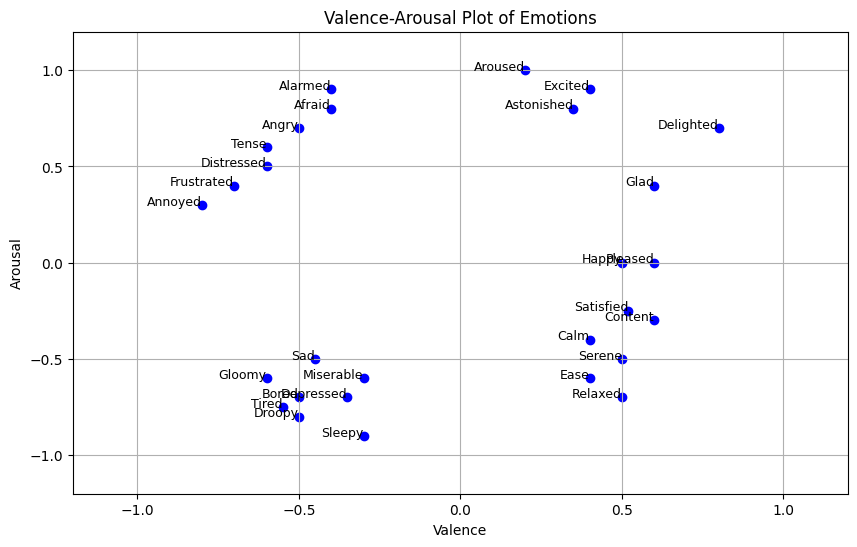

In [ ]:
import matplotlib.pyplot as plt

# Dictionary of emotions with their valence and arousal values
emotion_va = {
    'Happy': (0.5, 0.0),
    'Excited': (0.4, 0.9),
    'Calm': (0.4, -0.4),
    'Relaxed': (0.5, -0.7),
    'Angry': (-0.5, 0.7),
    'Frustrated': (-0.7, 0.4),
    'Sad': (-0.45, -0.5),
    'Depressed': (-0.35, -0.7),
    'Afraid': (-0.4, 0.8),
    'Astonished': (0.35, 0.8),
    'Bored': (-0.5, -0.7),
    'Tense': (-0.6, 0.6),
    'Delighted': (0.8, 0.7),
    'Gloomy': (-0.6, -0.6),
    'Alarmed': (-0.4, 0.9),
    'Content': (0.6, -0.3),
    'Miserable': (-0.3, -0.6),
    'Aroused': (0.2, 1.0),
    'Sleepy': (-0.3, -0.9),
    'Annoyed': (-0.8, 0.3),
    'Droopy': (-0.5, -0.8),
    'Pleased': (0.6, 0.0),
    'Glad': (0.6, 0.4),
    'Ease': (0.4, -0.6),
    'Serene': (0.5, -0.5),
    'Distressed': (-0.6, 0.5),
    'Tired':(-0.55, -0.75),
    'Satisfied':(0.52, -0.25)
}

# Extracting valence and arousal values for the plot
valence = [emotion_va[emotion][0] for emotion in emotion_va]
arousal = [emotion_va[emotion][1] for emotion in emotion_va]
emotions = list(emotion_va.keys())

# Create the plot
plt.figure(figsize=(10, 6))
plt.scatter(valence, arousal, color='b')

# Adding labels for each emotion
for i, emotion in enumerate(emotions):
    plt.text(valence[i], arousal[i], emotion, fontsize=9, ha='right')

# Adding title and labels to the plot
plt.title('Valence-Arousal Plot of Emotions')
plt.xlabel('Valence')
plt.ylabel('Arousal')

# Set axis limits from -1 to 1 for both valence and arousal
plt.xlim([-1.2, 1.2])
plt.ylim([-1.2, 1.2])

plt.grid(True)

# Show the plot
plt.show()


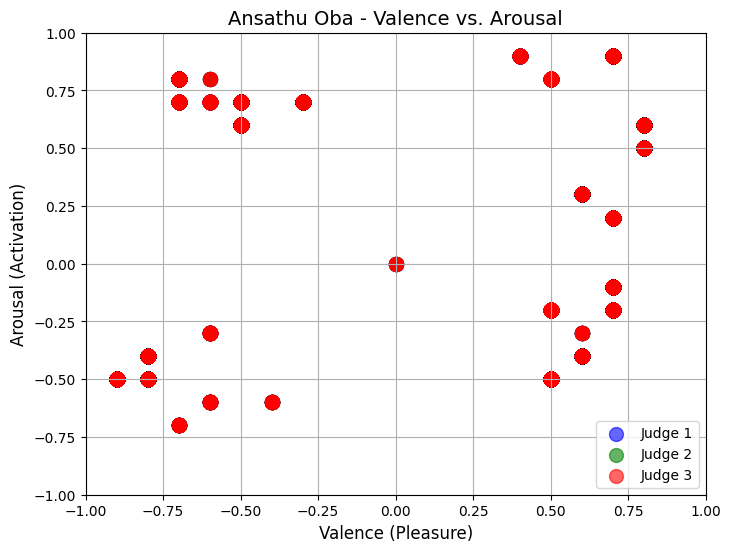

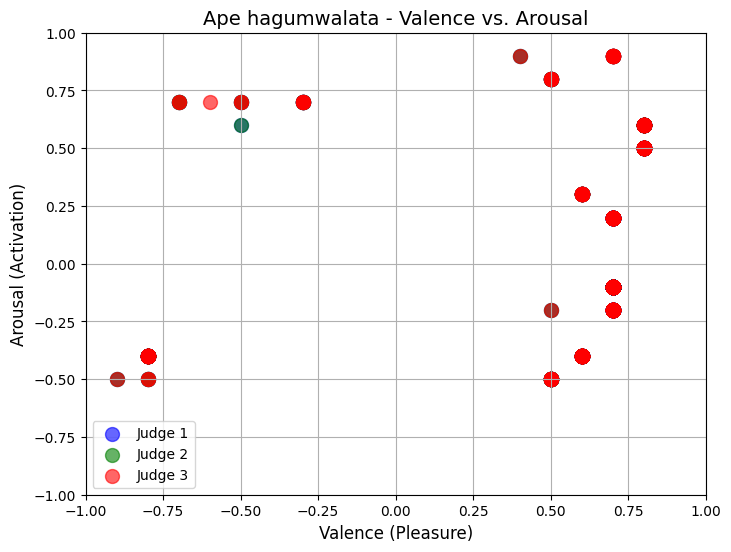

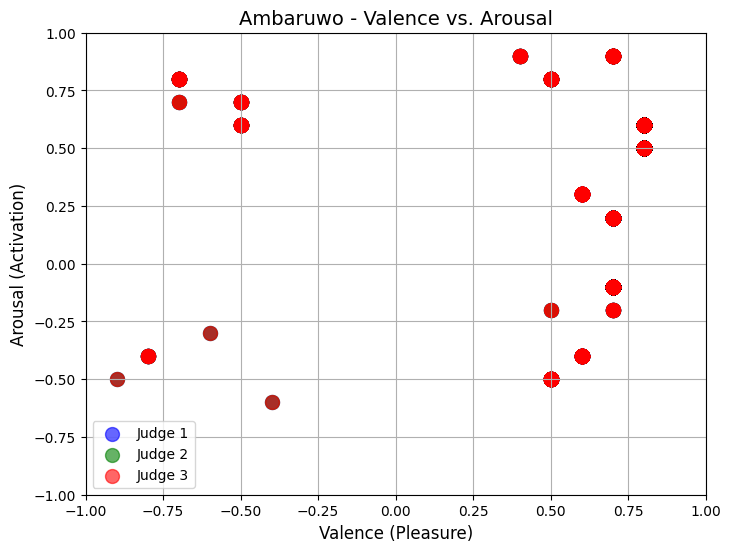

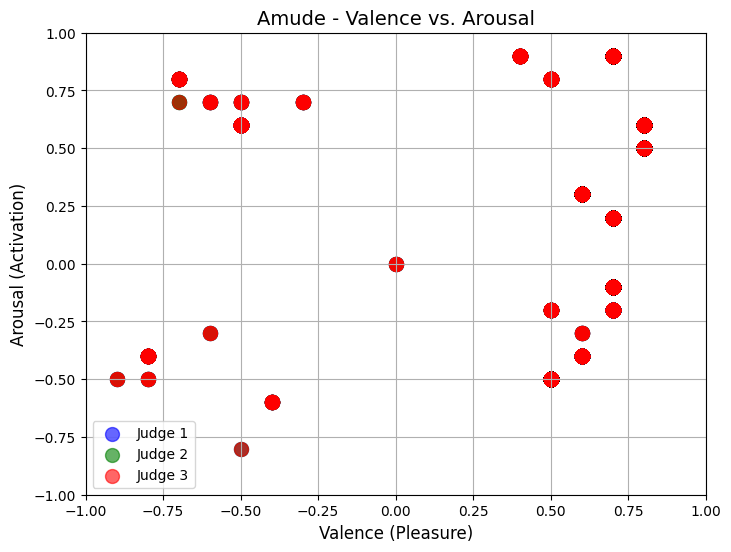

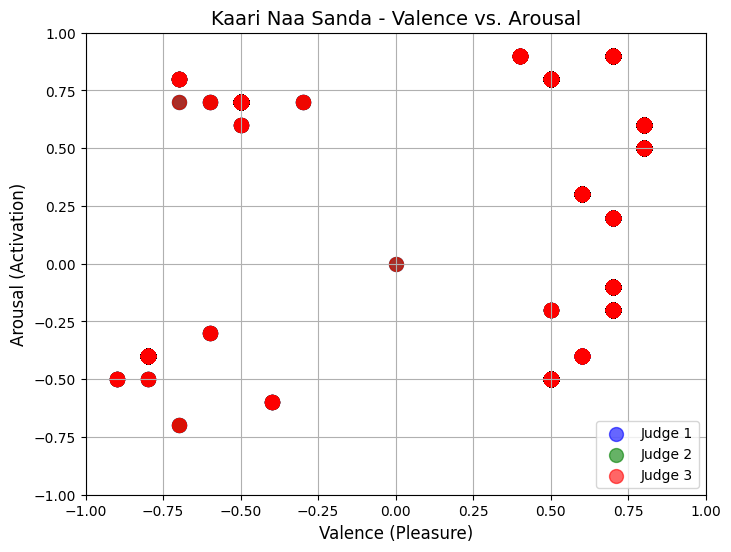

...

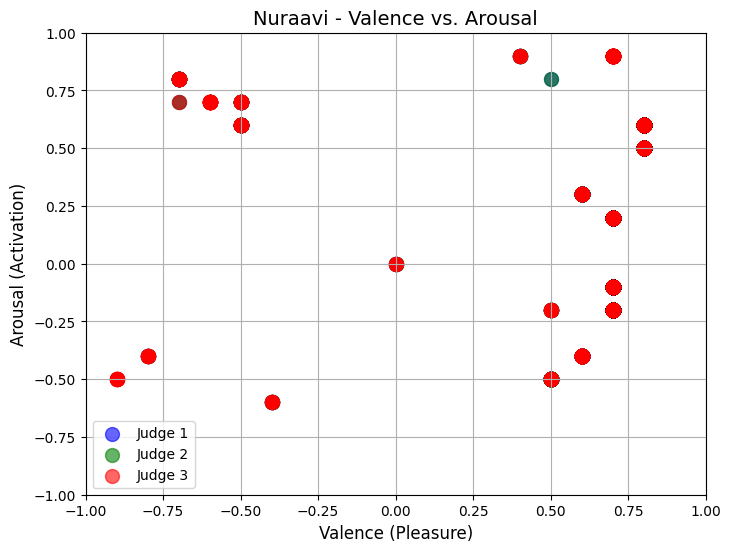

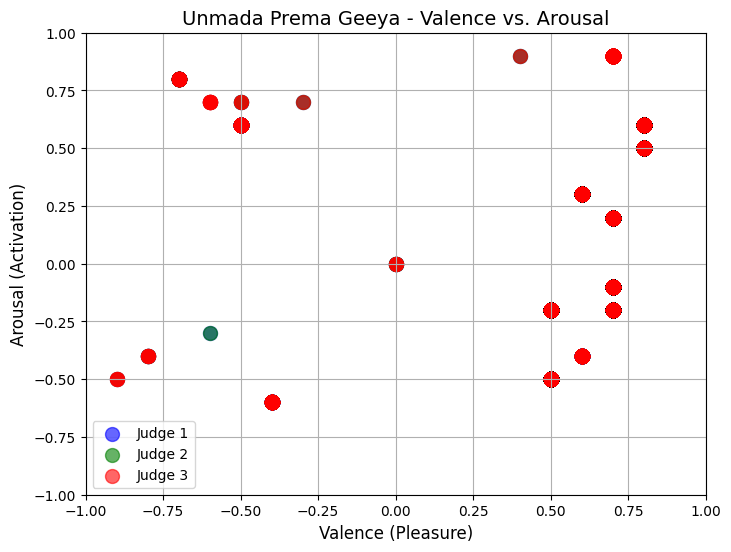

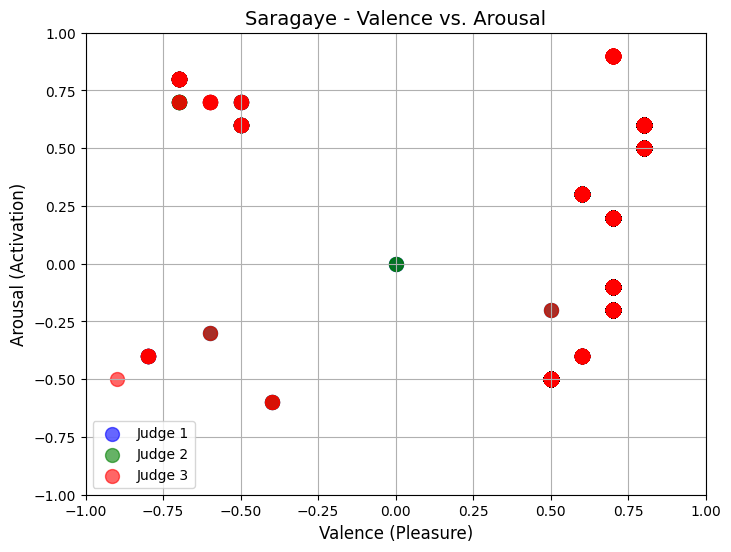

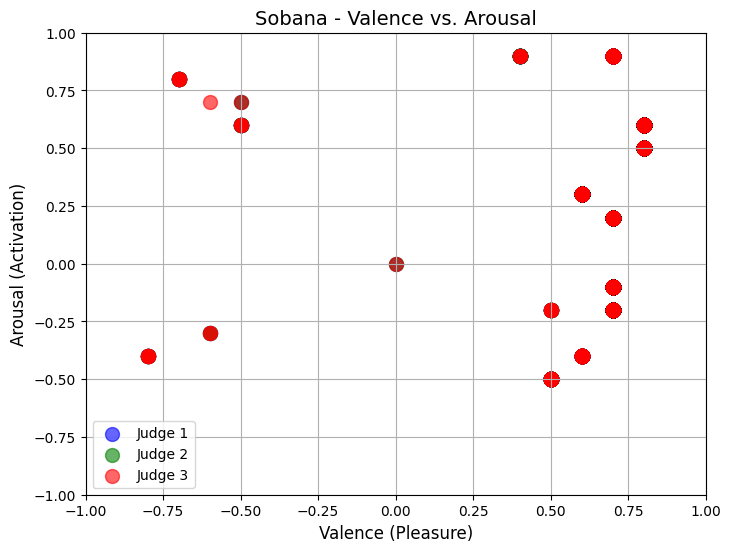

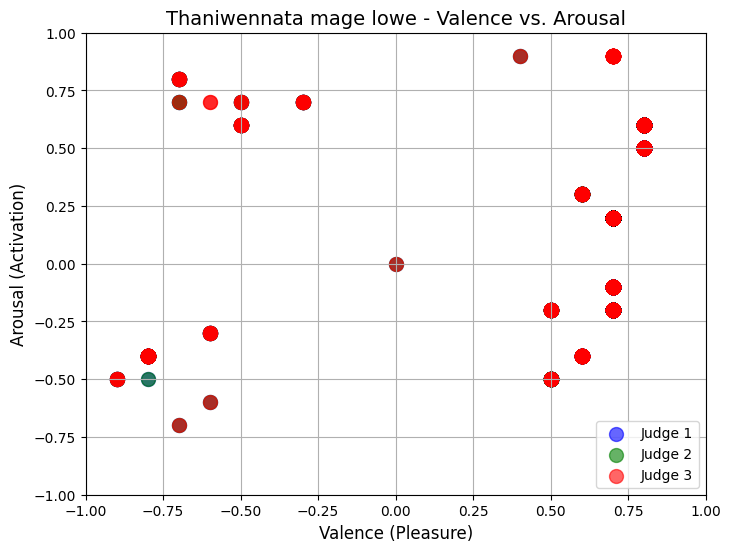

In [ ]:
import matplotlib.pyplot as plt

# Function to plot valence and arousal for each song across all comments
def plot_va_song(song_data, song_title):
    plt.figure(figsize=(8, 6))

    # Judge names for labeling the plots
    judge_names = ['Judge 1', 'Judge 2', 'Judge 3']

    # Colors for each judge
    colors = ['blue', 'green', 'red']

    # Plot each judge's valence-arousal pair for each comment in the song
    for i, judge in enumerate(judge_names):
        valence_column = f'Judge_{i+1}_Valence'
        arousal_column = f'Judge_{i+1}_Arousal'

        # Scatter plot for each judge
        plt.scatter(song_data[valence_column], song_data[arousal_column],
                    color=colors[i], label=judge, s=100, alpha=0.6)

    # Set title and labels
    plt.title(f'{song_title} - Valence vs. Arousal', fontsize=14)
    plt.xlabel('Valence (Pleasure)', fontsize=12)
    plt.ylabel('Arousal (Activation)', fontsize=12)

    # Set axis limits for better visualization
    plt.xlim([-1, 1])  # Assuming valence ranges from -1 to 1
    plt.ylim([-1, 1])  # Assuming arousal ranges from -1 to 1

    # Show the legend
    plt.legend()

    # Show grid for better readability
    plt.grid(True)

    # Show the plot
    plt.show()

# Loop through each song
for song in merged_data['Song'].unique():
    # Get all the rows (comments) for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Plot valence and arousal for the current song across all comments and judges
    plot_va_song(song_data, song)


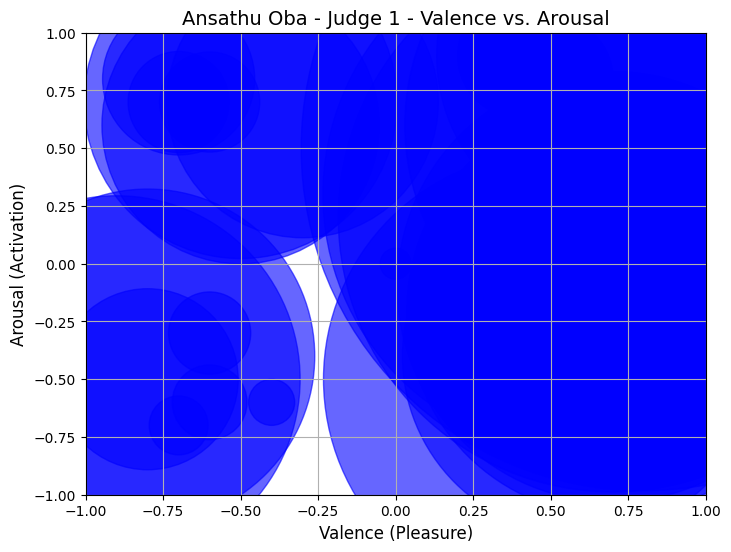

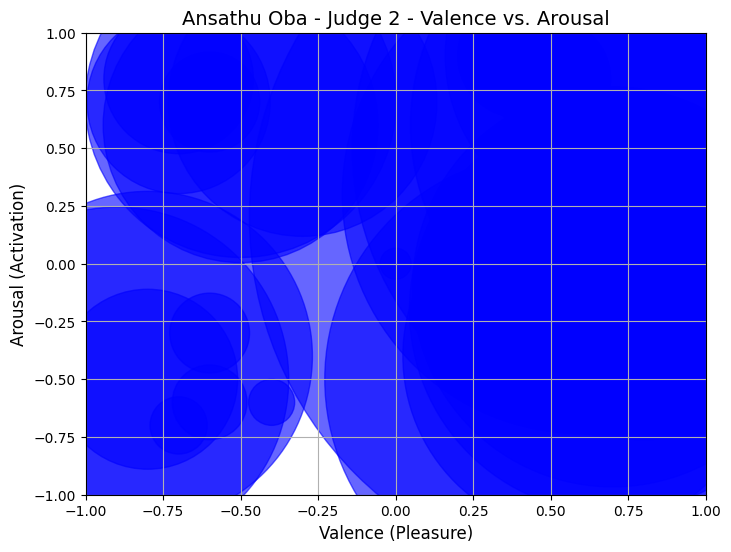

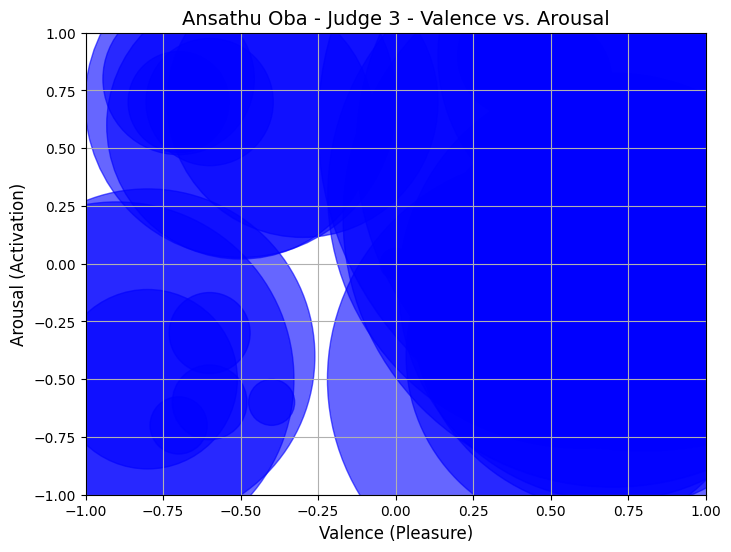

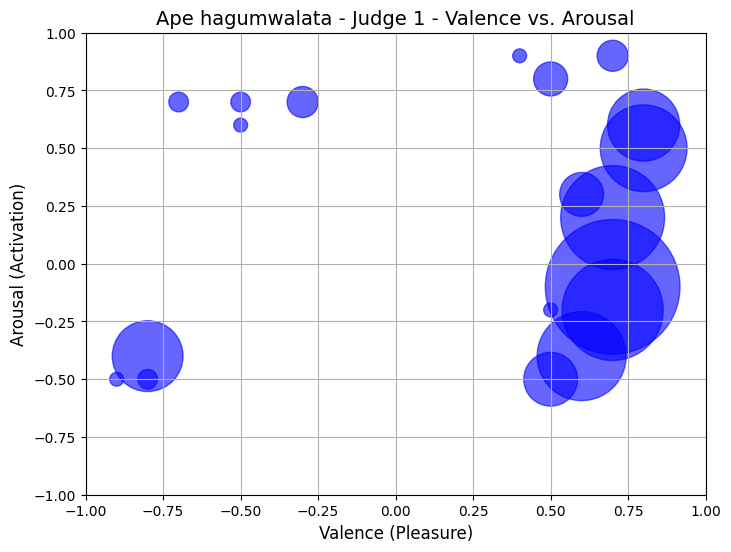

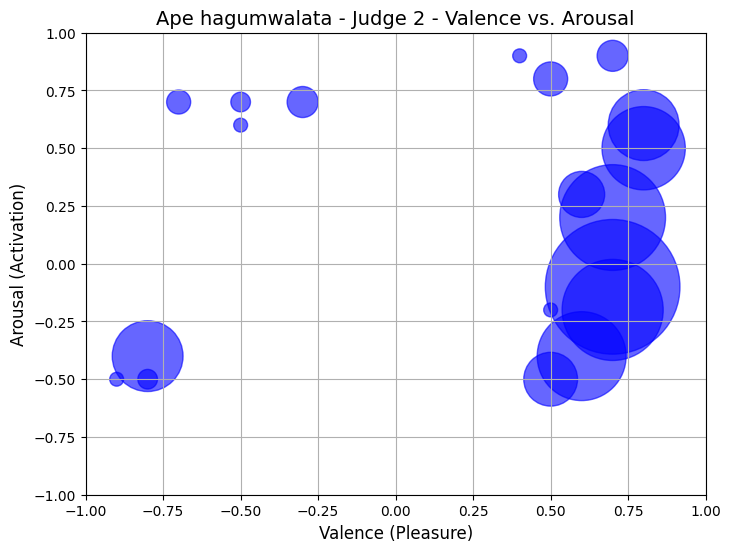

...

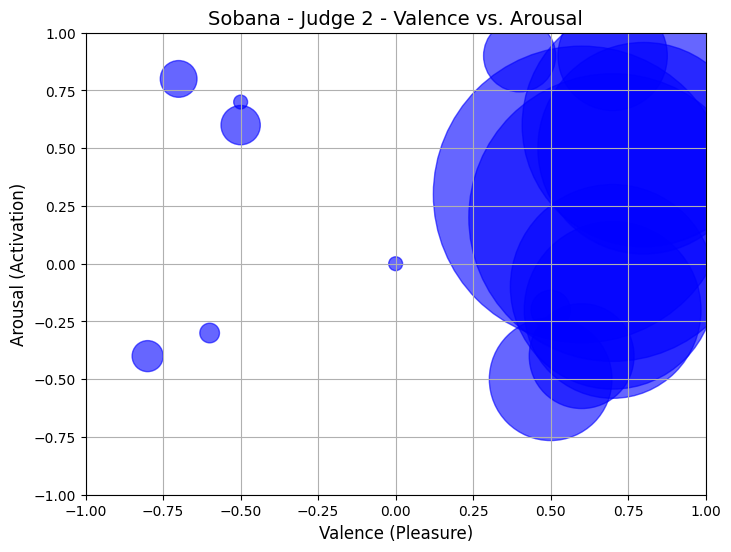

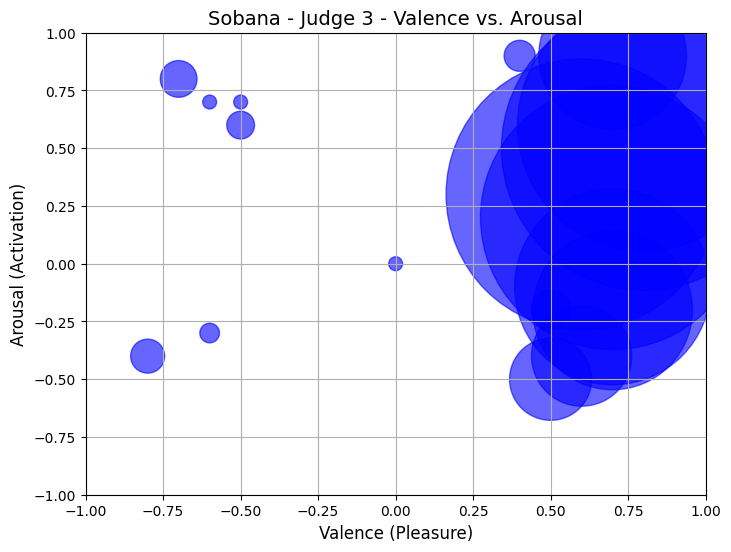

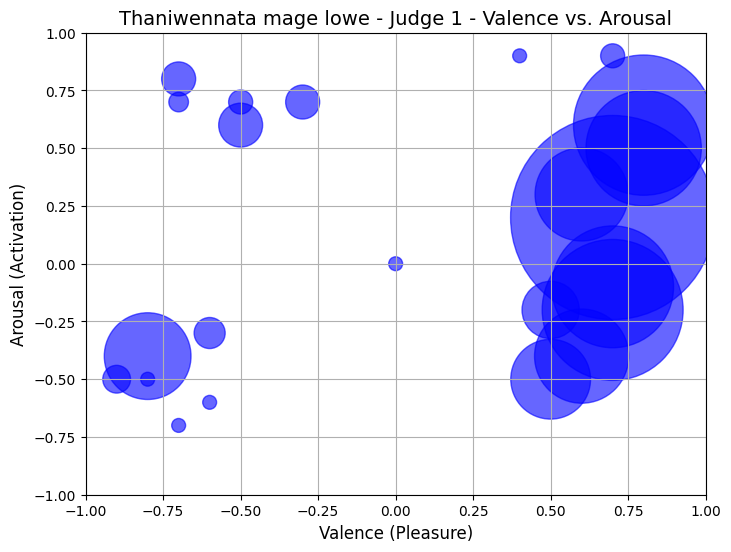

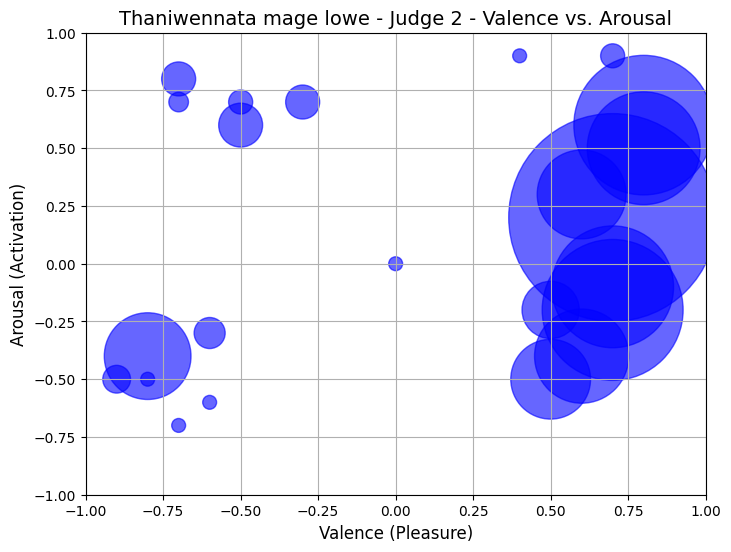

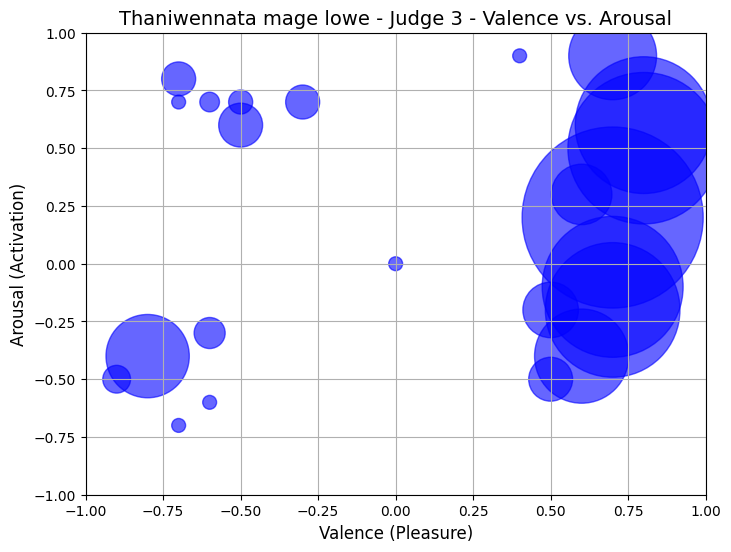

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Function to plot valence and arousal for each song and judge with dot size based on repetition
def plot_va_judge(song_data, song_title, judge_num, judge_name, valence_col, arousal_col):
    plt.figure(figsize=(8, 6))

    # Count the occurrences of each valence-arousal pair (emotion)
    va_counts = song_data.groupby([valence_col, arousal_col]).size().reset_index(name='counts')

    # Scatter plot with the size of the dots based on the number of occurrences (emotion repetition)
    plt.scatter(va_counts[valence_col], va_counts[arousal_col],
                s=va_counts['counts'] * 100,  # Size of the dots increases with repetition
                color='blue', alpha=0.6, label=judge_name)

    # Set title and labels
    plt.title(f'{song_title} - {judge_name} - Valence vs. Arousal', fontsize=14)
    plt.xlabel('Valence (Pleasure)', fontsize=12)
    plt.ylabel('Arousal (Activation)', fontsize=12)

    # Set axis limits for better visualization
    plt.xlim([-1, 1])  # Assuming valence ranges from -1 to 1
    plt.ylim([-1, 1])  # Assuming arousal ranges from -1 to 1

    # Show grid for better readability
    plt.grid(True)

    # Show the plot
    plt.show()

# Loop through each song
for song in merged_data['Song'].unique():
    # Get all the rows (comments) for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Plot for each judge
    for judge_num in range(1, 4):
        # Define the columns for valence and arousal for the current judge
        valence_col = f'Judge_{judge_num}_Valence'
        arousal_col = f'Judge_{judge_num}_Arousal'
        judge_name = f'Judge {judge_num}'

        # Plot valence and arousal for the current song and judge
        plot_va_judge(song_data, song, judge_num, judge_name, valence_col, arousal_col)


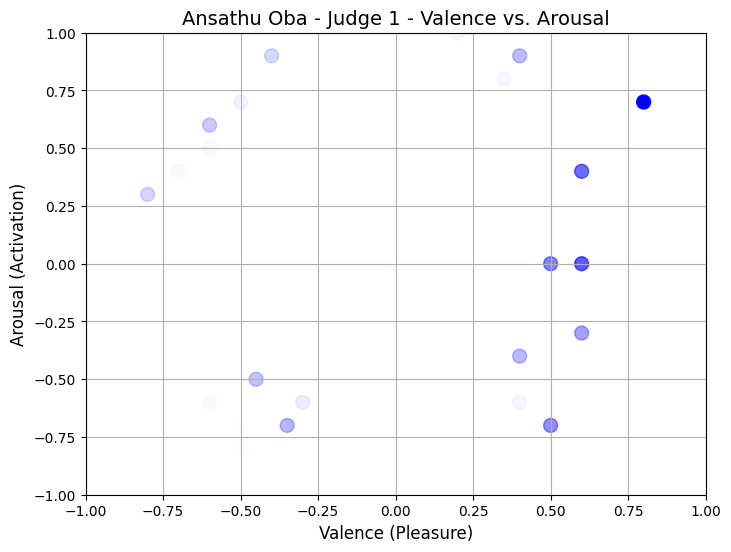

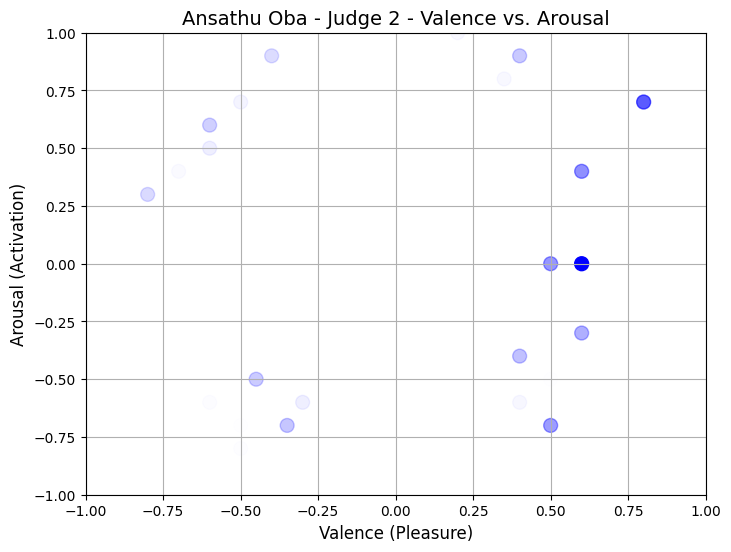

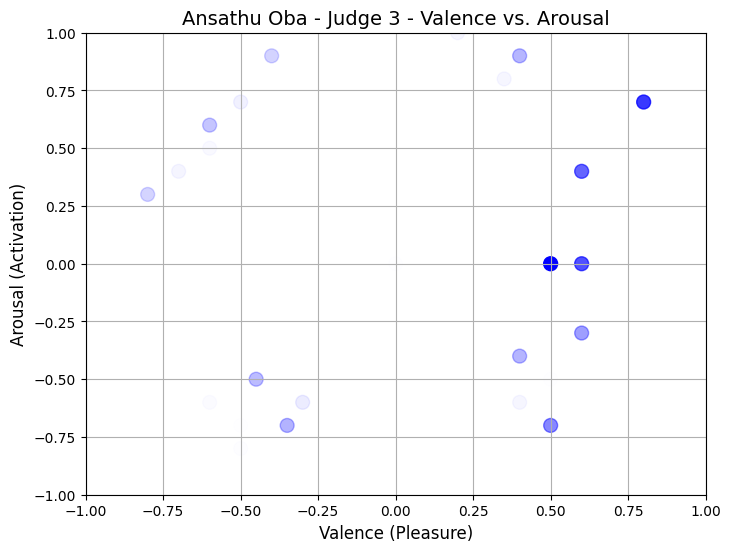

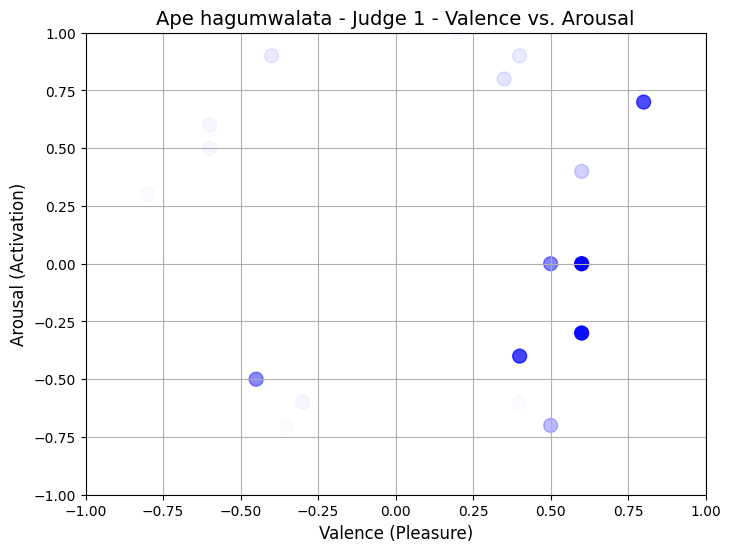

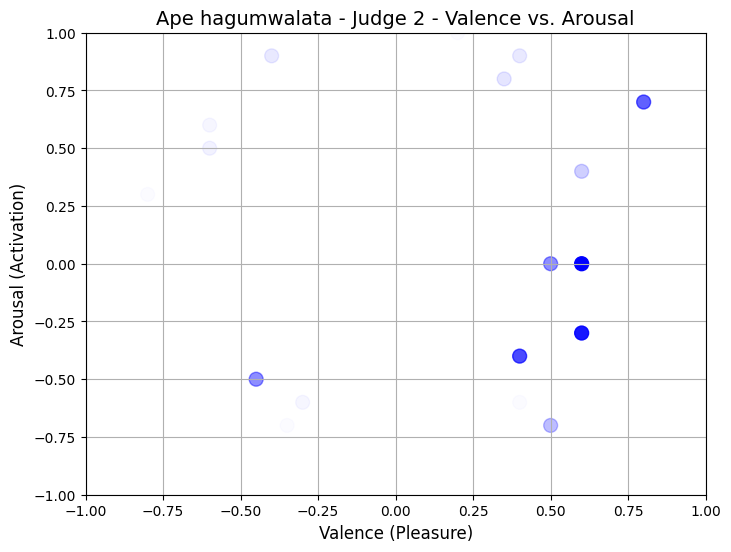

...

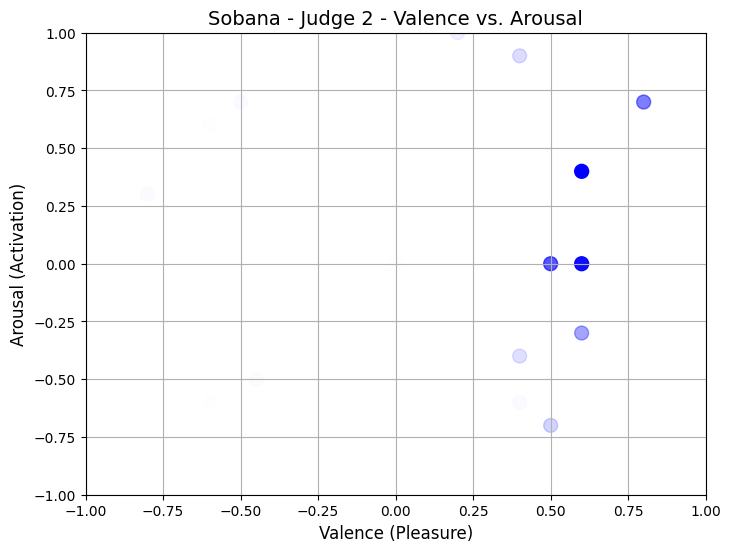

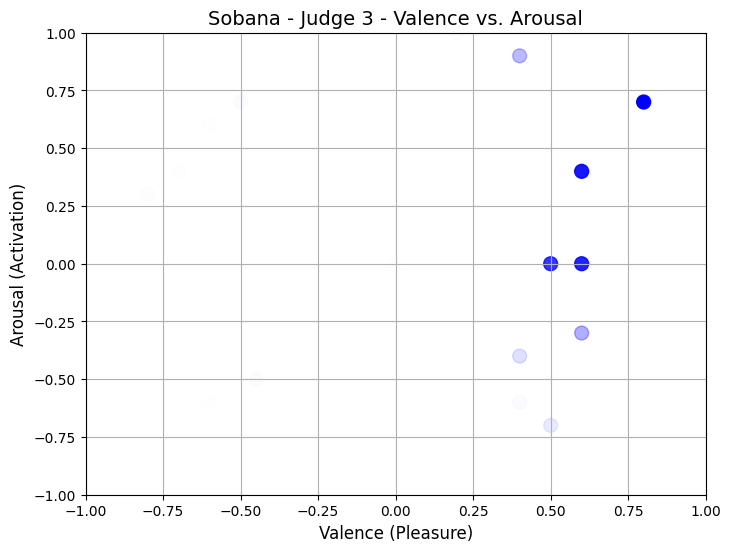

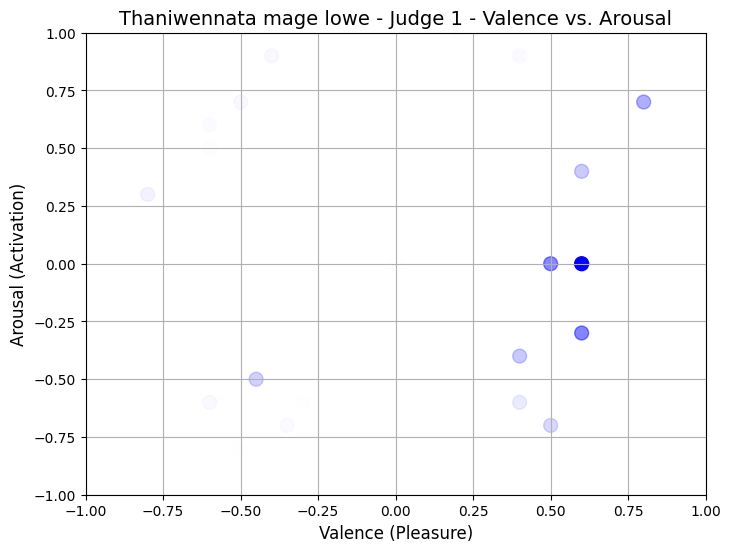

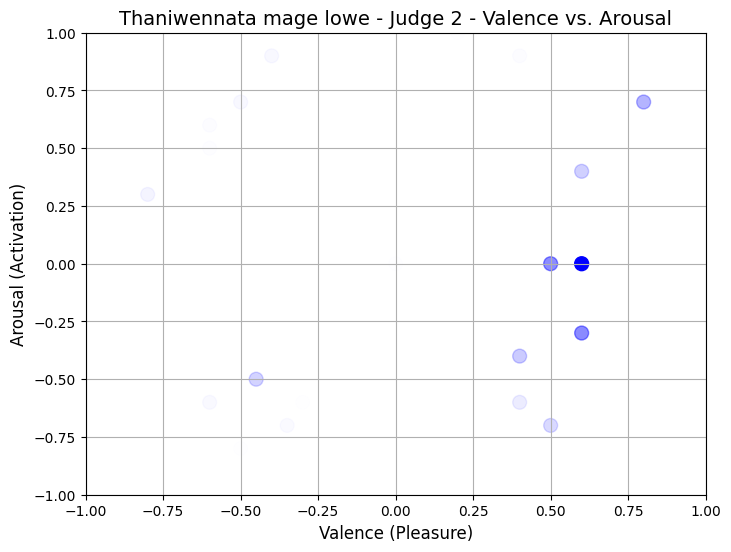

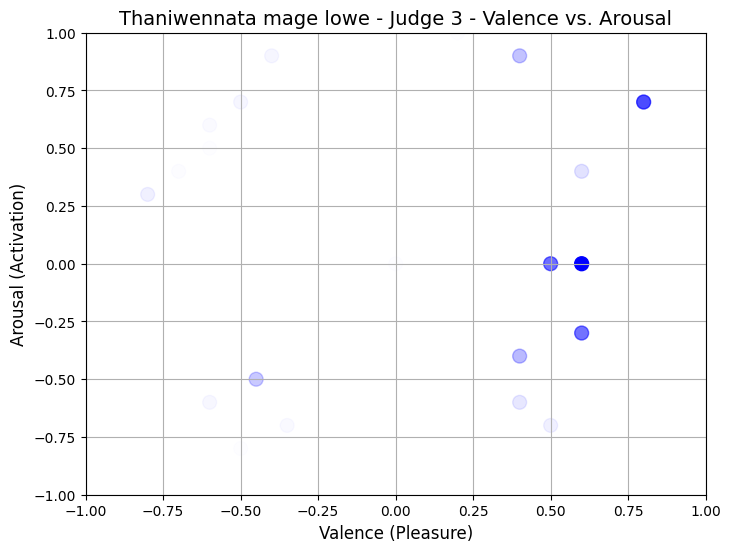

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Function to plot valence and arousal for each song and judge with color intensity based on repetition
def plot_va_judge(song_data, song_title, judge_num, judge_name, valence_col, arousal_col):
    plt.figure(figsize=(8, 6))

    # Count the occurrences of each valence-arousal pair (emotion)
    va_counts = song_data.groupby([valence_col, arousal_col]).size().reset_index(name='counts')

    # Normalize counts to get values between 0 and 1 for color intensity (alpha)
    va_counts['alpha'] = va_counts['counts'] / va_counts['counts'].max()

    # Scatter plot with constant dot size, and color intensity (alpha) based on the number of occurrences
    plt.scatter(va_counts[valence_col], va_counts[arousal_col],
                s=100,  # Constant size of the dots
                color='blue', alpha=va_counts['alpha'], label=judge_name)  # Alpha changes with repetition

    # Set title and labels
    plt.title(f'{song_title} - {judge_name} - Valence vs. Arousal', fontsize=14)
    plt.xlabel('Valence (Pleasure)', fontsize=12)
    plt.ylabel('Arousal (Activation)', fontsize=12)

    # Set axis limits for better visualization
    plt.xlim([-1, 1])  # Assuming valence ranges from -1 to 1
    plt.ylim([-1, 1])  # Assuming arousal ranges from -1 to 1

    # Show grid for better readability
    plt.grid(True)

    # Show the plot
    plt.show()

# Loop through each song
for song in merged_data['Song'].unique():
    # Get all the rows (comments) for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Plot for each judge
    for judge_num in range(1, 4):
        # Define the columns for valence and arousal for the current judge
        valence_col = f'Judge_{judge_num}_Valence'
        arousal_col = f'Judge_{judge_num}_Arousal'
        judge_name = f'Judge {judge_num}'

        # Plot valence and arousal for the current song and judge
        plot_va_judge(song_data, song, judge_num, judge_name, valence_col, arousal_col)


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

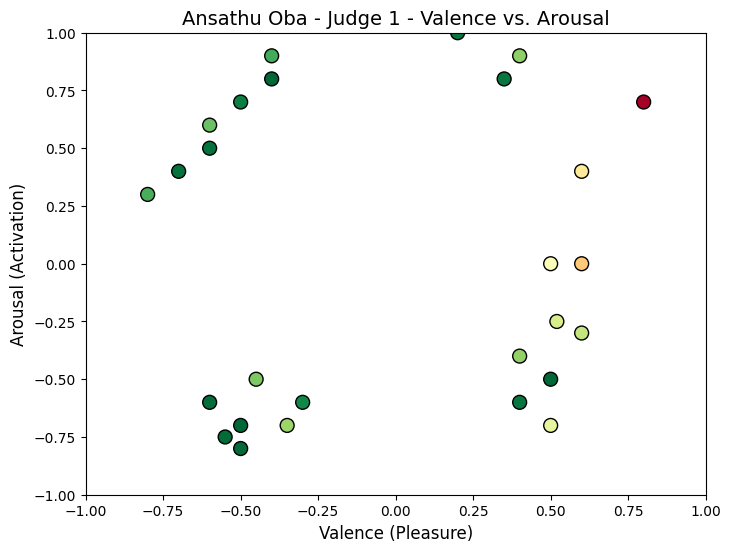

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors

# Function to plot valence and arousal for each song and judge with color intensity based on repetition
def plot_va_judge(song_data, song_title, judge_num, judge_name, valence_col, arousal_col):
    plt.figure(figsize=(8, 6))

    # Count the occurrences of each valence-arousal pair (emotion)
    va_counts = song_data.groupby([valence_col, arousal_col]).size().reset_index(name='counts')

    # Normalize counts to get values between 0 and 1 for color intensity (alpha)
    va_counts['alpha'] = va_counts['counts'] / va_counts['counts'].max()

    # Use a reversed color map to assign colors from green to red based on the normalized counts
    cmap = plt.get_cmap('RdYlGn_r')  # Reversed Green to Red colormap
    norm = mcolors.Normalize(vmin=va_counts['counts'].min(), vmax=va_counts['counts'].max())
    va_counts['color'] = va_counts['counts'].apply(lambda x: cmap(norm(x)))

    # Scatter plot with constant dot size, and color intensity (alpha) based on the number of occurrences
    plt.scatter(va_counts[valence_col], va_counts[arousal_col],
                s=100,  # Constant size of the dots
                c=va_counts['color'], edgecolor='black')  # Color based on repetition

    # Set title and labels
    plt.title(f'{song_title} - {judge_name} - Valence vs. Arousal', fontsize=14)
    plt.xlabel('Valence (Pleasure)', fontsize=12)
    plt.ylabel('Arousal (Activation)', fontsize=12)

    # Set axis limits for better visualization
    plt.xlim([-1, 1])  # Assuming valence ranges from -1 to 1
    plt.ylim([-1, 1])  # Assuming arousal ranges from -1 to 1

    # Add a color bar for reference
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Empty array for the color bar
    cbar = plt.colorbar(sm)
    cbar.set_label('Frequency of Occurrence')

    # Show grid for better readability
    plt.grid(True)

    # Show the plot
    plt.show()

# Loop through each song
for song in merged_data['Song'].unique():
    # Get all the rows (comments) for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Plot for each judge
    for judge_num in range(1, 4):
        # Define the columns for valence and arousal for the current judge
        valence_col = f'Judge_{judge_num}_Valence'
        arousal_col = f'Judge_{judge_num}_Arousal'
        judge_name = f'Judge {judge_num}'

        # Plot valence and arousal for the current song and judge
        plot_va_judge(song_data, song, judge_num, judge_name, valence_col, arousal_col)


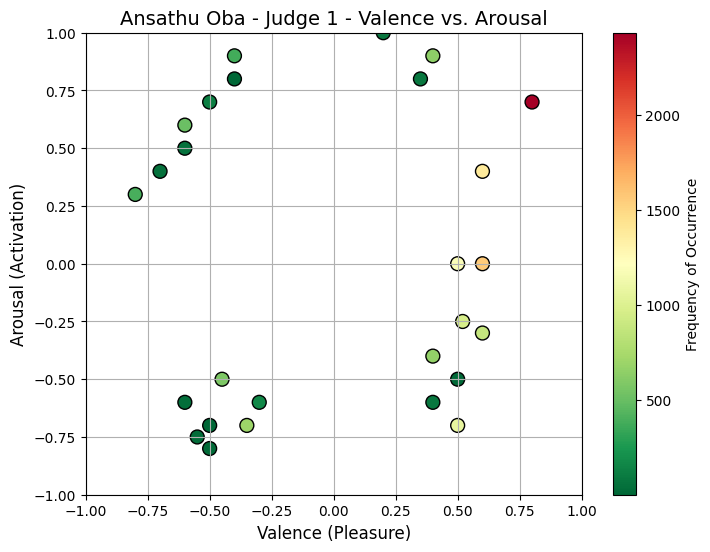

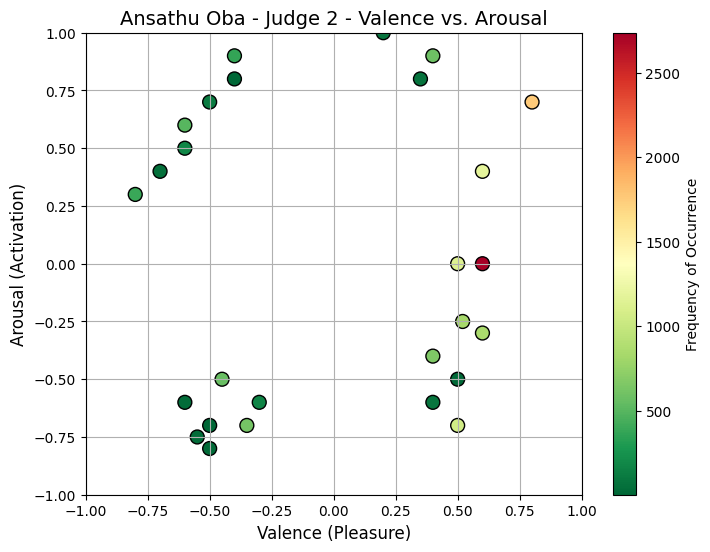

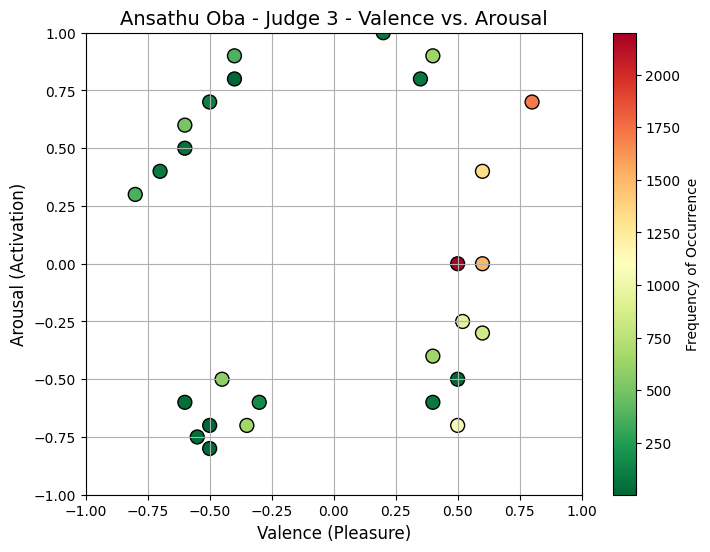

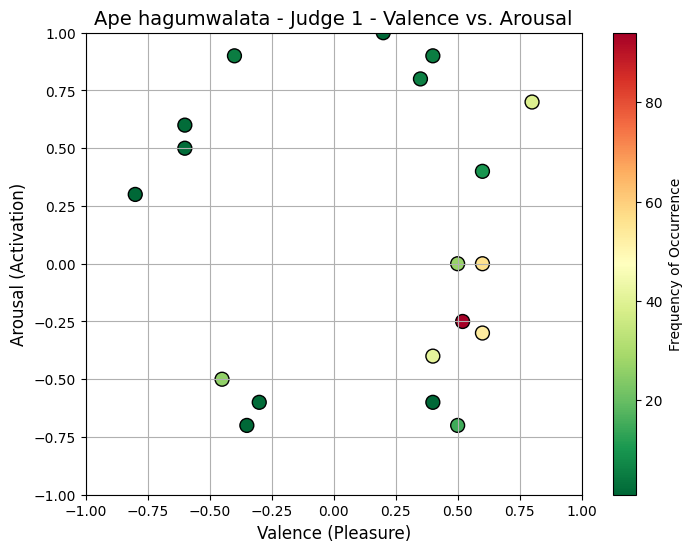

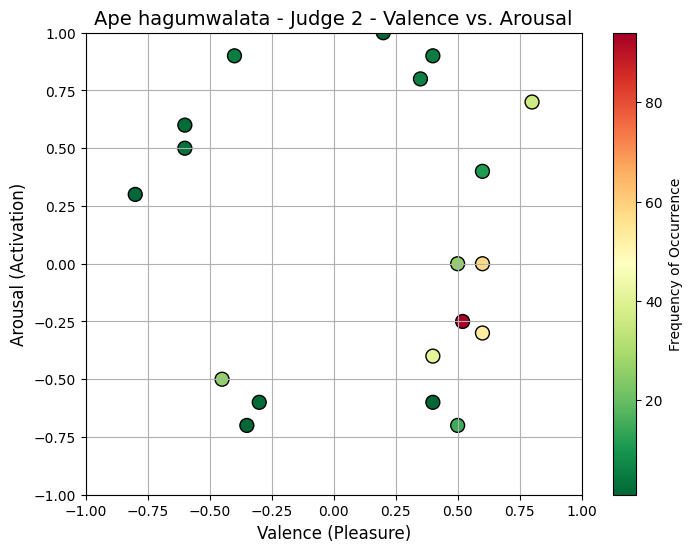

...

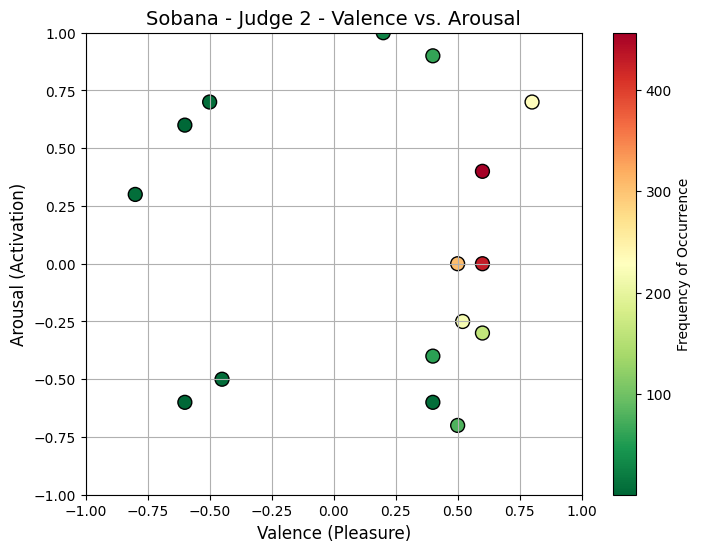

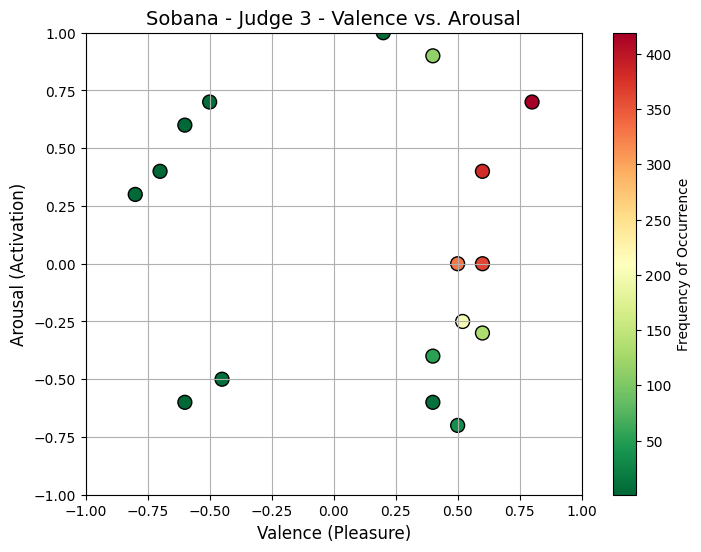

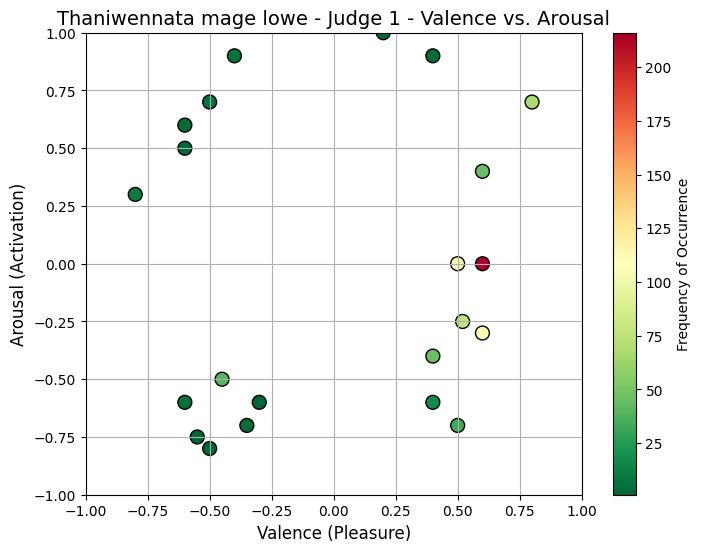

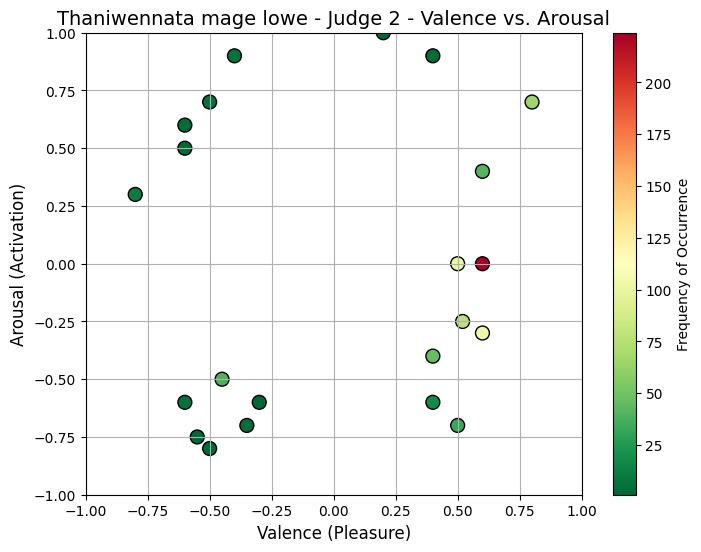

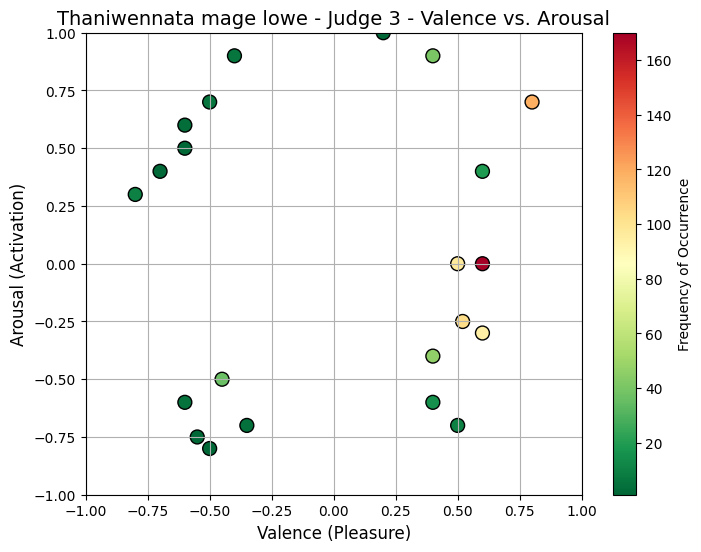

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors

def plot_va_judge(song_data, song_title, judge_num, judge_name, valence_col, arousal_col):
    plt.figure(figsize=(8, 6))

    # Count the occurrences of each valence-arousal pair (emotion)
    va_counts = song_data.groupby([valence_col, arousal_col]).size().reset_index(name='counts')

    # Normalize counts to get values between 0 and 1 for color intensity (alpha)
    va_counts['alpha'] = va_counts['counts'] / va_counts['counts'].max()

    # Use a reversed color map to assign colors from green to red based on the normalized counts
    cmap = plt.get_cmap('RdYlGn_r')  # Reversed Green to Red colormap
    norm = mcolors.Normalize(vmin=va_counts['counts'].min(), vmax=va_counts['counts'].max())
    va_counts['color'] = va_counts['counts'].apply(lambda x: cmap(norm(x)))

    # Scatter plot with constant dot size, and color intensity (alpha) based on the number of occurrences
    plt.scatter(va_counts[valence_col], va_counts[arousal_col],
                s=100,  # Constant size of the dots
                c=va_counts['color'], edgecolor='black')  # Color based on repetition

    # Set title and labels
    plt.title(f'{song_title} - {judge_name} - Valence vs. Arousal', fontsize=14)
    plt.xlabel('Valence (Pleasure)', fontsize=12)
    plt.ylabel('Arousal (Activation)', fontsize=12)

    # Set axis limits for better visualization
    plt.xlim([-1, 1])  # Assuming valence ranges from -1 to 1
    plt.ylim([-1, 1])  # Assuming arousal ranges from -1 to 1

    # Add a color bar for reference
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Empty array for the color bar
    cbar = plt.colorbar(sm, ax=plt.gca())  # Use gca() to ensure color bar is placed in the active axis
    cbar.set_label('Frequency of Occurrence')

    # Show grid for better readability
    plt.grid(True)

    # Show the plot
    plt.show()

# Loop through each song
for song in merged_data['Song'].unique():
    # Get all the rows (comments) for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Plot for each judge
    for judge_num in range(1, 4):
        # Define the columns for valence and arousal for the current judge
        valence_col = f'Judge_{judge_num}_Valence'
        arousal_col = f'Judge_{judge_num}_Arousal'
        judge_name = f'Judge {judge_num}'

        # Plot valence and arousal for the current song and judge
        plot_va_judge(song_data, song, judge_num, judge_name, valence_col, arousal_col)


In [ ]:
import pandas as pd

# Assuming your DataFrame is called merged_data and has the following columns:
# 'Song', 'Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion'

# Combine all emotion columns into one for counting
emotion_columns = ['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']
merged_data['All_Emotions'] = merged_data[emotion_columns].apply(lambda x: ','.join(x), axis=1)

# Split the combined emotions and count each emotion per song
emotion_summary = merged_data.groupby('Song')['All_Emotions'].apply(lambda x: ','.join(x).split(',')).apply(pd.Series.value_counts)

# Reset the index to have a clean summary DataFrame
emotion_summary = emotion_summary.reset_index().rename(columns={'level_1': 'Emotion', 'All_Emotions': 'Count'})

# Display the summary
print(emotion_summary)


                        Song  Delighted   Happy  Satisfied  Pleased    Glad  \
0                   Ambaruwo      553.0   416.0      369.0    303.0   150.0   
1                      Amude     2536.0  2008.0     3278.0    413.0   676.0   
2                Ansathu Oba     5903.0  4509.0     2740.0   5804.0  3912.0   
3            Ape hagumwalata      116.0    76.0      284.0    165.0    36.0   
4          Danena Thuru Maa      3181.0  2165.0     2575.0    544.0   590.0   
5   Dannawada Adare Neethiya      753.0   906.0      591.0    220.0   793.0   
6       Ehema dewal na hithe     1400.0  1926.0     1185.0    753.0   584.0   
7            Kaari Naa Sanda     3771.0  1729.0     1472.0    315.0   959.0   
8      Kaluwarata Hitha Baya     1322.0  2079.0     1431.0    634.0  1046.0   
9                   Komaliya     1377.0  1309.0     1073.0    226.0   180.0   
10    Ma sadata kamathi bawa      115.0   122.0      630.0    125.0    99.0   
11                    Mohini      619.0   944.0     

<ipython-input-9-84ecf684dfd1>:11: FutureWarning: value_counts with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  emotion_summary = merged_data.groupby('Song')['All_Emotions'].apply(lambda x: ','.join(x).split(',')).apply(pd.Series.value_counts)
<ipython-input-9-84ecf684dfd1>:11: FutureWarning: value_counts with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  emotion_summary = merged_data.groupby('Song')['All_Emotions'].apply(lambda x: ','.join(x).split(',')).apply(pd.Series.value_counts)
<ipython-input-9-84ecf684dfd1>:11: FutureWarning: value_counts with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  emotion_summary = merged_data.groupby('Song')['All_Emotions'].apply(lambda x: ','.join(x).split(',')).apply(pd.Series.value_counts)
<ipython-input-9-84ecf684dfd

In [ ]:
import pandas as pd

# Assuming your DataFrame is called merged_data and has the following columns:
# 'Song', 'Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion'

# Melt the DataFrame so that all emotions are in a single column for easier counting
emotion_columns = ['Judge_1_Emotion', 'Judge_2_Emotion', 'Judge_3_Emotion']
melted_data = merged_data.melt(id_vars='Song', value_vars=emotion_columns, var_name='Judge', value_name='Emotion')

# Count the occurrences of each emotion for each song
emotion_counts = melted_data.groupby(['Song', 'Emotion']).size().reset_index(name='Count')

# Find the maximum and minimum emotion for each song
max_emotion = emotion_counts.loc[emotion_counts.groupby('Song')['Count'].idxmax()].rename(columns={'Emotion': 'Max_Emotion', 'Count': 'Max_Count'})
min_emotion = emotion_counts.loc[emotion_counts.groupby('Song')['Count'].idxmin()].rename(columns={'Emotion': 'Min_Emotion', 'Count': 'Min_Count'})

# Merge the max and min emotions for each song
emotion_extremes = pd.merge(max_emotion[['Song', 'Max_Emotion', 'Max_Count']], min_emotion[['Song', 'Min_Emotion', 'Min_Count']], on='Song')

# Display the DataFrame showing the max and min emotions for each song
print(emotion_extremes)


                        Song Max_Emotion  Max_Count Min_Emotion  Min_Count
0                   Ambaruwo   Delighted        553       Bored          3
1                      Amude   Satisfied       3278      Sleepy          3
2                Ansathu Oba   Delighted       5903      Afraid          9
3            Ape hagumwalata   Satisfied        284  Frustrated          1
4          Danena Thuru Maa    Delighted       3181      Afraid          3
5   Dannawada Adare Neethiya         Sad       1134     Alarmed          3
6       Ehema dewal na hithe       Happy       1926   Miserable          3
7            Kaari Naa Sanda   Delighted       3771  Distressed          3
8      Kaluwarata Hitha Baya       Happy       2079  Frustrated          3
9                   Komaliya   Delighted       1377     Annoyed          3
10    Ma sadata kamathi bawa   Satisfied        630  Frustrated          1
11                    Mohini   Satisfied       1215  Distressed          1
12                   Nura

In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/Classification_of_Songs.xlsx'
df = pd.read_excel(file_path)

# Function to get the highest emotion for each song
def get_highest_emotion(row):
    emotions = [row['Judge 01'], row['Judge 02'], row['Judge 03']]
    return max(set(emotions), key=emotions.count)

# Apply the function to each row (each song)
df['Highest_Emotion'] = df.apply(get_highest_emotion, axis=1)

# Display the DataFrame with the highest emotion for each song
print(df[['Song', 'Highest_Emotion']])

# Save the result to a new Excel file
#df.to_excel('/content/drive/MyDrive/data_set_emotion/Annotated data/Song_Highest_Emotion.xlsx', index=False)


                        Song Highest_Emotion
0         Unmada Prema Geeya           Happy
1            Kaari Naa Sanda             Sad
2          Danena Thuru Maa       Distressed
3                   Piyanani             Sad
4                Salli Salli       Delighted
5                   Saragaye         Relaxed
6                Perawadanak             Sad
7                Ansathu Oba           Tense
8   Dannawada Adare Neethiya      Frustrated
9                   Komaliya           Happy
10                    Mohini       Satisfied
11                   Nuraavi            Calm
12     Kaluwarata Hitha Baya          Afraid
13                    Sobana         Relaxed
14      Ehema dewal na hithe         Relaxed
15    Thaniwennata mage lowe            Sad 
16           Ape hagumwalata       Depressed
17    Ma sadata kamathi bawa          Angry 
18                  Ambaruwo         Relaxed
19                     Amude             Sad


In [ ]:
#Merge the song DataFrame with the emotion_extremes DataFrame based on the song name
df_merged = pd.merge(df, emotion_extremes[['Song', 'Max_Emotion']], on='Song', how='left')

# Now 'Highest_Emotion' column in df_merged contains the highest emotion for each song based on emotion_extremes
print(df_merged[['Song', 'Highest_Emotion','Max_Emotion']])


                        Song Highest_Emotion Max_Emotion
0         Unmada Prema Geeya           Happy     Pleased
1            Kaari Naa Sanda             Sad   Delighted
2          Danena Thuru Maa       Distressed   Delighted
3                   Piyanani             Sad   Satisfied
4                Salli Salli       Delighted       Happy
5                   Saragaye         Relaxed     Pleased
6                Perawadanak             Sad   Delighted
7                Ansathu Oba           Tense   Delighted
8   Dannawada Adare Neethiya      Frustrated         Sad
9                   Komaliya           Happy   Delighted
10                    Mohini       Satisfied   Satisfied
11                   Nuraavi            Calm     Pleased
12     Kaluwarata Hitha Baya          Afraid       Happy
13                    Sobana         Relaxed        Glad
14      Ehema dewal na hithe         Relaxed       Happy
15    Thaniwennata mage lowe            Sad      Pleased
16           Ape hagumwalata   

In [ ]:
import numpy as np
emotion_va = {
    'Happy': (0.5, 0.0),
    'Excited': (0.4, 0.9),
    'Calm': (0.4, -0.4),
    'Relaxed': (0.5, -0.7),
    'Angry': (-0.5, 0.7),
    'Frustrated': (-0.7, 0.4),
    'Sad': (-0.45, -0.5),
    'Depressed': (-0.35, -0.7),
    'Afraid': (-0.4, 0.8),
    'Astonished': (0.35, 0.8),
    'Bored': (-0.5, -0.7),
    'Tense': (-0.6, 0.6),
    'Delighted': (0.8, 0.7),
    'Gloomy': (-0.6, -0.6),
    'Alarmed': (-0.4, 0.9),
    'Content': (0.6, -0.3),
    'Satisfied':(0.65, -0.38),
    'Miserable': (-0.3, -0.6),
    'Aroused': (0.2, 1.0),
    'Sleepy': (-0.3, -0.9),
    'Annoyed': (-0.8, 0.3),
    'Droopy': (-0.5, -0.8),
    'Pleased': (0.6, 0.0),
    'Glad': (0.6, 0.4),
    'Ease': (0.4, -0.6),
    'Serene': (0.5, -0.5),
    'Sad ': (-0.284, -0.75),
    'Angry ': (-0.65, 0.48),
    'Distressed': (-0.6, 0.5)
}
# Add Valence and Arousal columns for Highest_Emotion
df_merged['Highest_Valence'] = df_merged['Highest_Emotion'].map(lambda emotion: emotion_va.get(emotion, (np.nan, np.nan))[0])
df_merged['Highest_Arousal'] = df_merged['Highest_Emotion'].map(lambda emotion: emotion_va.get(emotion, (np.nan, np.nan))[1])

# Add Valence and Arousal columns for Max_Emotion
df_merged['Max_Valence'] = df_merged['Max_Emotion'].map(lambda emotion: emotion_va.get(emotion, (np.nan, np.nan))[0])
df_merged['Max_Arousal'] = df_merged['Max_Emotion'].map(lambda emotion: emotion_va.get(emotion, (np.nan, np.nan))[1])

# Now you can see the updated DataFrame with Valence and Arousal values for both emotions
print(df_merged[['Song', 'Highest_Emotion', 'Max_Emotion', 'Highest_Valence', 'Highest_Arousal', 'Max_Valence', 'Max_Arousal']])


                        Song Highest_Emotion Max_Emotion  Highest_Valence  \
0         Unmada Prema Geeya           Happy     Pleased            0.500   
1            Kaari Naa Sanda             Sad   Delighted           -0.450   
2          Danena Thuru Maa       Distressed   Delighted           -0.600   
3                   Piyanani             Sad   Satisfied           -0.450   
4                Salli Salli       Delighted       Happy            0.800   
5                   Saragaye         Relaxed     Pleased            0.500   
6                Perawadanak             Sad   Delighted           -0.450   
7                Ansathu Oba           Tense   Delighted           -0.600   
8   Dannawada Adare Neethiya      Frustrated         Sad           -0.700   
9                   Komaliya           Happy   Delighted            0.500   
10                    Mohini       Satisfied   Satisfied            0.650   
11                   Nuraavi            Calm     Pleased            0.400   

In [ ]:
import numpy as np

# Function to calculate cosine similarity
def calculate_cosine_similarity(v1, a1, v2, a2):
    dot_product = v1 * v2 + a1 * a2
    magnitude_1 = np.sqrt(v1**2 + a1**2)
    magnitude_2 = np.sqrt(v2**2 + a2**2)

    if magnitude_1 == 0 or magnitude_2 == 0:
        return 0  # To handle division by zero, treat it as no similarity
    return dot_product / (magnitude_1 * magnitude_2)

# Calculate cosine similarity for each song and add as a new column
df_merged['Cosine_Similarity'] = df_merged.apply(
    lambda row: calculate_cosine_similarity(
        row['Highest_Valence'], row['Highest_Arousal'], row['Max_Valence'], row['Max_Arousal']
    ), axis=1
)

# Print the cosine similarity for each song
print(df_merged[['Song', 'Cosine_Similarity']])


                        Song  Cosine_Similarity
0         Unmada Prema Geeya           1.000000
1            Kaari Naa Sanda          -0.992910
2          Danena Thuru Maa           -0.156581
3                   Piyanani          -0.202377
4                Salli Salli           0.752577
5                   Saragaye           0.581238
6                Perawadanak          -0.992910
7                Ansathu Oba          -0.066519
8   Dannawada Adare Neethiya           0.212047
9                   Komaliya           0.752577
10                    Mohini           1.000000
11                   Nuraavi           0.707107
12     Kaluwarata Hitha Baya          -0.447214
13                    Sobana           0.032241
14      Ehema dewal na hithe           0.581238
15    Thaniwennata mage lowe          -0.354128
16           Ape hagumwalata           0.065336
17    Ma sadata kamathi bawa          -0.994276
18                  Ambaruwo          -0.098421
19                     Amude          -0

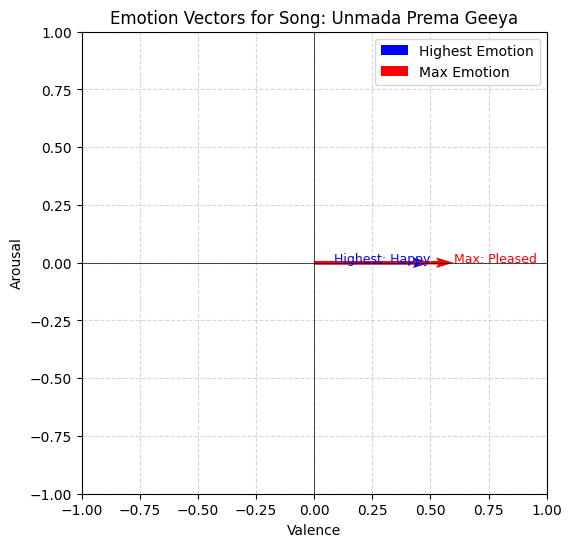

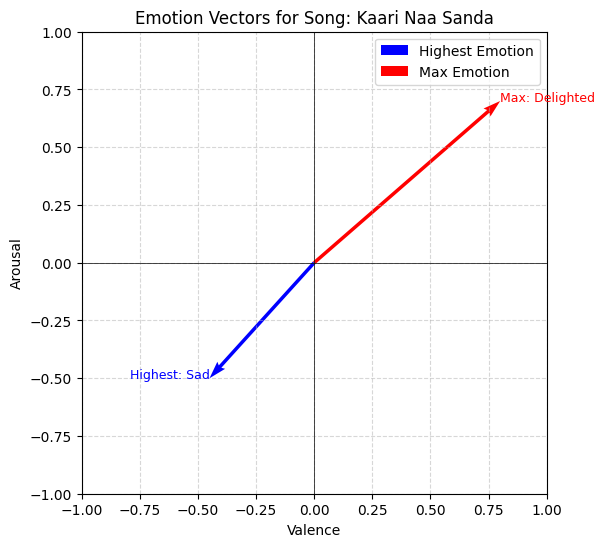

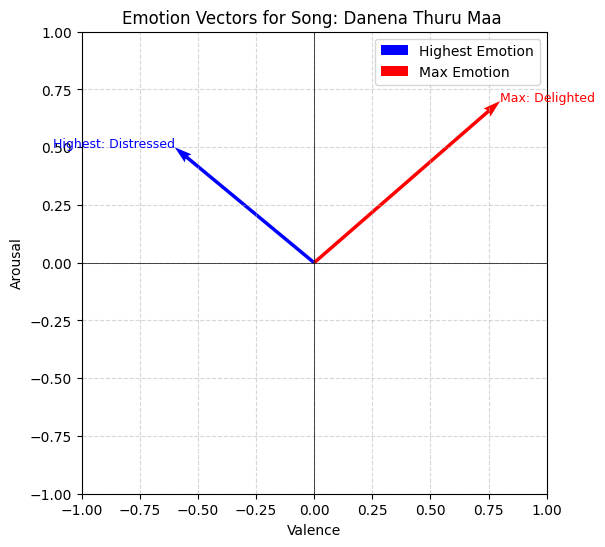

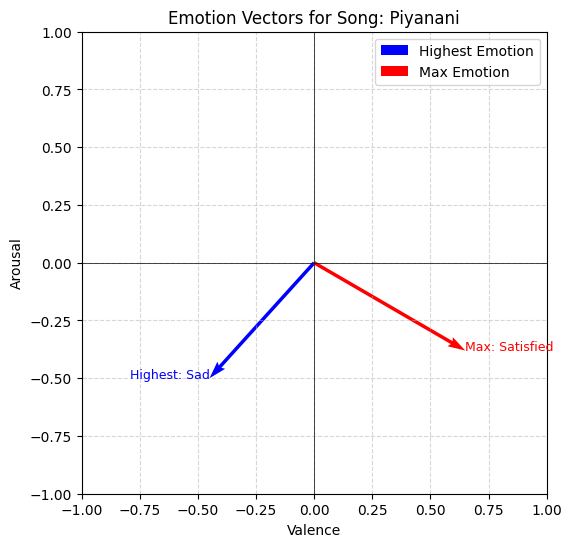

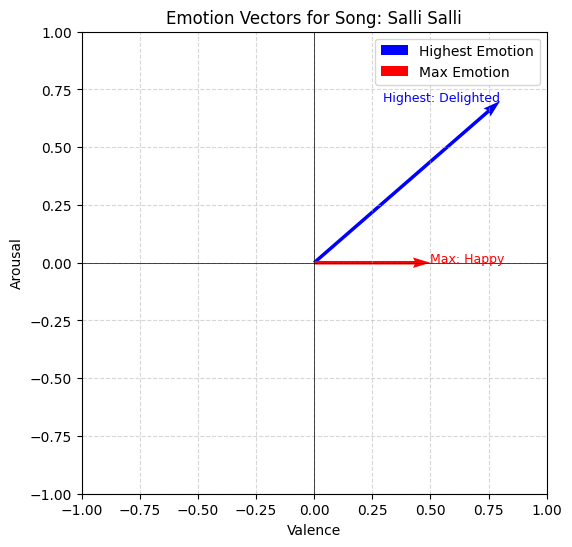

...

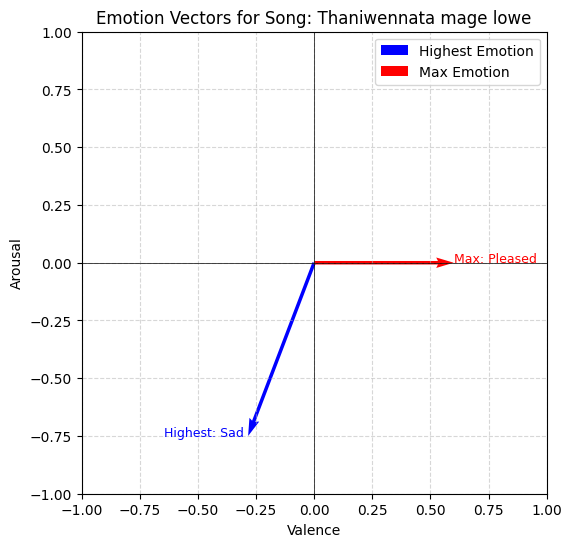

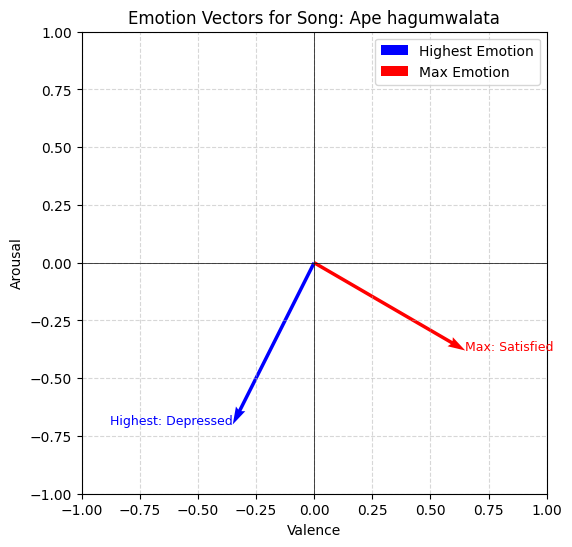

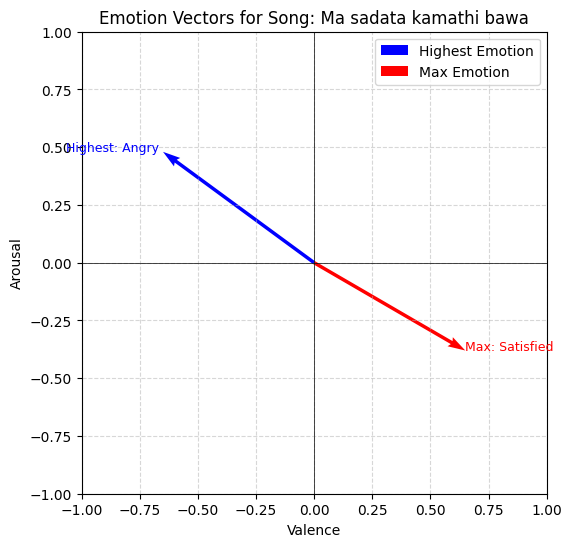

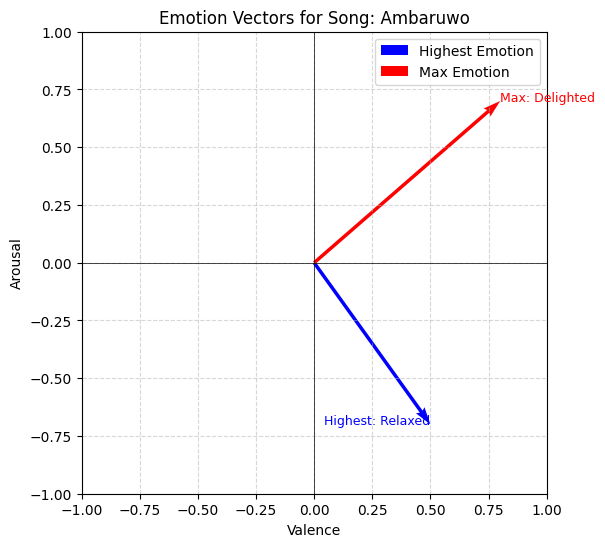

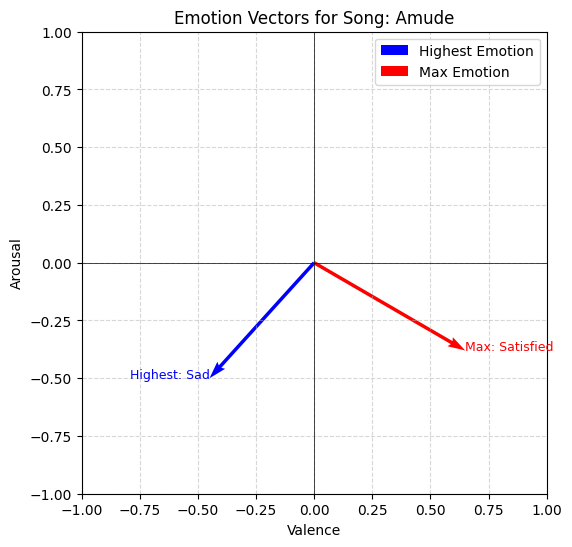

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot vectors for each song
def plot_emotion_vectors(df):
    for index, row in df.iterrows():
        song = row['Song']
        highest_emotion = row['Highest_Emotion']
        max_emotion = row['Max_Emotion']

        # Get the valence and arousal coordinates
        highest_va = emotion_va.get(highest_emotion, (0, 0))
        max_va = emotion_va.get(max_emotion, (0, 0))

        # Create the plot
        plt.figure(figsize=(6, 6))
        plt.axhline(0, color='black',linewidth=0.5)
        plt.axvline(0, color='black',linewidth=0.5)
        plt.grid(True, linestyle='--', alpha=0.5)

        # Plot the vectors for Highest_Emotion and Max_Emotion
        plt.quiver(0, 0, highest_va[0], highest_va[1], angles='xy', scale_units='xy', scale=1, color='blue', label='Highest Emotion')
        plt.quiver(0, 0, max_va[0], max_va[1], angles='xy', scale_units='xy', scale=1, color='red', label='Max Emotion')

        # Add labels
        plt.text(highest_va[0], highest_va[1], f'Highest: {highest_emotion}', color='blue', fontsize=9, ha='right')
        plt.text(max_va[0], max_va[1], f'Max: {max_emotion}', color='red', fontsize=9, ha='left')

        # Set plot limits and labels
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.xlabel('Valence')
        plt.ylabel('Arousal')
        plt.title(f'Emotion Vectors for Song: {song}')
        plt.legend()

        # Show the plot
        plt.show()

# Example usage:
plot_emotion_vectors(df_merged)


In [ ]:
# Calculate the average cosine similarity across all songs
avg_similarity = np.mean(df_merged['Cosine_Similarity'])
print(f"Average Cosine Similarity between Highest and Max Emotions: {avg_similarity:.2f}")

# Interpretation: A higher average value indicates that the emotions are often aligned.


Average Cosine Similarity between Highest and Max Emotions: 0.06


In [ ]:
# Calculate Euclidean distance for each song
def calculate_euclidean_distance(row):
    highest_va = np.array(emotion_va.get(row['Highest_Emotion'], (0, 0)))
    max_va = np.array(emotion_va.get(row['Max_Emotion'], (0, 0)))
    return np.linalg.norm(highest_va - max_va)

df_merged['Emotional_Distance'] = df_merged.apply(calculate_euclidean_distance, axis=1)

# Print the top 5 songs with the greatest emotional distance
top_variability_songs = df_merged[['Song', 'Emotional_Distance']].sort_values(by='Emotional_Distance', ascending=False).head(5)
print("Top 5 Songs with Greatest Emotional Variability:")
print(top_variability_songs)


Top 5 Songs with Greatest Emotional Variability:
                      Song  Emotional_Distance
1          Kaari Naa Sanda            1.732772
6              Perawadanak            1.732772
17  Ma sadata kamathi bawa            1.558717
18                Ambaruwo            1.431782
2        Danena Thuru Maa             1.414214


In [ ]:
import pandas as pd

# DataFrame 'merged_data' assumed to have columns like 'Song', 'Judge_1_Valence', 'Judge_1_Arousal', etc.

# Create a dictionary to store centroid results for each song
centroid_results = {}

# Loop through each song to calculate centroids
for song in merged_data['Song'].unique():
    # Filter data for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Initialize dictionary for the current song
    song_centroids = {}

    # Calculate centroid for each judge
    for judge_num in range(1, 4):
        valence_col = f'Judge_{judge_num}_Valence'
        arousal_col = f'Judge_{judge_num}_Arousal'

        # Calculate the mean valence and arousal for the current judge
        centroid_valence = song_data[valence_col].mean()
        centroid_arousal = song_data[arousal_col].mean()

        # Store results for each judge
        song_centroids[f'Judge_{judge_num}_Centroid'] = (centroid_valence, centroid_arousal)

    # Calculate the overall centroid for the song by averaging across all judges
    overall_valence = song_data[[f'Judge_{num}_Valence' for num in range(1, 4)]].mean().mean()
    overall_arousal = song_data[[f'Judge_{num}_Arousal' for num in range(1, 4)]].mean().mean()
    song_centroids['Overall_Centroid'] = (overall_valence, overall_arousal)

    # Add the centroids of the current song to the main results dictionary
    centroid_results[song] = song_centroids

# Convert results into a DataFrame for better readability
centroid_df = pd.DataFrame.from_dict(centroid_results, orient='index')
centroid_df.columns = ['Judge_1_Centroid', 'Judge_2_Centroid', 'Judge_3_Centroid', 'Overall_Centroid']
centroid_df.reset_index(inplace=True)
centroid_df.rename(columns={'index': 'Song'}, inplace=True)

# Display the centroid DataFrame
print(centroid_df)


                        Song                             Judge_1_Centroid  \
0                Ansathu Oba    (0.3519893579283434, 0.09656970556935084)   
1            Ape hagumwalata   (0.4540826873385013, -0.08578811369509041)   
2                   Ambaruwo   (0.49568603213844253, 0.17194066749072928)   
3                      Amude    (0.5199041022908897, 0.12605221097496008)   
4            Kaari Naa Sanda     (0.4969217081850533, 0.2154041687849517)   
5          Danena Thuru Maa     (0.4208443616029823, 0.08575023299161232)   
6   Dannawada Adare Neethiya  (0.30997677119628336, 0.026045296167247375)   
7       Ehema dewal na hithe     (0.510499468650372, 0.12144881331916402)   
8                   Komaliya     (0.564617032672737, 0.21703267273701127)   
9                     Mohini   (0.5489301972685887, 0.031487101669195744)   
10     Kaluwarata Hitha Baya    (0.5636370656370656, 0.08326254826254825)   
11    Ma sadata kamathi bawa   (0.48272108843537415, -0.2525170068027211)   

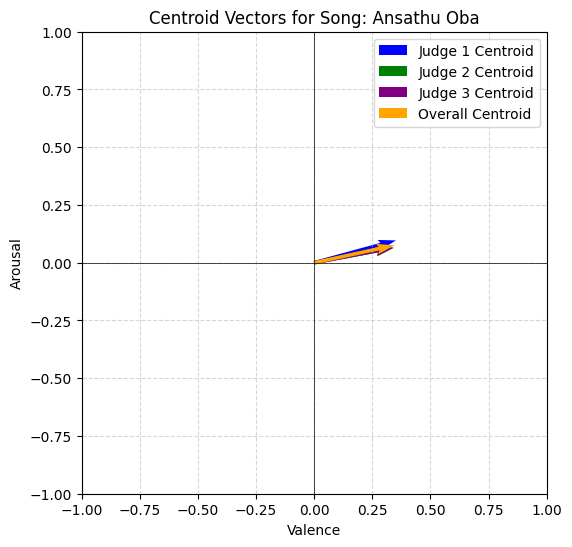

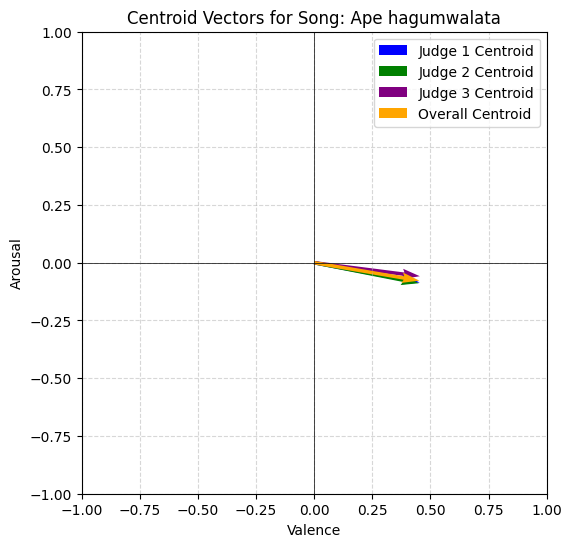

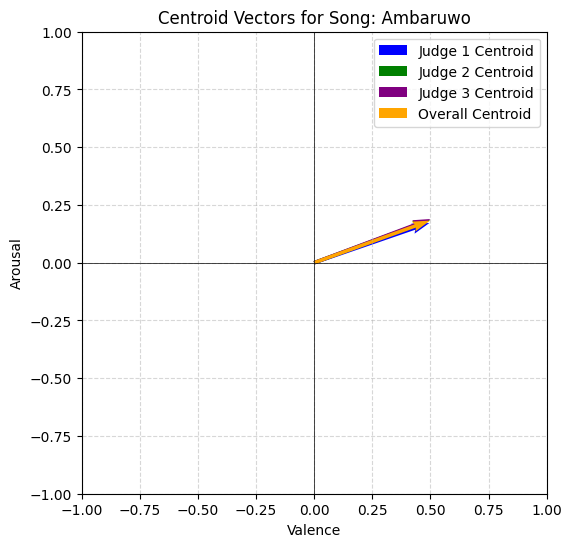

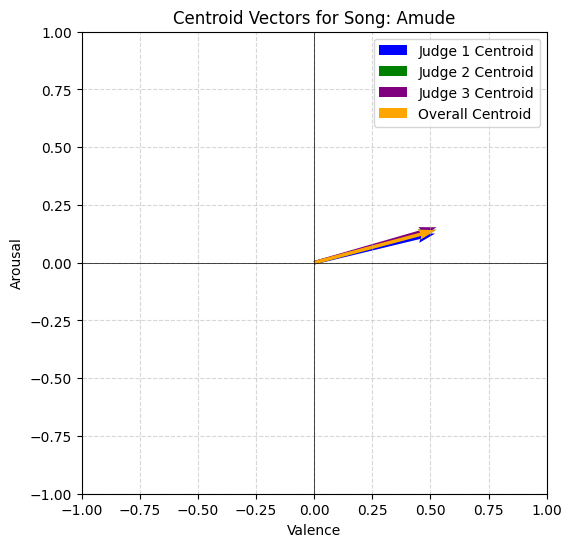

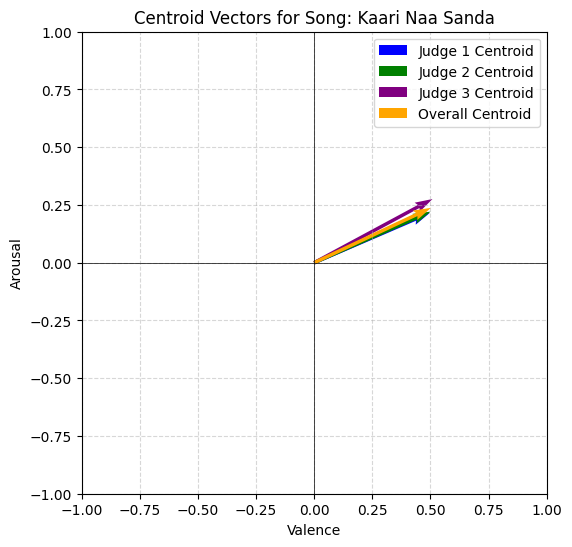

...

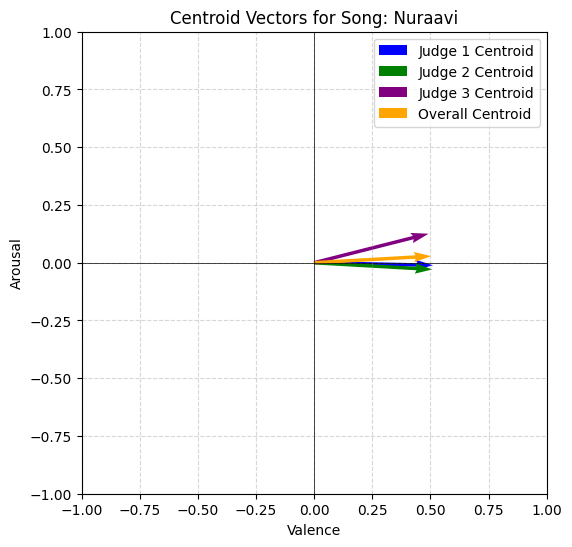

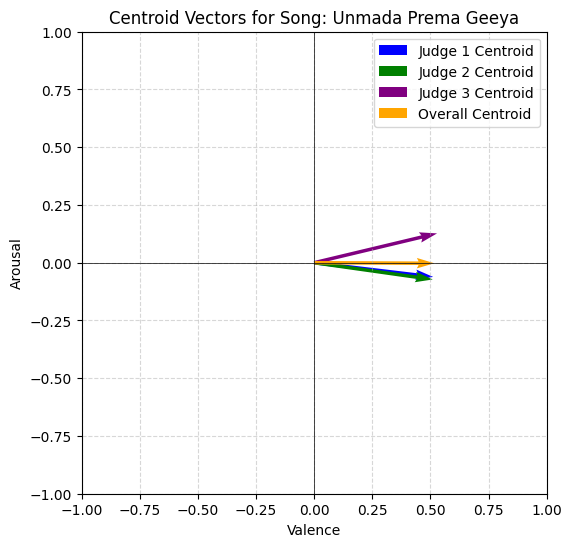

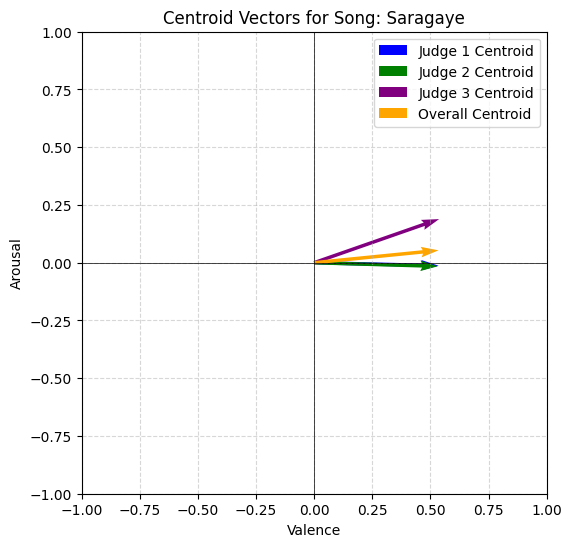

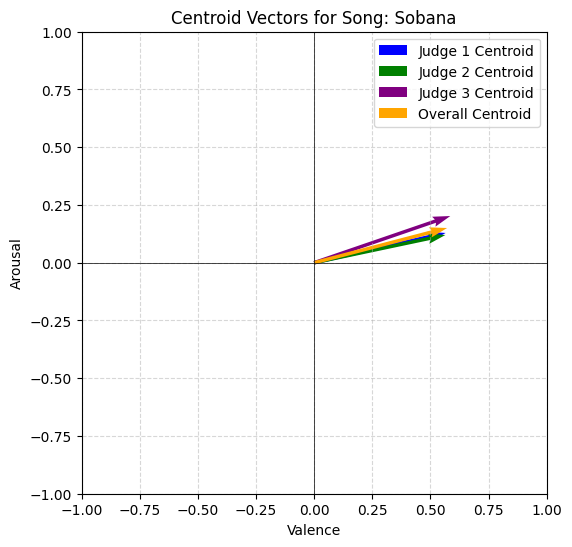

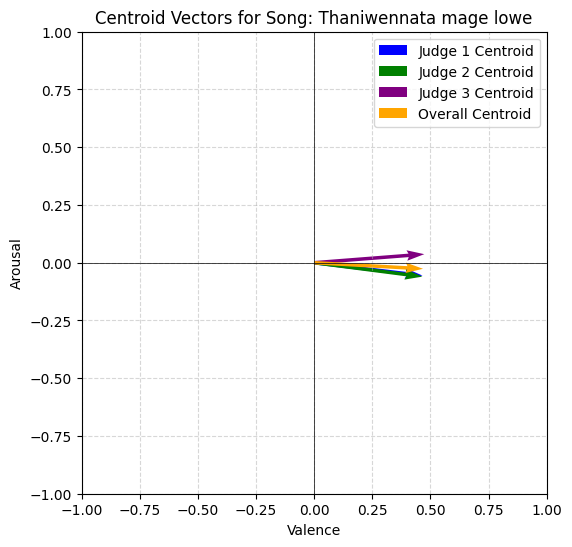

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot centroid vectors for each song and judge
def plot_centroid_vectors(df):
    for index, row in df.iterrows():
        song = row['Song']

        # Extract valence and arousal values for each judge and the overall centroid
        judge_1_va = row['Judge_1_Centroid']
        judge_2_va = row['Judge_2_Centroid']
        judge_3_va = row['Judge_3_Centroid']
        overall_va = row['Overall_Centroid']

        # Create the plot for the current song
        plt.figure(figsize=(6, 6))
        plt.axhline(0, color='black', linewidth=0.5)
        plt.axvline(0, color='black', linewidth=0.5)
        plt.grid(True, linestyle='--', alpha=0.5)

        # Plot vectors for each judge's centroid and the overall centroid
        plt.quiver(0, 0, judge_1_va[0], judge_1_va[1], angles='xy', scale_units='xy', scale=1, color='blue', label='Judge 1 Centroid')
        plt.quiver(0, 0, judge_2_va[0], judge_2_va[1], angles='xy', scale_units='xy', scale=1, color='green', label='Judge 2 Centroid')
        plt.quiver(0, 0, judge_3_va[0], judge_3_va[1], angles='xy', scale_units='xy', scale=1, color='purple', label='Judge 3 Centroid')
        plt.quiver(0, 0, overall_va[0], overall_va[1], angles='xy', scale_units='xy', scale=1, color='orange', label='Overall Centroid')

        # Add labels for each centroid
        #plt.text(judge_1_va[0], judge_1_va[1], 'Judge 1', color='blue', fontsize=9, ha='right')
        #plt.text(judge_2_va[0], judge_2_va[1], 'Judge 2', color='green', fontsize=9, ha='right')
        #plt.text(judge_3_va[0], judge_3_va[1], 'Judge 3', color='purple', fontsize=9, ha='right')
        #plt.text(overall_va[0], overall_va[1], 'Overall', color='orange', fontsize=9, ha='right')

        # Set plot limits and labels
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.xlabel('Valence')
        plt.ylabel('Arousal')
        plt.title(f'Centroid Vectors for Song: {song}')
        plt.legend()

        # Show the plot
        plt.show()

# Example usage
plot_centroid_vectors(centroid_df)


In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/Classification_of_Songs.xlsx'
song_classification = pd.read_excel(file_path)
song_classification

,Song,Judge 01,Judge 02,Judge 03
0,Unmada Prema Geeya,Happy,Delighted,Happy
1,Kaari Naa Sanda,Sad,Depressed,Sad
2,Danena Thuru Maa,Frustrated,Distressed,Distressed
3,Piyanani,Sad,Depressed,Sad
4,Salli Salli,Excited,Delighted,Delighted
5,Saragaye,Relaxed,Relaxed,Relaxed
6,Perawadanak,Sad,Sad,Sad
7,Ansathu Oba,Frustrated,Tense,Tense
8,Dannawada Adare Neethiya,Frustrated,Frustrated,Tense
9,Komaliya,Happy,Happy,Happy


In [ ]:
import pandas as pd

# Emotion-to-valence-arousal mapping dictionary
emotion_va = {
    'Happy': (0.5, 0.0),
    'Excited': (0.4, 0.9),
    'Calm': (0.4, -0.4),
    'Relaxed': (0.5, -0.7),
    'Angry': (-0.5, 0.7),
    'Frustrated': (-0.7, 0.4),
    'Sad': (-0.45, -0.5),
    'Depressed': (-0.35, -0.7),
    'Afraid': (-0.4, 0.8),
    'Astonished': (0.35, 0.8),
    'Bored': (-0.5, -0.7),
    'Tense': (-0.6, 0.6),
    'Delighted': (0.8, 0.7),
    'Gloomy': (-0.6, -0.6),
    'Alarmed': (-0.4, 0.9),
    'Content': (0.6, -0.3),
    'Miserable': (-0.3, -0.6),
    'Aroused': (0.2, 1.0),
    'Sleepy': (-0.3, -0.9),
    'Annoyed': (-0.8, 0.3),
    'Droopy': (-0.5, -0.8),
    'Pleased': (0.6, 0.0),
    'Glad': (0.6, 0.4),
    'Ease': (0.4, -0.6),
    'Serene': (0.5, -0.5),
    'Distressed': (-0.6, 0.5),
    'Tired':(-0.55, -0.75),
    'Satisfied':(0.52, -0.25)
}

# Map valence and arousal values for each judge
for judge in ['Judge 01', 'Judge 02', 'Judge 03']:
    song_classification[f'{judge}_Valence'] = song_classification[judge].map(lambda x: emotion_va.get(x, (0, 0))[0])
    song_classification[f'{judge}_Arousal'] = song_classification[judge].map(lambda x: emotion_va.get(x, (0, 0))[1])

# Display the updated DataFrame
print(song_classification)


                        Song    Judge 01    Judge 02    Judge 03  \
0         Unmada Prema Geeya       Happy   Delighted       Happy   
1            Kaari Naa Sanda         Sad   Depressed         Sad   
2          Danena Thuru Maa   Frustrated  Distressed  Distressed   
3                   Piyanani         Sad   Depressed         Sad   
4                Salli Salli     Excited   Delighted   Delighted   
5                   Saragaye     Relaxed     Relaxed     Relaxed   
6                Perawadanak         Sad         Sad         Sad   
7                Ansathu Oba  Frustrated       Tense       Tense   
8   Dannawada Adare Neethiya  Frustrated  Frustrated       Tense   
9                   Komaliya       Happy       Happy       Happy   
10                    Mohini   Satisfied   Miserable   Satisfied   
11                   Nuraavi        Calm     Relaxed        Calm   
12     Kaluwarata Hitha Baya      Afraid      Afraid      Afraid   
13                    Sobana   Satisfied     Rel

In [ ]:
# Calculate the centroid (average valence and arousal) for each song
song_classification['Song_Centroid_Valence'] = song_classification[[f'Judge 01_Valence', f'Judge 02_Valence', f'Judge 03_Valence']].mean(axis=1)
song_classification['Song_Centroid_Arousal'] = song_classification[[f'Judge 01_Arousal', f'Judge 02_Arousal', f'Judge 03_Arousal']].mean(axis=1)

# Display the updated DataFrame with centroid values
print(song_classification[['Song', 'Song_Centroid_Valence', 'Song_Centroid_Arousal']])

                        Song  Song_Centroid_Valence  Song_Centroid_Arousal
0         Unmada Prema Geeya               0.600000               0.233333
1            Kaari Naa Sanda              -0.416667              -0.566667
2          Danena Thuru Maa               -0.633333               0.466667
3                   Piyanani              -0.416667              -0.566667
4                Salli Salli               0.666667               0.766667
5                   Saragaye               0.500000              -0.700000
6                Perawadanak              -0.450000              -0.500000
7                Ansathu Oba              -0.633333               0.533333
8   Dannawada Adare Neethiya              -0.666667               0.466667
9                   Komaliya               0.500000               0.000000
10                    Mohini               0.246667              -0.366667
11                   Nuraavi               0.433333              -0.500000
12     Kaluwarata Hitha B

In [ ]:
song_classification_from_comment=song_classification[['Song', 'Centroid_Valence', 'Centroid_Arousal']]

In [ ]:
import pandas as pd

# DataFrame 'merged_data' assumed to have columns like 'Song', 'Judge_1_Valence', 'Judge_1_Arousal', etc.

# Create a dictionary to store centroid results for each song
centroid_results = {}

# Loop through each song to calculate centroids
for song in merged_data['Song'].unique():
    # Filter data for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Initialize dictionary for the current song
    song_centroids = {}

    # Calculate centroid for each judge
    for judge_num in range(1, 4):
        valence_col = f'Judge_{judge_num}_Valence'
        arousal_col = f'Judge_{judge_num}_Arousal'

        # Calculate the mean valence and arousal for the current judge
        centroid_valence = song_data[valence_col].mean()
        centroid_arousal = song_data[arousal_col].mean()

        # Store results for each judge
        song_centroids[f'Judge_{judge_num}_Centroid'] = (centroid_valence, centroid_arousal)

    # Calculate the overall centroid for the song by averaging across all judges
    overall_valence = song_data[[f'Judge_{num}_Valence' for num in range(1, 4)]].mean().mean()
    overall_arousal = song_data[[f'Judge_{num}_Arousal' for num in range(1, 4)]].mean().mean()
    song_centroids['Overall_Centroid'] = (overall_valence, overall_arousal)

    # Add the centroids of the current song to the main results dictionary
    centroid_results[song] = song_centroids

# Convert results into a DataFrame for better readability
centroid_df = pd.DataFrame.from_dict(centroid_results, orient='index')
centroid_df.columns = ['Judge_1_Centroid', 'Judge_2_Centroid', 'Judge_3_Centroid', 'Overall_Centroid']
centroid_df.reset_index(inplace=True)
centroid_df.rename(columns={'index': 'Song'}, inplace=True)

# Extracting overall valence and arousal centroids into separate columns
centroid_df['Overall_Valence'] = centroid_df['Overall_Centroid'].apply(lambda x: x[0])
centroid_df['Overall_Arousal'] = centroid_df['Overall_Centroid'].apply(lambda x: x[1])

# Select relevant columns for the final output
final_output = centroid_df[['Song', 'Overall_Valence', 'Overall_Arousal']]

# Display the final output DataFrame
print(final_output)


                        Song  Overall_Valence  Overall_Arousal
0                Ansathu Oba         0.345066         0.075453
1            Ape hagumwalata         0.452739        -0.077692
2                   Ambaruwo         0.498405         0.182303
3                      Amude         0.523722         0.140792
4            Kaari Naa Sanda         0.502160         0.237434
5          Danena Thuru Maa          0.420876         0.079845
6   Dannawada Adare Neethiya         0.315461         0.012969
7       Ehema dewal na hithe         0.509476         0.110574
8                   Komaliya         0.562205         0.201687
9                     Mohini         0.550873         0.035799
10     Kaluwarata Hitha Baya         0.559063         0.066532
11    Ma sadata kamathi bawa         0.480703        -0.237642
12                  Piyanani         0.451051         0.065897
13               Salli Salli         0.589929         0.164728
14               Perawadanak         0.560441         0

In [ ]:
combined_df = final_output.merge(song_classification_from_comment, on='Song', how='left')
combined_df

,Song,Overall_Valence,Overall_Arousal,Centroid_Valence,Centroid_Arousal
0,Ansathu Oba,0.345066,0.075453,-0.633333,0.533333
1,Ape hagumwalata,0.452739,-0.077692,-0.233333,-0.466667
2,Ambaruwo,0.498405,0.182303,0.506667,-0.550000
3,Amude,0.523722,0.140792,-0.400000,-0.533333
4,Kaari Naa Sanda,0.502160,0.237434,-0.416667,-0.566667
5,Danena Thuru Maa,0.420876,0.079845,-0.633333,0.466667
6,Dannawada Adare Neethiya,0.315461,0.012969,-0.666667,0.466667
7,Ehema dewal na hithe,0.509476,0.110574,0.500000,-0.700000
8,Komaliya,0.562205,0.201687,0.500000,0.000000
9,Mohini,0.550873,0.035799,0.246667,-0.366667


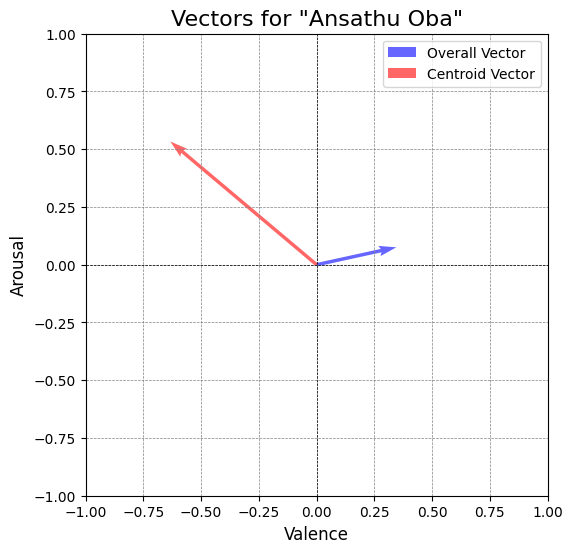

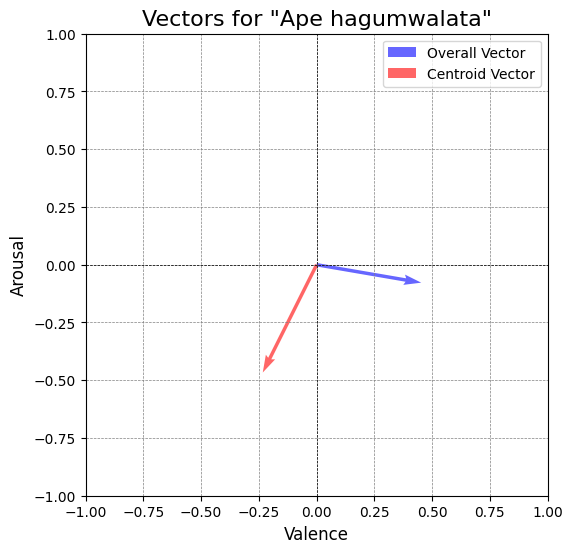

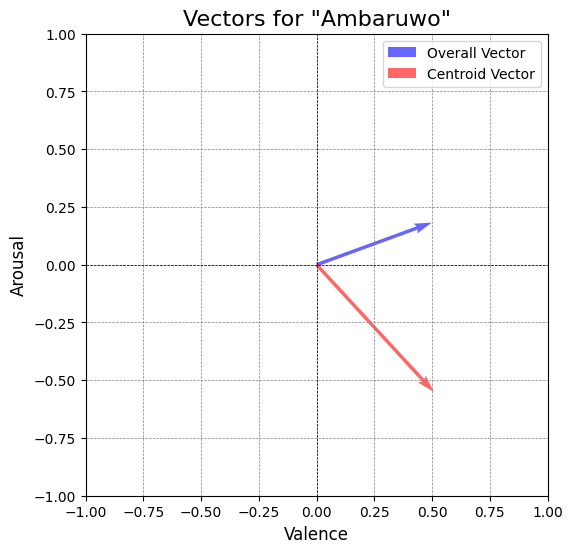

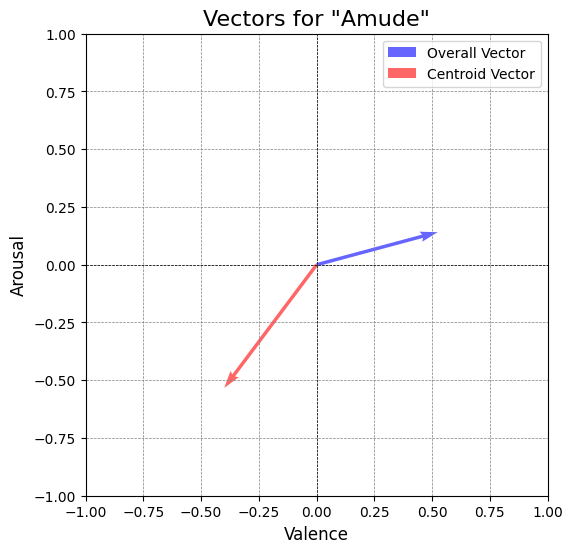

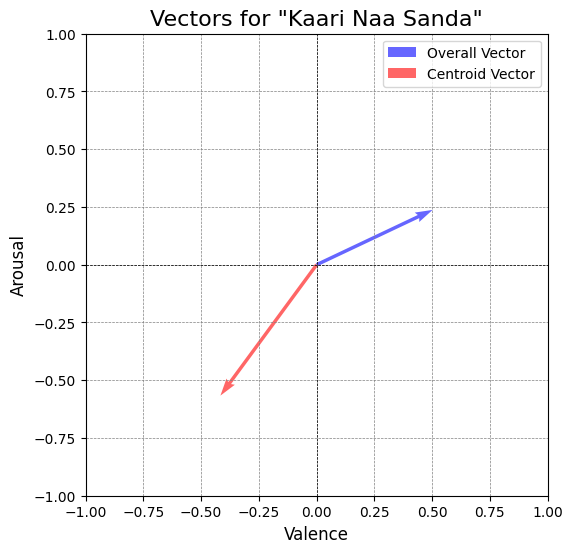

...

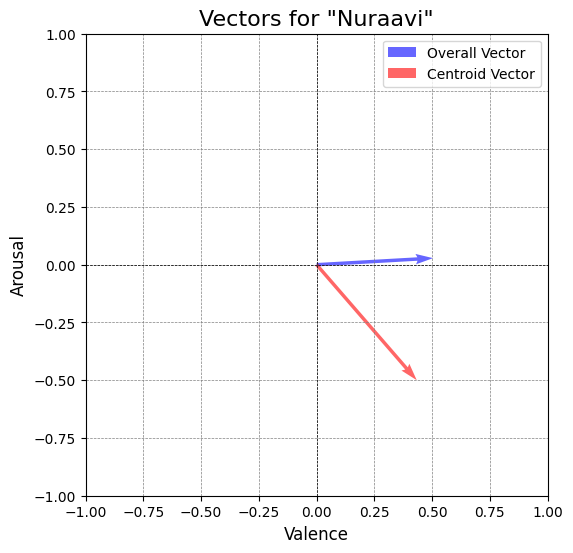

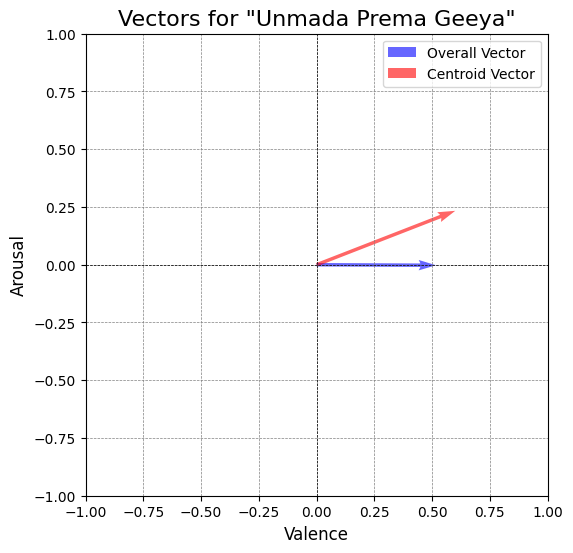

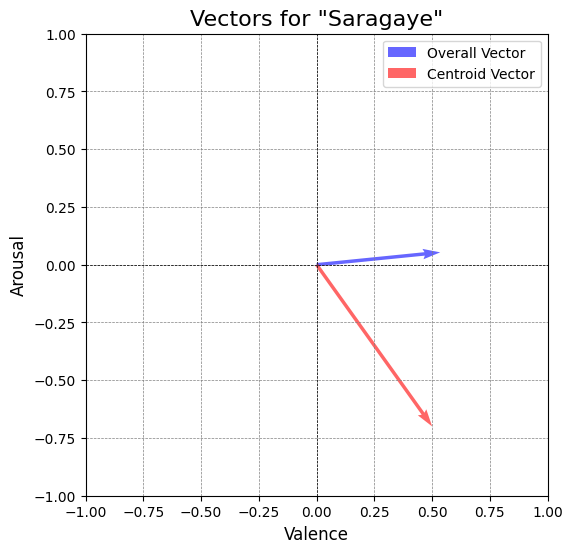

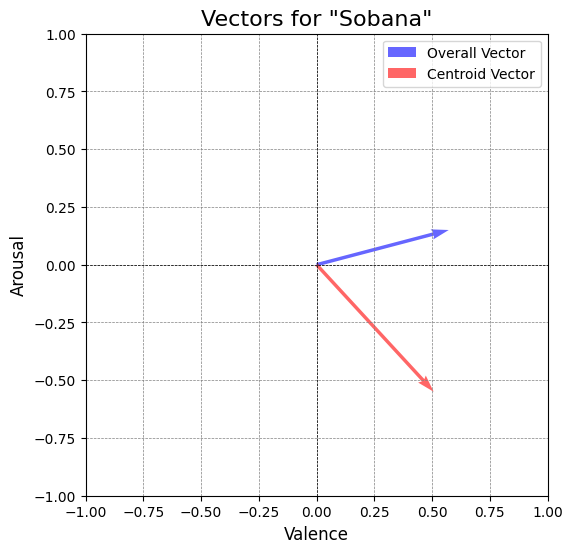

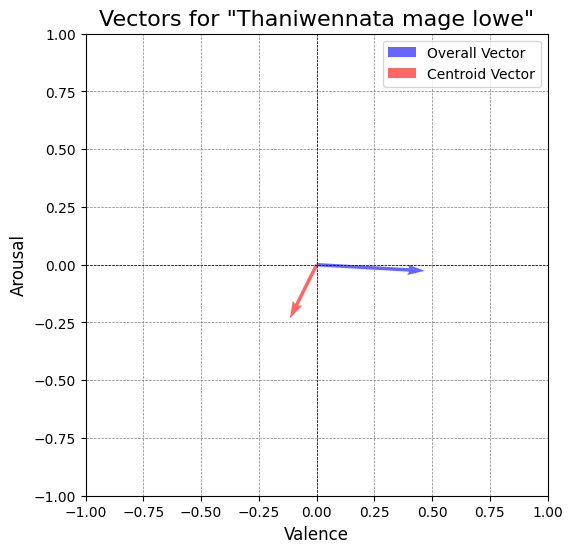

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate through each song in combined_df and create a plot
for index, row in combined_df.iterrows():
    song = row['Song']
    overall_vector = np.array([row['Overall_Valence'], row['Overall_Arousal']])
    centroid_vector = np.array([row['Centroid_Valence'], row['Centroid_Arousal']])

    # Create a new figure for each song
    plt.figure(figsize=(8, 6))

    # Plot the overall vector
    plt.quiver(0, 0, overall_vector[0], overall_vector[1],
               angles='xy', scale_units='xy', scale=1, color='blue', alpha=0.6, label='Overall Vector')

    # Plot the centroid vector
    plt.quiver(0, 0, centroid_vector[0], centroid_vector[1],
               angles='xy', scale_units='xy', scale=1, color='red', alpha=0.6, label='Centroid Vector')

    # Set limits for better visualization
    plt.xlim(-1, 1)
    plt.ylim(-1, 1)

    # Add grid, labels, and title
    plt.axhline(0, color='black', linewidth=0.5, ls='--')
    plt.axvline(0, color='black', linewidth=0.5, ls='--')
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.title(f'Vectors for "{song}"', fontsize=16)
    plt.xlabel('Valence', fontsize=12)
    plt.ylabel('Arousal', fontsize=12)
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')  # Equal aspect ratio ensures correct scaling

    # Show the plot
    plt.show()


### Normalizing Data

In [ ]:
import pandas as pd

# Assuming 'merged_data' is the DataFrame with columns: 'Song', 'Judge_1_Valence', 'Judge_1_Arousal', etc.

# Function to normalize valence and arousal values for each judge
def remove_biases(df):
    # Group by 'Song' and apply transformations
    def normalize_group(song_group):
        for judge_num in range(1, 4):
            # Calculate mean for Valence and Arousal for the current song and judge
            mean_valence = song_group[f'Judge_{judge_num}_Valence'].mean()
            mean_arousal = song_group[f'Judge_{judge_num}_Arousal'].mean()

            # Subtract the mean for valence and arousal
            song_group[f'Judge_{judge_num}_Valence_Bias_Corrected'] = song_group[f'Judge_{judge_num}_Valence'] - mean_valence
            song_group[f'Judge_{judge_num}_Arousal_Bias_Corrected'] = song_group[f'Judge_{judge_num}_Arousal'] - mean_arousal

            # Normalize by dividing by the max absolute value of (comment - mean) for each judge
            valence_max = song_group[f'Judge_{judge_num}_Valence_Bias_Corrected'].abs().max()
            arousal_max = song_group[f'Judge_{judge_num}_Arousal_Bias_Corrected'].abs().max()

            # Avoid division by zero
            if valence_max != 0:
                song_group[f'Judge_{judge_num}_Valence_Normalized'] = song_group[f'Judge_{judge_num}_Valence_Bias_Corrected'] / valence_max
            else:
                song_group[f'Judge_{judge_num}_Valence_Normalized'] = 0

            if arousal_max != 0:
                song_group[f'Judge_{judge_num}_Arousal_Normalized'] = song_group[f'Judge_{judge_num}_Arousal_Bias_Corrected'] / arousal_max
            else:
                song_group[f'Judge_{judge_num}_Arousal_Normalized'] = 0

        return song_group

    # Apply the normalization function to each group (song)
    df_normalized = df.groupby('Song').apply(normalize_group).reset_index(drop=True)
    return df_normalized

# Apply the function to remove biases and normalize the dataset
normalized_data = remove_biases(merged_data)

# Display the first few rows of the normalized dataset
print(normalized_data)


       Index       Artist                Song  \
0      58300  Saman Lenin            Ambaruwo   
1      58301  Saman Lenin            Ambaruwo   
2      58302  Saman Lenin            Ambaruwo   
3      58303  Saman Lenin            Ambaruwo   
4      58304  Saman Lenin            Ambaruwo   
...      ...          ...                 ...   
63410  55012          BnS  Unmada Prema Geeya   
63411  55013          BnS  Unmada Prema Geeya   
63412  55014          BnS  Unmada Prema Geeya   
63413  55015          BnS  Unmada Prema Geeya   
63414  55016          BnS  Unmada Prema Geeya   

                                                 Comment Judge_1_Emotion  \
0      හ්ර්සන&lt;බ්\u200dර&gt;දිසානයක&lt;බ්\u200dර&gt...       Satisfied   
1                             අසම චරිතයක් සමන් ලෙනින් ❤️           Happy   
2         ඉ වට්චෙඩ් තිස් මොරේ තැන 100 ටිමෙස් බුට් ඉ දොන්            Calm   
3                                           තෙරුවන් සරණි       Satisfied   
4                              

<ipython-input-14-62ab9a3aa602>:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_normalized = df.groupby('Song').apply(normalize_group).reset_index(drop=True)


In [ ]:
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/normalized_data2.xlsx'
normalized_data.to_excel(file_path, index=False)


In [ ]:
import pandas as pd

# File path
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/normalized_data2.xlsx'

# Load the Excel file
normalized_data = pd.read_excel(file_path)

# Display the first few rows of the data
print(normalized_data.head())


   Index               Artist         Song  \
0      0  Thisara Weerasinghe  Ansathu Oba   
1      1  Thisara Weerasinghe  Ansathu Oba   
2      2  Thisara Weerasinghe  Ansathu Oba   
3      3  Thisara Weerasinghe  Ansathu Oba   
4      4  Thisara Weerasinghe  Ansathu Oba   

                                             Comment Judge_1_Emotion  \
0  බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1  ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2             මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3  මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                                 ඇත්තටම ලස්සනයි ඒක🥰           Happy   

  Judge_2_Emotion Judge_3_Emotion  Judge_1_Valence  Judge_1_Arousal  \
0       Satisfied       Satisfied             0.52            -0.25   
1         Pleased           Happy             0.60            -0.30   
2            Glad            Glad             0.60             0.40   
3     

In [ ]:
import pandas as pd

# Assuming 'merged_data' is your DataFrame with the specified columns
# Step 1: Calculate the average for each Valence and Arousal column grouped at song level
avg_cols = ['Judge_1_Valence', 'Judge_1_Arousal', 'Judge_2_Valence', 'Judge_2_Arousal', 'Judge_3_Valence', 'Judge_3_Arousal']
averages = merged_data.groupby('Song')[avg_cols].transform('mean')

# Add the averages as new columns
for col in avg_cols:
    merged_data[f'{col}_Avg'] = averages[col]

# Step 2: Subtract the average from the original value to get the differences
for col in avg_cols:
    merged_data[f'Diff_{col}'] = merged_data[col] - merged_data[f'{col}_Avg']

# Step 3: Calculate the max difference for each Valence and Arousal column grouped at song level
diff_cols = [f'Diff_{col}' for col in avg_cols]
max_diffs = merged_data.groupby('Song')[diff_cols].transform('max')

# Add the max differences as new columns
for col in diff_cols:
    merged_data[f'{col}_Max'] = max_diffs[col]

# Step 4: Standardize the Valence and Arousal values by dividing the difference by the max difference
for col in avg_cols:
    diff_col = f'Diff_{col}'
    max_col = f'{diff_col}_Max'
    std_col = f'Std_{col}'

    # Avoid division by zero
    merged_data[std_col] = merged_data[diff_col] / merged_data[max_col].replace(0, 1)  # Replace 0 to prevent division by zero

# Display the first few rows of the updated dataset
print(merged_data)

# Optionally, export the result to an Excel file
merged_data.to_excel('normalized_data.xlsx', index=False)
print("Normalized data exported to 'normalized_data.xlsx'")


       Index               Artist         Song  \
0          0  Thisara Weerasinghe  Ansathu Oba   
1          1  Thisara Weerasinghe  Ansathu Oba   
2          2  Thisara Weerasinghe  Ansathu Oba   
3          3  Thisara Weerasinghe  Ansathu Oba   
4          4  Thisara Weerasinghe  Ansathu Oba   
...      ...                  ...          ...   
63466  57132  Thisara Weerasinghe  Ansathu Oba   
63467  57133  Thisara Weerasinghe  Ansathu Oba   
63468  57134  Thisara Weerasinghe  Ansathu Oba   
63469  57135  Thisara Weerasinghe  Ansathu Oba   
63470  57136  Thisara Weerasinghe  Ansathu Oba   

                                                 Comment Judge_1_Emotion  \
0      බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1      ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2                 මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3      මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                  

In [ ]:
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/normalized_data2.xlsx'
merged_data.to_excel(file_path, index=False)


In [ ]:
import pandas as pd

# Assuming 'merged_data' is your DataFrame with the specified columns
# Step 1: Calculate the average for each Valence and Arousal column grouped at song level
avg_cols = ['Judge_1_Valence', 'Judge_1_Arousal', 'Judge_2_Valence', 'Judge_2_Arousal', 'Judge_3_Valence', 'Judge_3_Arousal']
averages = merged_data.groupby('Song')[avg_cols].transform('mean')

# Add the averages as new columns
for col in avg_cols:
    merged_data[f'{col}_Avg'] = averages[col]

# Step 2: Subtract the average from the original value to get the differences
for col in avg_cols:
    merged_data[f'Diff_{col}'] = merged_data[col] - merged_data[f'{col}_Avg']

# Step 3: Calculate the max absolute difference for each Valence and Arousal column grouped at the song level
diff_cols = [f'Diff_{col}' for col in avg_cols]  # Create a list of the difference columns
max_diffs = merged_data.groupby('Song')[diff_cols].transform(lambda x: x.abs().max())

# Add the max absolute differences as new columns
for col in diff_cols:
    merged_data[f'{col}_Max'] = max_diffs[col]

# Step 4: Standardize the Valence and Arousal values by dividing the difference by the max difference
for col in avg_cols:
    diff_col = f'Diff_{col}'
    max_col = f'{diff_col}_Max'
    std_col = f'Std_{col}'

    # Avoid division by zero
    merged_data[std_col] = merged_data[diff_col] / merged_data[max_col].replace(0, 1)  # Replace 0 to prevent division by zero

# Display the first few rows of the updated dataset
print(merged_data)

# Optionally, export the result to an Excel file
merged_data.to_excel('normalized_data.xlsx', index=False)
print("Normalized data exported to 'normalized_data.xlsx'")


       Index               Artist         Song  \
0          0  Thisara Weerasinghe  Ansathu Oba   
1          1  Thisara Weerasinghe  Ansathu Oba   
2          2  Thisara Weerasinghe  Ansathu Oba   
3          3  Thisara Weerasinghe  Ansathu Oba   
4          4  Thisara Weerasinghe  Ansathu Oba   
...      ...                  ...          ...   
63466  57132  Thisara Weerasinghe  Ansathu Oba   
63467  57133  Thisara Weerasinghe  Ansathu Oba   
63468  57134  Thisara Weerasinghe  Ansathu Oba   
63469  57135  Thisara Weerasinghe  Ansathu Oba   
63470  57136  Thisara Weerasinghe  Ansathu Oba   

                                                 Comment Judge_1_Emotion  \
0      බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1      ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2                 මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3      මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                  

In [ ]:
import pandas as pd

# Assuming 'merged_data' is your DataFrame with the specified columns
# Step 1: Calculate the average for each Valence and Arousal column grouped at song level
avg_cols = ['Judge_1_Valence', 'Judge_1_Arousal', 'Judge_2_Valence', 'Judge_2_Arousal', 'Judge_3_Valence', 'Judge_3_Arousal']
averages = merged_data.groupby('Song')[avg_cols].transform('mean')

# Add the averages as new columns
for col in avg_cols:
    merged_data[f'{col}_Avg'] = averages[col]

# Step 2: Subtract the average from the original value to get the differences
for col in avg_cols:
    merged_data[f'Diff_{col}'] = merged_data[col] - merged_data[f'{col}_Avg']

# Step 3: Calculate the max absolute difference for each Valence and Arousal column grouped at the song level
diff_cols = [f'Diff_{col}' for col in avg_cols]  # Create a list of the difference columns
max_diffs = merged_data.groupby('Song')[diff_cols].transform(lambda x: x.abs().max())

# Add the max absolute differences as new columns
for col in diff_cols:
    merged_data[f'{col}_Max'] = max_diffs[col]

# Step 4: Standardize the Valence and Arousal values by dividing the difference by the max difference
for col in avg_cols:
    diff_col = f'Diff_{col}'
    max_col = f'{diff_col}_Max'
    std_col = f'Std_{col}'

    # Avoid division by zero
    merged_data[std_col] = merged_data[diff_col] / merged_data[max_col].replace(0, 1)  # Replace 0 to prevent division by zero

# Display the first few rows of the updated dataset
print(merged_data)

# Optionally, export the result to an Excel file
#merged_data.to_excel('normalized_data.xlsx', index=False)
#print("Normalized data exported to 'normalized_data.xlsx'")

file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/normalized_data26.12.xlsx'
merged_data.to_excel(file_path, index=False)

       Index               Artist         Song  \
0          0  Thisara Weerasinghe  Ansathu Oba   
1          1  Thisara Weerasinghe  Ansathu Oba   
2          2  Thisara Weerasinghe  Ansathu Oba   
3          3  Thisara Weerasinghe  Ansathu Oba   
4          4  Thisara Weerasinghe  Ansathu Oba   
...      ...                  ...          ...   
63410  57132  Thisara Weerasinghe  Ansathu Oba   
63411  57133  Thisara Weerasinghe  Ansathu Oba   
63412  57134  Thisara Weerasinghe  Ansathu Oba   
63413  57135  Thisara Weerasinghe  Ansathu Oba   
63414  57136  Thisara Weerasinghe  Ansathu Oba   

                                                 Comment Judge_1_Emotion  \
0      බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1      ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2                 මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3      මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                  

In [ ]:
import pandas as pd

# File path
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/normalized_data26.12.xlsx'

# Load the Excel file
merged_data = pd.read_excel(file_path)

# Display the first few rows of the data
print(merged_data.head())


   Index               Artist         Song  \
0      0  Thisara Weerasinghe  Ansathu Oba   
1      1  Thisara Weerasinghe  Ansathu Oba   
2      2  Thisara Weerasinghe  Ansathu Oba   
3      3  Thisara Weerasinghe  Ansathu Oba   
4      4  Thisara Weerasinghe  Ansathu Oba   

                                             Comment Judge_1_Emotion  \
0  බොහොම ස්තූතී ආදරණීය ප්‍රතිචාරයන්ට..  Channel එ...       Satisfied   
1  ජීවිතේ මේ මොහොත විතරයි...අපිට අපිවත් හිමි නෑ.....         Content   
2             මම නුඹට අයිතියක් නැතුවම ප්‍රේම කරමි ❤🥺            Glad   
3  මේ සින්දු ලස්සනයි එහෙමයි කියලා තමන්ගේ ගෑණි හරි...          Serene   
4                                 ඇත්තටම ලස්සනයි ඒක🥰           Happy   

  Judge_2_Emotion Judge_3_Emotion  Judge_1_Valence  Judge_1_Arousal  \
0       Satisfied       Satisfied             0.52            -0.25   
1         Pleased           Happy             0.60            -0.30   
2            Glad            Glad             0.60             0.40   
3     

In [ ]:
import pandas as pd

# DataFrame 'merged_data' assumed to have columns like 'Song', 'Judge_1_Valence', 'Judge_1_Arousal', etc.

# Create a dictionary to store centroid results for each song
centroid_results = {}

# Loop through each song to calculate centroids
for song in merged_data['Song'].unique():
    # Filter data for the current song
    song_data = merged_data[merged_data['Song'] == song]

    # Initialize dictionary for the current song
    song_centroids = {}

    # Calculate centroid for each judge (Std_Judge_3_Arousal)
    for judge_num in range(1, 4):
        valence_col = f'Std_Judge_{judge_num}_Valence'
        arousal_col = f'Std_Judge_{judge_num}_Arousal'

        # Calculate the mean valence and arousal for the current judge
        centroid_valence = song_data[valence_col].mean()
        centroid_arousal = song_data[arousal_col].mean()

        # Store results for each judge
        song_centroids[f'Std_Judge_{judge_num}_Centroid'] = (centroid_valence, centroid_arousal)

    # Calculate the overall centroid for the song by averaging across all judges
    overall_valence = song_data[[f'Std_Judge_{num}_Valence' for num in range(1, 4)]].mean().mean()
    overall_arousal = song_data[[f'Std_Judge_{num}_Arousal' for num in range(1, 4)]].mean().mean()
    song_centroids['Std_Overall_Centroid'] = (overall_valence, overall_arousal)

    # Add the centroids of the current song to the main results dictionary
    centroid_results[song] = song_centroids

# Convert results into a DataFrame for better readability
centroid_df = pd.DataFrame.from_dict(centroid_results, orient='index')
centroid_df.columns = ['Std_Judge_1_Centroid', 'Std_Judge_2_Centroid', 'Std_Judge_3_Centroid', 'Std_Overall_Centroid']
centroid_df.reset_index(inplace=True)
centroid_df.rename(columns={'index': 'Song'}, inplace=True)

# Display the centroid DataFrame
print(centroid_df)

                        Song  \
0                Ansathu Oba   
1            Ape hagumwalata   
2                   Ambaruwo   
3                      Amude   
4            Kaari Naa Sanda   
5          Danena Thuru Maa    
6   Dannawada Adare Neethiya   
7       Ehema dewal na hithe   
8                   Komaliya   
9                     Mohini   
10     Kaluwarata Hitha Baya   
11    Ma sadata kamathi bawa   
12                  Piyanani   
13               Salli Salli   
14               Perawadanak   
15                   Nuraavi   
16        Unmada Prema Geeya   
17                  Saragaye   
18                    Sobana   
19    Thaniwennata mage lowe   

                                 Std_Judge_1_Centroid  \
0   (1.6131512979299898e-17, -3.0246586836187307e-17)   
1    (8.032621366796998e-18, -2.2950346762277136e-17)   
2   (1.0978719650186961e-18, -1.7565951440299138e-17)   
3        (5.5836469645506e-17, 7.571046731594035e-18)   
4     (2.031928260625604e-17, -3.612316907

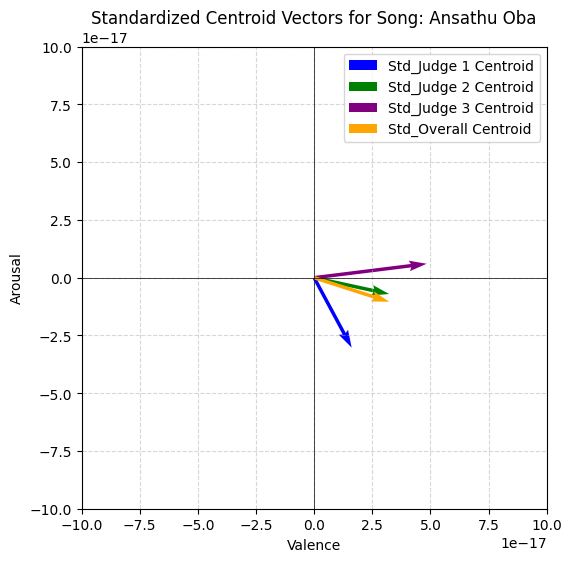

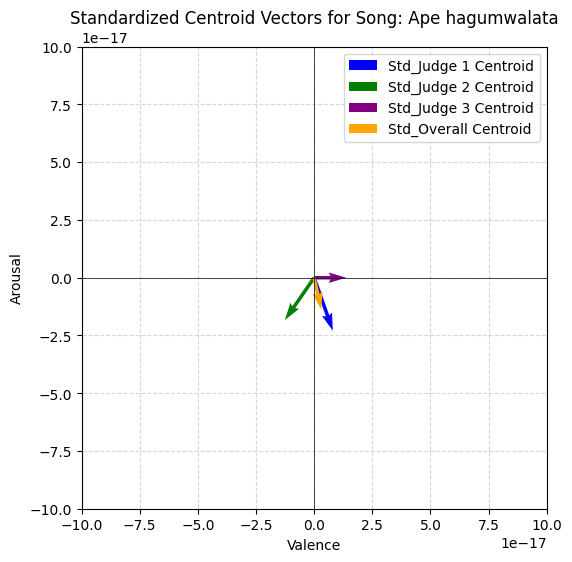

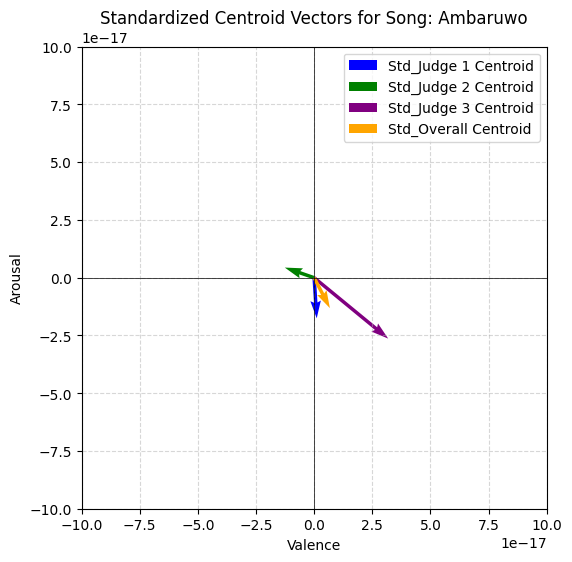

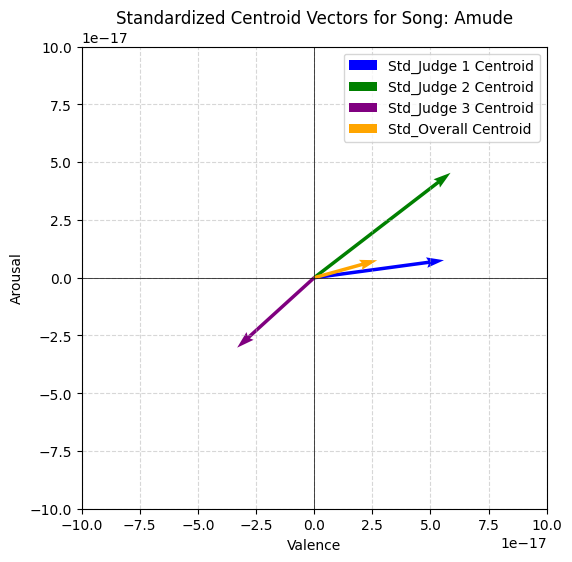

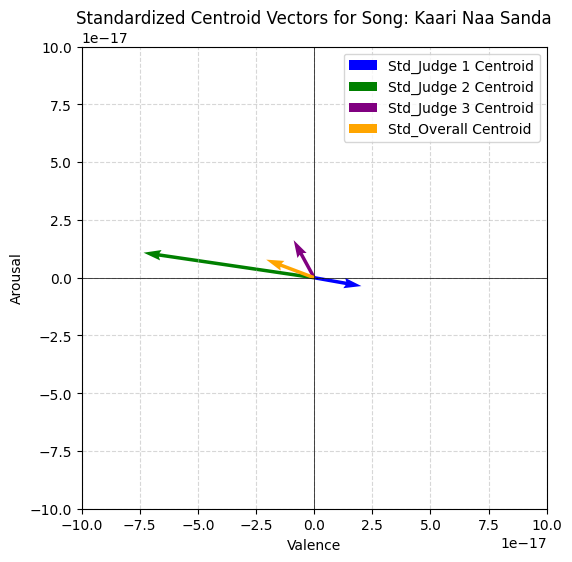

...

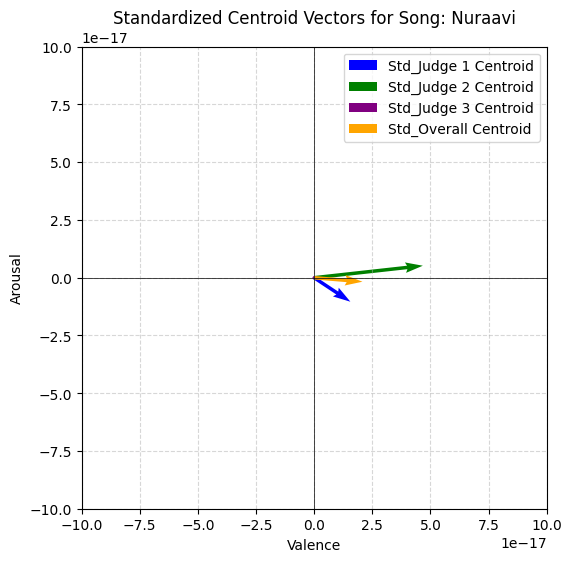

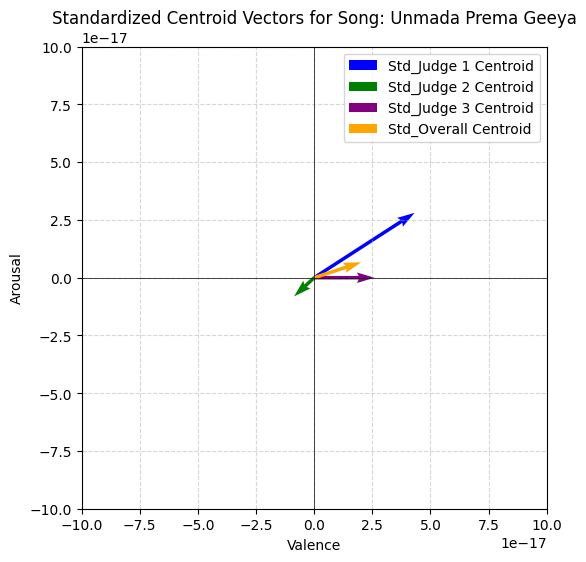

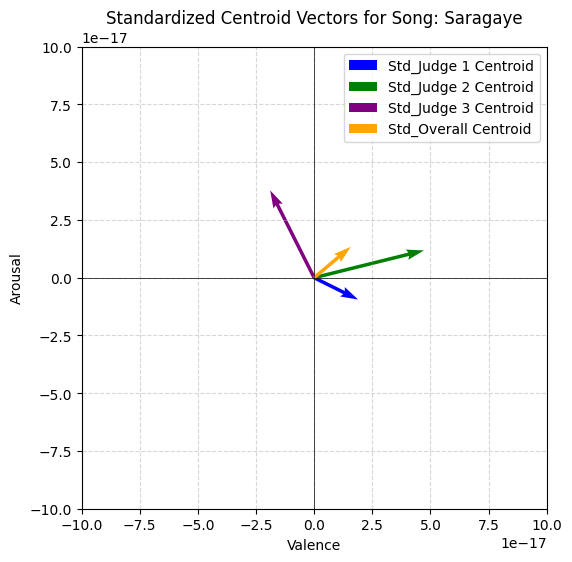

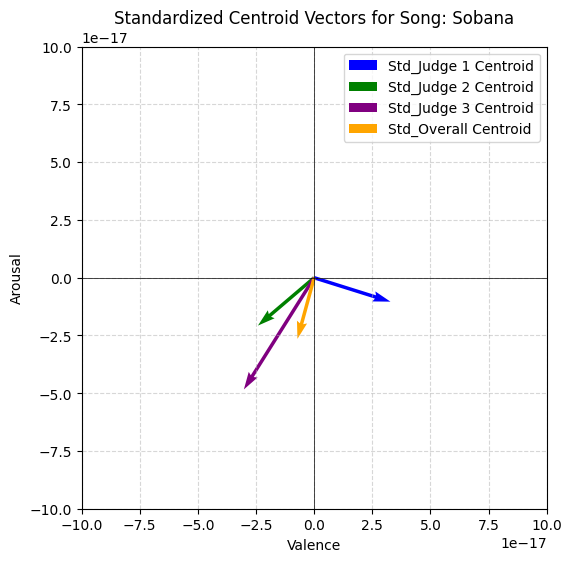

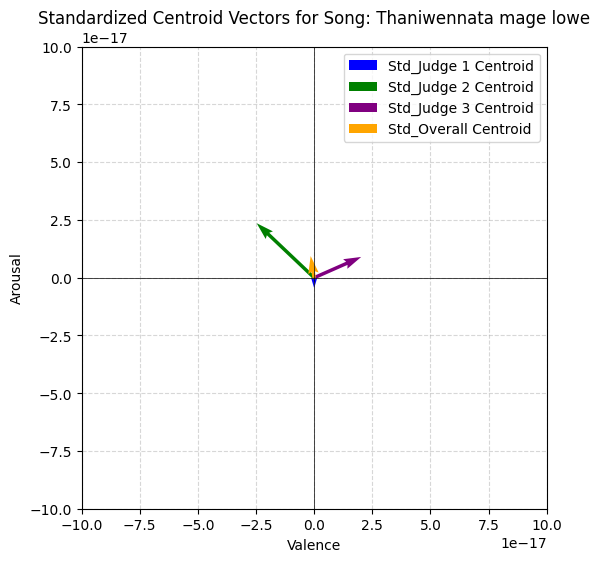

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot centroid vectors for each song and judge
def plot_centroid_vectors(df):
    for index, row in df.iterrows():
        song = row['Song']

        # Extract valence and arousal values for each judge and the overall centroid
        judge_1_va = row['Std_Judge_1_Centroid']
        judge_2_va = row['Std_Judge_2_Centroid']
        judge_3_va = row['Std_Judge_3_Centroid']
        overall_va = row['Std_Overall_Centroid']

        # Create the plot for the current song
        plt.figure(figsize=(6, 6))
        plt.axhline(0, color='black', linewidth=0.5)
        plt.axvline(0, color='black', linewidth=0.5)
        plt.grid(True, linestyle='--', alpha=0.5)

        # Plot vectors for each judge's centroid and the overall centroid
        plt.quiver(0, 0, judge_1_va[0], judge_1_va[1], angles='xy', scale_units='xy', scale=1, color='blue', label='Std_Judge 1 Centroid')
        plt.quiver(0, 0, judge_2_va[0], judge_2_va[1], angles='xy', scale_units='xy', scale=1, color='green', label='Std_Judge 2 Centroid')
        plt.quiver(0, 0, judge_3_va[0], judge_3_va[1], angles='xy', scale_units='xy', scale=1, color='purple', label='Std_Judge 3 Centroid')
        plt.quiver(0, 0, overall_va[0], overall_va[1], angles='xy', scale_units='xy', scale=1, color='orange', label='Std_Overall Centroid')

        # Set plot limits and labels
        plt.xlim(-1.0E-16, 1.0E-16)
        plt.ylim(-1.0E-16, 1.0E-16)
        plt.xlabel('Valence')
        plt.ylabel('Arousal')
        plt.title(f'Standardized Centroid Vectors for Song: {song}')
        plt.legend()

        # Show the plot
        plt.show()

# Example usage
plot_centroid_vectors(centroid_df)


In [ ]:
# Convert results into a DataFrame for better readability
centroid_df = pd.DataFrame.from_dict(centroid_results, orient='index')
centroid_df.columns = ['Judge_1_Centroid', 'Judge_2_Centroid', 'Judge_3_Centroid', 'Overall_Centroid']
centroid_df.reset_index(inplace=True)
centroid_df.rename(columns={'index': 'Song'}, inplace=True)

# Extracting overall valence and arousal centroids into separate columns
centroid_df['Overall_Valence'] = centroid_df['Overall_Centroid'].apply(lambda x: x[0])
centroid_df['Overall_Arousal'] = centroid_df['Overall_Centroid'].apply(lambda x: x[1])

# Select relevant columns for the final output
final_output = centroid_df[['Song', 'Overall_Valence', 'Overall_Arousal']]

# Display the final output DataFrame
print(final_output)


                        Song  Overall_Valence  Overall_Arousal
0                Ansathu Oba     3.226303e-17    -1.041827e-17
1            Ape hagumwalata     3.060046e-18    -1.377021e-17
2                   Ambaruwo     6.770210e-18    -1.317446e-17
3                      Amude     2.712958e-17     7.571047e-18
4            Kaari Naa Sanda    -2.062031e-17     7.826687e-18
5          Danena Thuru Maa      1.942459e-17     7.063488e-18
6   Dannawada Adare Neethiya    -4.126264e-18    -5.501686e-18
7       Ehema dewal na hithe    -3.104272e-17    -1.677985e-17
8                   Komaliya    -2.156620e-17     7.611599e-18
9                     Mohini     2.133964e-18    -1.145602e-17
10     Kaluwarata Hitha Baya    -9.373312e-18    -1.143087e-17
11    Ma sadata kamathi bawa     1.933450e-17     8.056040e-18
12                  Piyanani    -6.832142e-18    -1.821904e-17
13               Salli Salli    -3.925544e-17     1.237610e-17
14               Perawadanak    -2.025492e-17    -7.201

In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/content/drive/MyDrive/data_set_emotion/Annotated data/Classification_of_Songs.xlsx'
song_classification = pd.read_excel(file_path)
song_classification


,Song,Judge 01,Judge 02,Judge 03
0,Unmada Prema Geeya,Happy,Delighted,Happy
1,Kaari Naa Sanda,Sad,Depressed,Sad
2,Danena Thuru Maa,Frustrated,Distressed,Distressed
3,Piyanani,Sad,Depressed,Sad
4,Salli Salli,Excited,Delighted,Delighted
5,Saragaye,Relaxed,Relaxed,Relaxed
6,Perawadanak,Sad,Sad,Sad
7,Ansathu Oba,Frustrated,Tense,Tense
8,Dannawada Adare Neethiya,Frustrated,Frustrated,Tense
9,Komaliya,Happy,Happy,Happy


In [ ]:
import pandas as pd

# Emotion-to-valence-arousal mapping dictionary
emotion_va = {
    'Happy': (0.5, 0.0),
    'Excited': (0.4, 0.9),
    'Calm': (0.4, -0.4),
    'Relaxed': (0.5, -0.7),
    'Angry': (-0.5, 0.7),
    'Frustrated': (-0.7, 0.4),
    'Sad': (-0.45, -0.5),
    'Depressed': (-0.35, -0.7),
    'Afraid': (-0.4, 0.8),
    'Astonished': (0.35, 0.8),
    'Bored': (-0.5, -0.7),
    'Tense': (-0.6, 0.6),
    'Delighted': (0.8, 0.7),
    'Gloomy': (-0.6, -0.6),
    'Alarmed': (-0.4, 0.9),
    'Content': (0.6, -0.3),
    'Miserable': (-0.3, -0.6),
    'Aroused': (0.2, 1.0),
    'Sleepy': (-0.3, -0.9),
    'Annoyed': (-0.8, 0.3),
    'Droopy': (-0.5, -0.8),
    'Pleased': (0.6, 0.0),
    'Glad': (0.6, 0.4),
    'Ease': (0.4, -0.6),
    'Serene': (0.5, -0.5),
    'Distressed': (-0.6, 0.5),
    'Tired':(-0.55, -0.75),
    'Satisfied':(0.52, -0.25)
}

# Map valence and arousal values for each judge
for judge in ['Judge 01', 'Judge 02', 'Judge 03']:
    song_classification[f'{judge}_Valence'] = song_classification[judge].map(lambda x: emotion_va.get(x, (0, 0))[0])
    song_classification[f'{judge}_Arousal'] = song_classification[judge].map(lambda x: emotion_va.get(x, (0, 0))[1])

# Display the updated DataFrame
print(song_classification)

                        Song    Judge 01    Judge 02    Judge 03  \
0         Unmada Prema Geeya       Happy   Delighted       Happy   
1            Kaari Naa Sanda         Sad   Depressed         Sad   
2          Danena Thuru Maa   Frustrated  Distressed  Distressed   
3                   Piyanani         Sad   Depressed         Sad   
4                Salli Salli     Excited   Delighted   Delighted   
5                   Saragaye     Relaxed     Relaxed     Relaxed   
6                Perawadanak         Sad         Sad         Sad   
7                Ansathu Oba  Frustrated       Tense       Tense   
8   Dannawada Adare Neethiya  Frustrated  Frustrated       Tense   
9                   Komaliya       Happy       Happy       Happy   
10                    Mohini   Satisfied   Miserable   Satisfied   
11                   Nuraavi        Calm     Relaxed        Calm   
12     Kaluwarata Hitha Baya      Afraid      Afraid      Afraid   
13                    Sobana   Satisfied     Rel

In [ ]:
# Calculate the centroid (average valence and arousal) for each song
song_classification['Song_Centroid_Valence'] = song_classification[[f'Judge 01_Valence', f'Judge 02_Valence', f'Judge 03_Valence']].mean(axis=1)
song_classification['Song_Centroid_Arousal'] = song_classification[[f'Judge 01_Arousal', f'Judge 02_Arousal', f'Judge 03_Arousal']].mean(axis=1)

# Display the updated DataFrame with centroid values
print(song_classification[['Song', 'Song_Centroid_Valence', 'Song_Centroid_Arousal']])





                        Song  Song_Centroid_Valence  Song_Centroid_Arousal
0         Unmada Prema Geeya               0.600000               0.233333
1            Kaari Naa Sanda              -0.416667              -0.566667
2          Danena Thuru Maa               -0.633333               0.466667
3                   Piyanani              -0.416667              -0.566667
4                Salli Salli               0.666667               0.766667
5                   Saragaye               0.500000              -0.700000
6                Perawadanak              -0.450000              -0.500000
7                Ansathu Oba              -0.633333               0.533333
8   Dannawada Adare Neethiya              -0.666667               0.466667
9                   Komaliya               0.500000               0.000000
10                    Mohini               0.246667              -0.366667
11                   Nuraavi               0.433333              -0.500000
12     Kaluwarata Hitha B

In [ ]:
combined_df = final_output.merge(song_classification, on='Song', how='left')
combined_df[['Song','Overall_Valence','Overall_Arousal','Song_Centroid_Valence','Song_Centroid_Arousal']]


,Song,Overall_Valence,Overall_Arousal,Song_Centroid_Valence,Song_Centroid_Arousal
0,Ansathu Oba,3.226303e-17,-1.041827e-17,-0.633333,0.533333
1,Ape hagumwalata,3.060046e-18,-1.377021e-17,-0.233333,-0.466667
2,Ambaruwo,6.770210e-18,-1.317446e-17,0.506667,-0.550000
3,Amude,2.712958e-17,7.571047e-18,-0.400000,-0.533333
4,Kaari Naa Sanda,-2.062031e-17,7.826687e-18,-0.416667,-0.566667
5,Danena Thuru Maa,1.942459e-17,7.063488e-18,-0.633333,0.466667
6,Dannawada Adare Neethiya,-4.126264e-18,-5.501686e-18,-0.666667,0.466667
7,Ehema dewal na hithe,-3.104272e-17,-1.677985e-17,0.500000,-0.700000
8,Komaliya,-2.156620e-17,7.611599e-18,0.500000,0.000000
9,Mohini,2.133964e-18,-1.145602e-17,0.246667,-0.366667


In [ ]:
import pandas as pd

# Example DataFrame (replace with your actual DataFrame)
# song_classification = pd.read_csv('your_file.csv')

# Calculate the mean of valence values across the judges for each song
valence_mean = song_classification[[f'Judge 01_Valence', f'Judge 02_Valence', f'Judge 03_Valence']].mean(axis=1)

# Calculate the mean of arousal values across the judges for each song
arousal_mean = song_classification[[f'Judge 01_Arousal', f'Judge 02_Arousal', f'Judge 03_Arousal']].mean(axis=1)

# Compute the difference between actual valence and mean valence for each judge
valence_diff = song_classification[[f'Judge 01_Valence', f'Judge 02_Valence', f'Judge 03_Valence']].sub(valence_mean, axis=0)

# Compute the difference between actual arousal and mean arousal for each judge
arousal_diff = song_classification[[f'Judge 01_Arousal', f'Judge 02_Arousal', f'Judge 03_Arousal']].sub(arousal_mean, axis=0)

# Standardize by dividing by the maximum absolute difference for valence and arousal
#max_valence_diff = valence_diff.abs().max(axis=1)
#max_arousal_diff = arousal_diff.abs().max(axis=1)
max_valence_diff=1
max_arousal_diff=1

std_valence = valence_diff.div(max_valence_diff, axis=0)
std_arousal = arousal_diff.div(max_arousal_diff, axis=0)

# Compute the mean standardized valence and arousal for each song
song_classification['Mean_Std_Valence'] = std_valence.mean(axis=1)
song_classification['Mean_Std_Arousal'] = std_arousal.mean(axis=1)

# Display the DataFrame with new standardized columns
print(song_classification[['Song','Mean_Std_Valence', 'Mean_Std_Arousal']])


                        Song  Mean_Std_Valence  Mean_Std_Arousal
0         Unmada Prema Geeya      3.700743e-17      1.850372e-17
1            Kaari Naa Sanda      1.850372e-17      0.000000e+00
2          Danena Thuru Maa       0.000000e+00      5.551115e-17
3                   Piyanani      1.850372e-17      0.000000e+00
4                Salli Salli      7.401487e-17      3.700743e-17
5                   Saragaye      0.000000e+00     -1.110223e-16
6                Perawadanak      0.000000e+00      0.000000e+00
7                Ansathu Oba      0.000000e+00      0.000000e+00
8   Dannawada Adare Neethiya      0.000000e+00      5.551115e-17
9                   Komaliya      0.000000e+00      0.000000e+00
10                    Mohini      0.000000e+00      3.700743e-17
11                   Nuraavi      0.000000e+00      0.000000e+00
12     Kaluwarata Hitha Baya      5.551115e-17     -1.110223e-16
13                    Sobana     -3.700743e-17     -3.700743e-17
14      Ehema dewal na hi

In [ ]:
combined_df = final_output.merge(song_classification, on='Song', how='left')
combined_df[['Song','Overall_Valence','Overall_Arousal','Mean_Std_Valence','Mean_Std_Arousal']]

,Song,Overall_Valence,Overall_Arousal,Mean_Std_Valence,Mean_Std_Arousal
0,Ansathu Oba,3.226303e-17,-1.041827e-17,0.000000e+00,0.000000e+00
1,Ape hagumwalata,3.060046e-18,-1.377021e-17,-9.251859e-18,-1.850372e-17
2,Ambaruwo,6.770210e-18,-1.317446e-17,-3.700743e-17,-3.700743e-17
3,Amude,2.712958e-17,7.571047e-18,-3.700743e-17,0.000000e+00
4,Kaari Naa Sanda,-2.062031e-17,7.826687e-18,1.850372e-17,0.000000e+00
5,Danena Thuru Maa,1.942459e-17,7.063488e-18,0.000000e+00,5.551115e-17
6,Dannawada Adare Neethiya,-4.126264e-18,-5.501686e-18,0.000000e+00,5.551115e-17
7,Ehema dewal na hithe,-3.104272e-17,-1.677985e-17,0.000000e+00,-1.110223e-16
8,Komaliya,-2.156620e-17,7.611599e-18,0.000000e+00,0.000000e+00
9,Mohini,2.133964e-18,-1.145602e-17,0.000000e+00,3.700743e-17


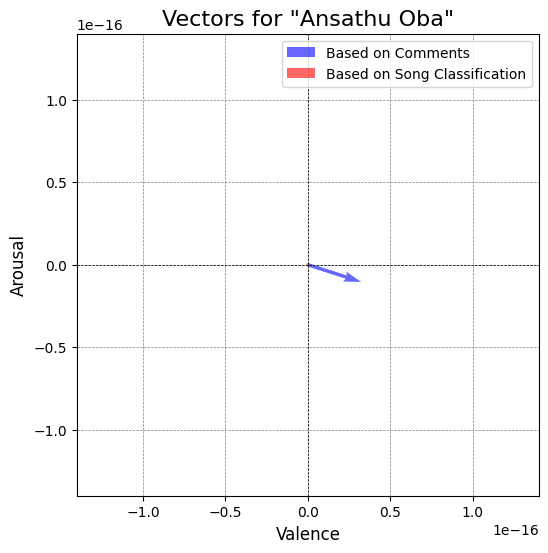

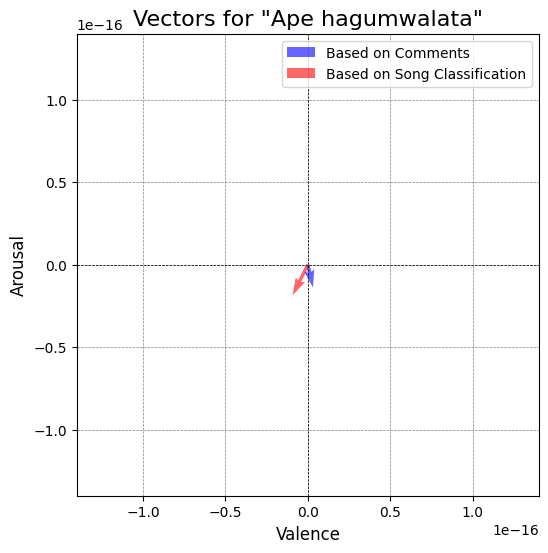

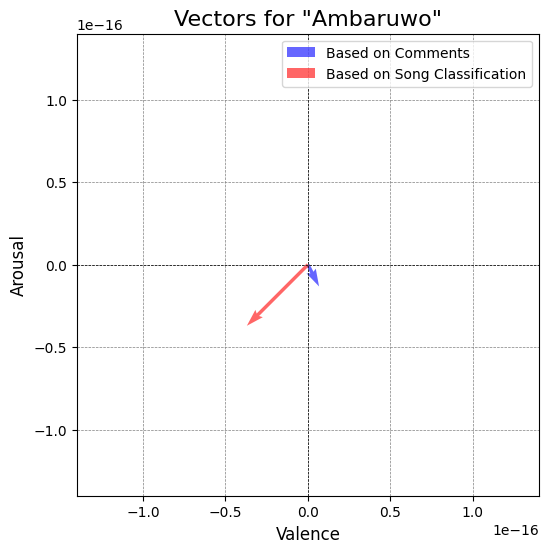

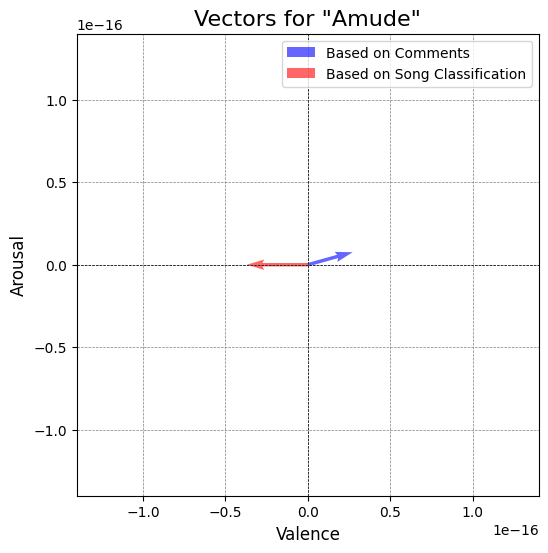

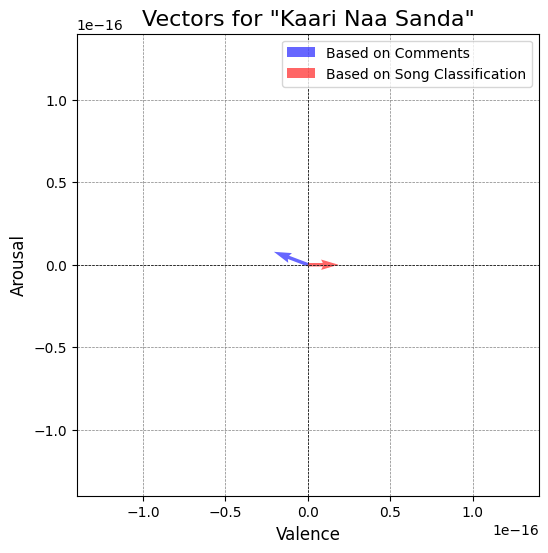

...

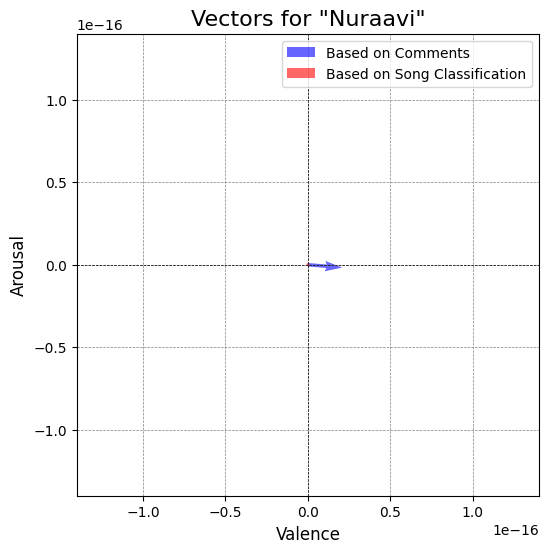

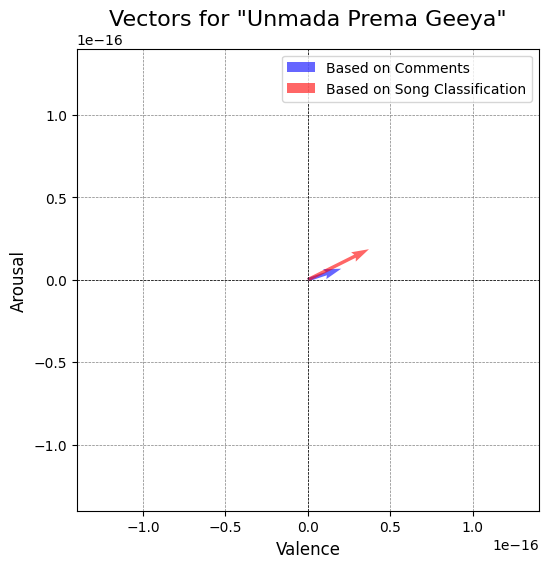

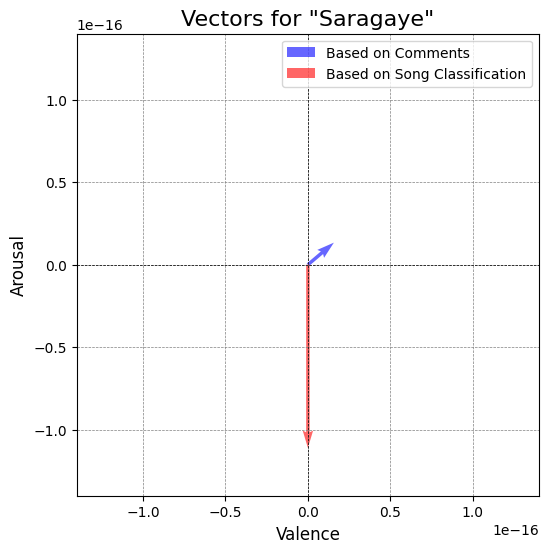

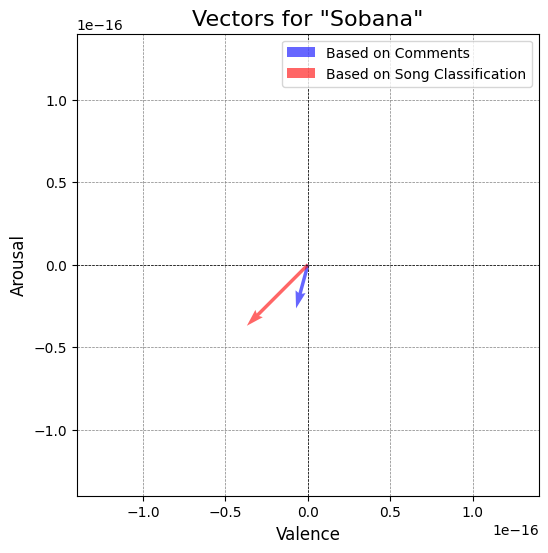

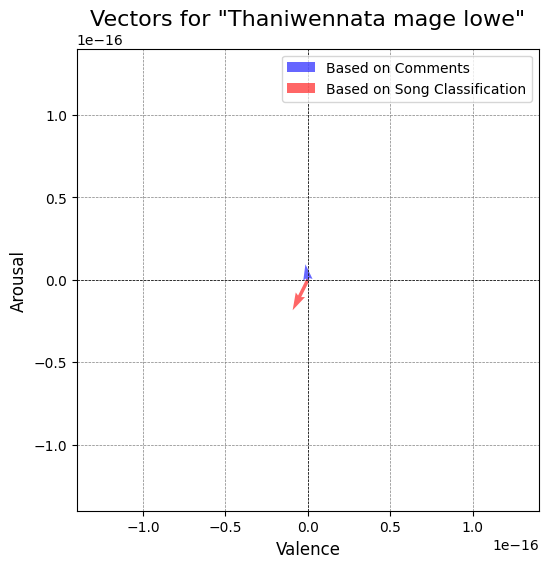

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate through each song in combined_df and create a plot
for index, row in combined_df.iterrows():
    song = row['Song']
    overall_vector = np.array([row['Overall_Valence'], row['Overall_Arousal']])
    centroid_vector = np.array([row['Mean_Std_Valence'], row['Mean_Std_Arousal']])

    # Create a new figure for each song
    plt.figure(figsize=(8, 6))

    # Plot the overall vector
    plt.quiver(0, 0, overall_vector[0], overall_vector[1],
               angles='xy', scale_units='xy', scale=1, color='blue', alpha=0.6, label='Based on Comments')

    # Plot the centroid vector
    plt.quiver(0, 0, centroid_vector[0], centroid_vector[1],
               angles='xy', scale_units='xy', scale=1, color='red', alpha=0.6, label='Based on Song Classification')

    # Set limits for better visualization
    plt.xlim(-1.4E-16, 1.4E-16)
    plt.ylim(-1.4E-16, 1.4E-16)

    # Add grid, labels, and title
    plt.axhline(0, color='black', linewidth=0.5, ls='--')
    plt.axvline(0, color='black', linewidth=0.5, ls='--')
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.title(f'Vectors for "{song}"', fontsize=16)
    plt.xlabel('Valence', fontsize=12)
    plt.ylabel('Arousal', fontsize=12)
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')  # Equal aspect ratio ensures correct scaling

    # Show the plot
    plt.show()

In [ ]:
import numpy as np

# Function to calculate cosine similarity
def calculate_cosine_similarity(v1, a1, v2, a2):
    dot_product = v1 * v2 + a1 * a2
    magnitude_1 = np.sqrt(v1**2 + a1**2)
    magnitude_2 = np.sqrt(v2**2 + a2**2)

    if magnitude_1 == 0 or magnitude_2 == 0:
        return 0  # To handle division by zero, treat it as no similarity
    return dot_product / (magnitude_1 * magnitude_2)

# Calculate cosine similarity for each song and add as a new column
combined_df['Cosine_Similarity'] = combined_df.apply(
    lambda row: calculate_cosine_similarity(
        row['Overall_Valence'], row['Overall_Arousal'], row['Mean_Std_Valence'], row['Mean_Std_Arousal']
    ), axis=1
)

# Print the cosine similarity for each song
print(combined_df[['Song', 'Cosine_Similarity']])




                        Song  Cosine_Similarity
0                Ansathu Oba           0.000000
1            Ape hagumwalata           0.776114
2                   Ambaruwo           0.305726
3                      Amude          -0.963196
4            Kaari Naa Sanda          -0.934919
5          Danena Thuru Maa            0.341743
6   Dannawada Adare Neethiya          -0.800000
7       Ehema dewal na hithe           0.475517
8                   Komaliya           0.000000
9                     Mohini          -0.983090
10     Kaluwarata Hitha Baya           0.408063
11    Ma sadata kamathi bawa           0.000000
12                  Piyanani          -0.351123
13               Salli Salli          -0.718568
14               Perawadanak           0.000000
15                   Nuraavi           0.000000
16        Unmada Prema Geeya           0.989567
17                  Saragaye          -0.647648
18                    Sobana           0.867786
19    Thaniwennata mage lowe          -0

In [ ]:
import pandas as pd
import numpy as np

# Example DataFrame (replace with your actual DataFrame)
# song_classification = pd.read_csv('your_file.csv')

# Calculate the mean of valence values across the judges for each song
valence_mean = song_classification[[f'Judge 01_Valence', f'Judge 02_Valence', f'Judge 03_Valence']].mean(axis=1)

# Calculate the mean of arousal values across the judges for each song
arousal_mean = song_classification[[f'Judge 01_Arousal', f'Judge 02_Arousal', f'Judge 03_Arousal']].mean(axis=1)

# Compute the difference between actual valence and mean valence for each judge
valence_diff = song_classification[[f'Judge 01_Valence', f'Judge 02_Valence', f'Judge 03_Valence']].sub(valence_mean, axis=0)

# Compute the difference between actual arousal and mean arousal for each judge
arousal_diff = song_classification[[f'Judge 01_Arousal', f'Judge 02_Arousal', f'Judge 03_Arousal']].sub(arousal_mean, axis=0)

# Calculate the maximum absolute difference for valence and arousal
max_valence_diff = valence_diff.abs().max(axis=1)
max_arousal_diff = arousal_diff.abs().max(axis=1)

# Ensure that if the max difference is zero, it is set to 1
max_valence_diff = np.where(max_valence_diff == 0, 1, max_valence_diff)
max_arousal_diff = np.where(max_arousal_diff == 0, 1, max_arousal_diff)

# Standardize by dividing by the maximum absolute difference for valence and arousal
std_valence = valence_diff.div(max_valence_diff, axis=0)
std_arousal = arousal_diff.div(max_arousal_diff, axis=0)

# Compute the mean standardized valence and arousal for each song
song_classification['Mean_Std_Valence'] = std_valence.mean(axis=1)
song_classification['Mean_Std_Arousal'] = std_arousal.mean(axis=1)

# Display the DataFrame with new standardized columns
print(song_classification[['Song','Mean_Std_Valence', 'Mean_Std_Arousal']])


                        Song  Mean_Std_Valence  Mean_Std_Arousal
0         Unmada Prema Geeya      1.665335e-16      1.850372e-17
1            Kaari Naa Sanda      2.775558e-16      0.000000e+00
2          Danena Thuru Maa       0.000000e+00      8.141636e-16
3                   Piyanani      2.775558e-16      0.000000e+00
4                Salli Salli      2.960595e-16      2.775558e-16
5                   Saragaye      0.000000e+00     -1.000000e+00
6                Perawadanak      0.000000e+00      0.000000e+00
7                Ansathu Oba      0.000000e+00      0.000000e+00
8   Dannawada Adare Neethiya      0.000000e+00      4.070818e-16
9                   Komaliya      0.000000e+00      0.000000e+00
10                    Mohini      0.000000e+00      1.480297e-16
11                   Nuraavi      0.000000e+00      0.000000e+00
12     Kaluwarata Hitha Baya      1.000000e+00     -1.000000e+00
13                    Sobana     -2.812565e-15     -1.480297e-16
14      Ehema dewal na hi

In [ ]:
combined_df = final_output.merge(song_classification, on='Song', how='left')
combined_df[['Song','Overall_Valence','Overall_Arousal','Mean_Std_Valence','Mean_Std_Arousal']]

,Song,Overall_Valence,Overall_Arousal,Mean_Std_Valence,Mean_Std_Arousal
0,Ansathu Oba,3.226303e-17,-1.041827e-17,0.000000e+00,0.000000e+00
1,Ape hagumwalata,3.060046e-18,-1.377021e-17,-7.401487e-17,-7.401487e-17
2,Ambaruwo,6.770210e-18,-1.317446e-17,-2.812565e-15,-1.480297e-16
3,Amude,2.712958e-17,7.571047e-18,-3.700743e-16,0.000000e+00
4,Kaari Naa Sanda,-2.062031e-17,7.826687e-18,2.775558e-16,0.000000e+00
5,Danena Thuru Maa,1.942459e-17,7.063488e-18,0.000000e+00,8.141636e-16
6,Dannawada Adare Neethiya,-4.126264e-18,-5.501686e-18,0.000000e+00,4.070818e-16
7,Ehema dewal na hithe,-3.104272e-17,-1.677985e-17,0.000000e+00,-1.000000e+00
8,Komaliya,-2.156620e-17,7.611599e-18,0.000000e+00,0.000000e+00
9,Mohini,2.133964e-18,-1.145602e-17,0.000000e+00,1.480297e-16


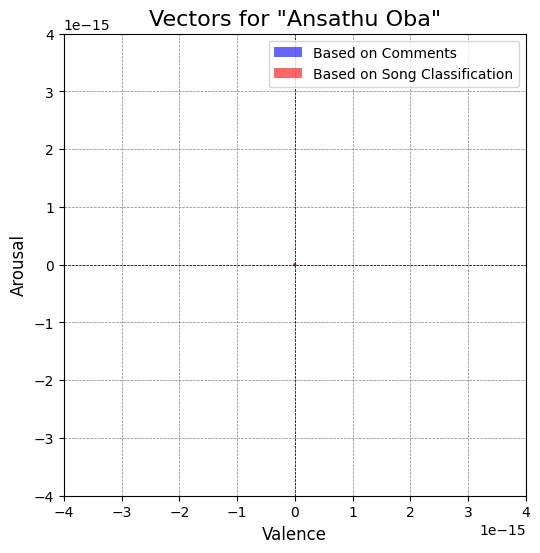

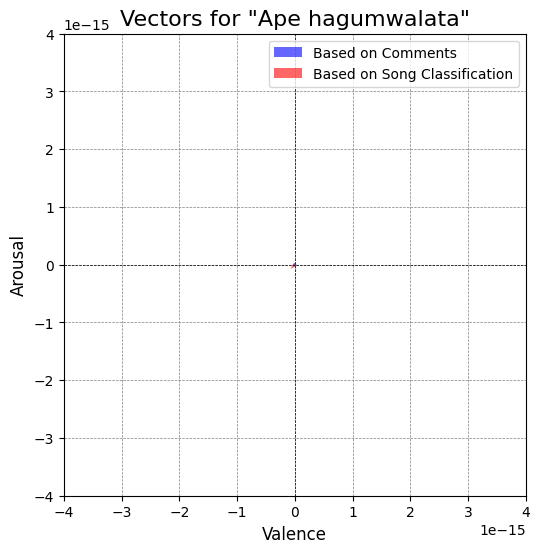

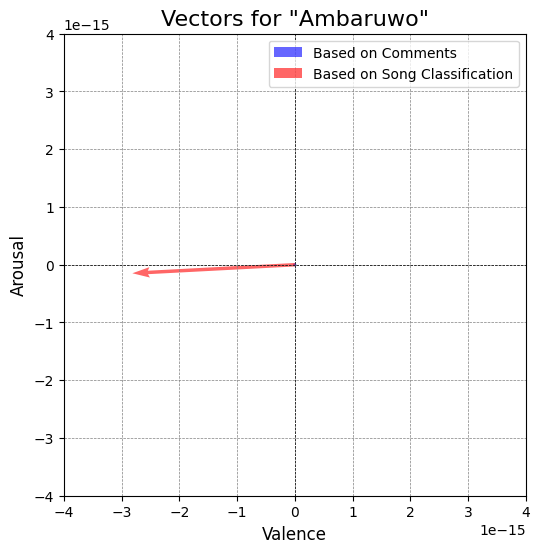

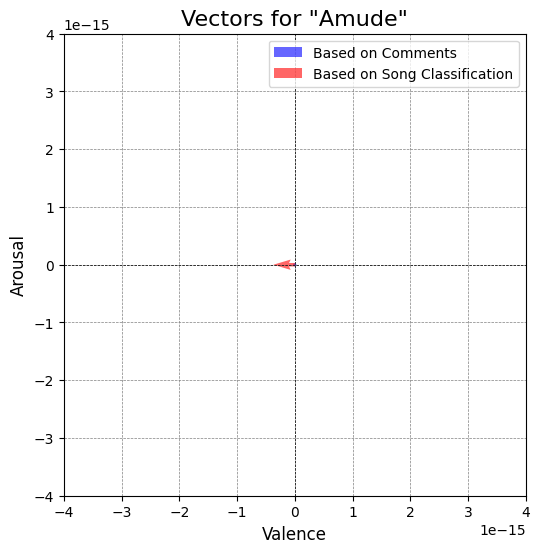

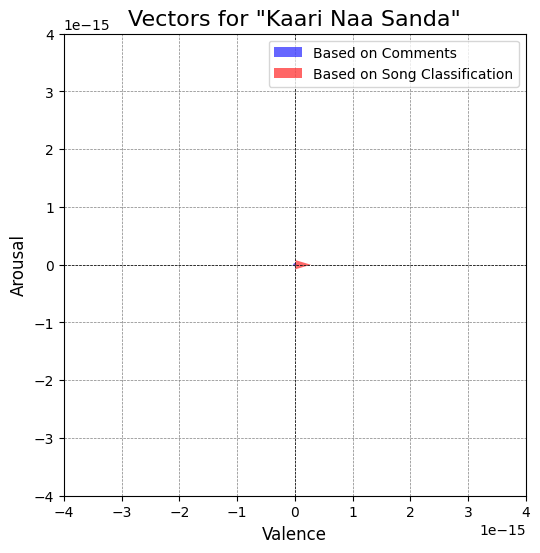

...

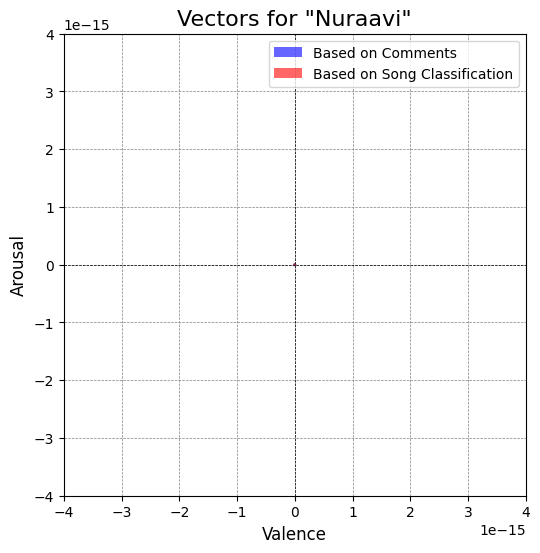

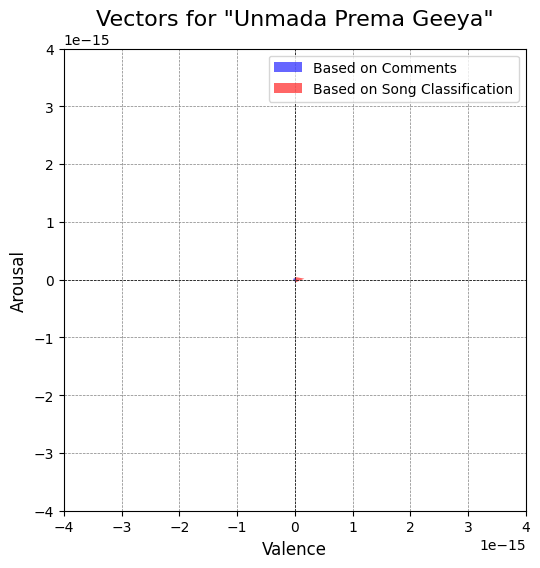

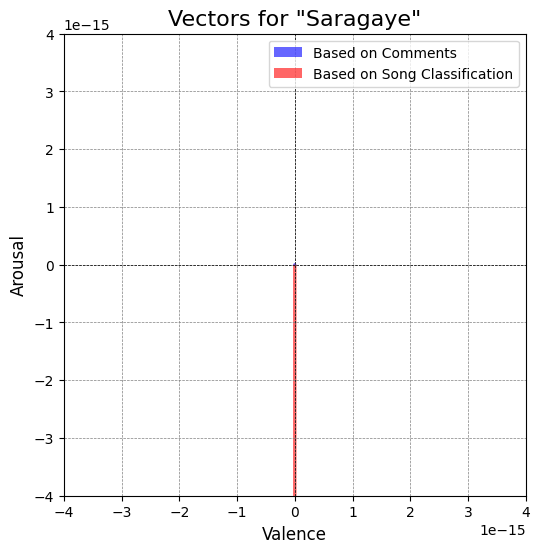

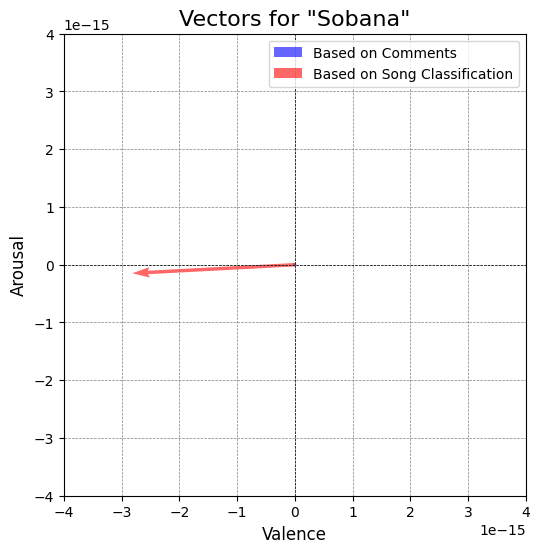

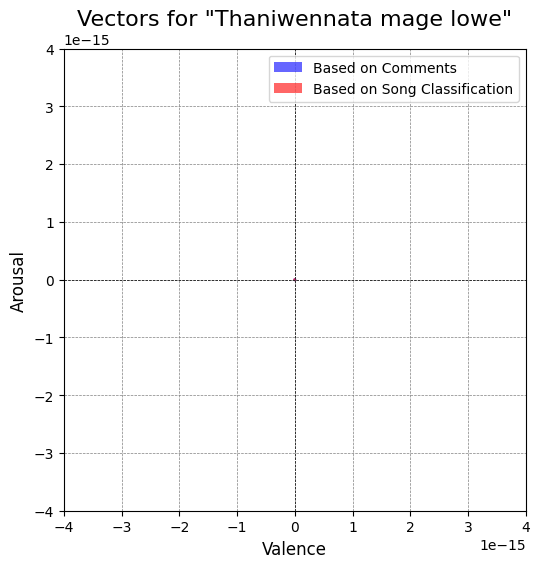

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate through each song in combined_df and create a plot
for index, row in combined_df.iterrows():
    song = row['Song']
    overall_vector = np.array([row['Overall_Valence'], row['Overall_Arousal']])
    centroid_vector = np.array([row['Mean_Std_Valence'], row['Mean_Std_Arousal']])

    # Create a new figure for each song
    plt.figure(figsize=(8, 6))

    # Plot the overall vector
    plt.quiver(0, 0, overall_vector[0], overall_vector[1],
               angles='xy', scale_units='xy', scale=1, color='blue', alpha=0.6, label='Based on Comments')

    # Plot the centroid vector
    plt.quiver(0, 0, centroid_vector[0], centroid_vector[1],
               angles='xy', scale_units='xy', scale=1, color='red', alpha=0.6, label='Based on Song Classification')

    # Set limits for better visualization
    plt.xlim(-4.0E-15, 4.0E-15)
    plt.ylim(-4.0E-15, 4.0E-15)

    # Add grid, labels, and title
    plt.axhline(0, color='black', linewidth=0.5, ls='--')
    plt.axvline(0, color='black', linewidth=0.5, ls='--')
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.title(f'Vectors for "{song}"', fontsize=16)
    plt.xlabel('Valence', fontsize=12)
    plt.ylabel('Arousal', fontsize=12)
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')  # Equal aspect ratio ensures correct scaling

    # Show the plot
    plt.show()

In [ ]:
import numpy as np

# Function to calculate cosine similarity
def calculate_cosine_similarity(v1, a1, v2, a2):
    dot_product = v1 * v2 + a1 * a2
    magnitude_1 = np.sqrt(v1**2 + a1**2)
    magnitude_2 = np.sqrt(v2**2 + a2**2)

    if magnitude_1 == 0 or magnitude_2 == 0:
        return 0  # To handle division by zero, treat it as no similarity
    return dot_product / (magnitude_1 * magnitude_2)

# Calculate cosine similarity for each song and add as a new column
combined_df['Cosine_Similarity'] = combined_df.apply(
    lambda row: calculate_cosine_similarity(
        row['Overall_Valence'], row['Overall_Arousal'], row['Mean_Std_Valence'], row['Mean_Std_Arousal']
    ), axis=1
)

# Print the cosine similarity for each song
print(combined_df[['Song', 'Cosine_Similarity']])


                        Song  Cosine_Similarity
0                Ansathu Oba           0.000000
1            Ape hagumwalata           0.536875
2                   Ambaruwo          -0.409690
3                      Amude          -0.963196
4            Kaari Naa Sanda          -0.934919
5          Danena Thuru Maa            0.341743
6   Dannawada Adare Neethiya          -0.800000
7       Ehema dewal na hithe           0.475517
8                   Komaliya           0.000000
9                     Mohini          -0.983090
10     Kaluwarata Hitha Baya           0.098421
11    Ma sadata kamathi bawa           0.000000
12                  Piyanani          -0.351123
13               Salli Salli          -0.490129
14               Perawadanak           0.000000
15                   Nuraavi           0.000000
16        Unmada Prema Geeya           0.978361
17                  Saragaye          -0.647648
18                    Sobana           0.312587
19    Thaniwennata mage lowe          -0

## Other Emotion Models for **Sinhala**

In [ ]:
import pandas as pd

file_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged.csv'

# Load the CSV file into a DataFrame
tagged_data = pd.read_csv(file_path, delimiter=';')  # Adjust delimiter as needed


# Display the first few rows to verify
print(tagged_data.head())


    docid                                            comment     label
0  100204                              නියම සිංහල මහත්මයෙක්.  POSITIVE
1  100204                                   අන්න මිනිස්සු...  POSITIVE
2  100204  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි 50ක් පමණ ...  POSITIVE
3  100204  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...  POSITIVE
4  100204                                        අයියෝ සල්ලි  NEGATIVE


In [ ]:
output_file_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed.xlsx'

# Save the DataFrame to an Excel file
tagged_data.to_excel(output_file_path, index=False)

print(f"Data has been successfully saved to: {output_file_path}")

Data has been successfully saved to: /content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed.xlsx


In [ ]:
import pandas as pd
import re
import unicodedata

# Load the dataset
file_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed.xlsx'
data = pd.read_excel(file_path)

# Convert the 'comment' column to string
data['comment'] = data['comment'].astype(str)

# Define patterns for unwanted characters
english_pattern = re.compile(r'[a-zA-Z]')
number_pattern = re.compile(r'[0-9]')
symbol_pattern = re.compile(r'[^\u0D80-\u0DFF\u200d]')  # Non-Sinhala characters except ZWJ

# Function to clean comments
def clean_comment(comment):
    words = comment.split()
    clean_words = []
    for word in words:
        unwanted = False
        for char in word:
            if (english_pattern.match(char) or
                number_pattern.match(char) or
                (symbol_pattern.match(char) and char != '\u200d')):
                unwanted = True
                break
        if not unwanted:
            # Normalize and keep the word
            clean_word = unicodedata.normalize('NFC', word)
            clean_words.append(clean_word)
    return ' '.join(clean_words)

# Apply the cleaning function
data['cleaned_comment'] = data['comment'].apply(clean_comment)


In [ ]:
output_file_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed_cleaned.xlsx'

# Save the DataFrame to an Excel file
data.to_excel(output_file_path, index=False)

print(f"Data has been successfully saved to: {output_file_path}")

Data has been successfully saved to: /content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed_cleaned.xlsx


In [ ]:
data

,docid,comment,label,cleaned_comment
0,100204,නියම සිංහල මහත්මයෙක්.,POSITIVE,නියම සිංහල
1,100204,අන්න මිනිස්සු...,POSITIVE,අන්න
2,100204,ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි 50ක් පමණ ...,POSITIVE,ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි පමණ ඒ මහත...
3,100204,වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...,POSITIVE,වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...
4,100204,අයියෝ සල්ලි,NEGATIVE,අයියෝ සල්ලි
...,...,...,...,...
4998,460747,මේවා දේශපාලන පළිගැනීම් නොවේද?,NEGATIVE,මේවා දේශපාලන පළිගැනීම්
4999,460747,"මේ ආණ්ඩුව යහපාලනයක්ද, යමපාලනයක්ද?? කෙරුවාව පළි...",NEGATIVE,මේ ආණ්ඩුව කෙරුවාව පළිගැනීම
5000,460747,දූෂණ වංචා සම්බන්ධයෙන් චෝදනා ලැබූ පසුගිය ආණ්‌ඩු...,NEGATIVE,දූෂණ වංචා සම්බන්ධයෙන් චෝදනා ලැබූ පසුගිය වගකිවය...
5001,460747,වැරදිකාරයන්ට දඬුවම් කරන්න ඕනෑ,NEGATIVE,වැරදිකාරයන්ට දඬුවම් කරන්න ඕනෑ


**Word2Vec Model**

In [ ]:
from gensim.models import Word2Vec

# Tokenize cleaned comments
tokenized_comments = data['cleaned_comment'].apply(lambda x: x.split())

# Train Word2Vec model
word2vec_model = Word2Vec(
    sentences=tokenized_comments,
    vector_size=300,  # Number of dimensions
    window=10,        # Window size
    min_count=1,      # Minimum word count
    sg=1,             # Skip-Gram model
    workers=4
)

# Function to get the average word vector for a comment
def get_average_word_vector(comment, model):
    words = comment.split()
    vectors = [model.wv[word] for word in words if word in model.wv]
    return sum(vectors) / len(vectors) if vectors else [0] * model.vector_size

# Apply Word2Vec embeddings
data['word2vec_vector'] = data['cleaned_comment'].apply(lambda x: get_average_word_vector(x, word2vec_model))


**fastText Model**

In [ ]:
from huggingface_hub import from_pretrained_keras

# Load pre-trained fastText model
fasttext_model = from_pretrained_keras("sinhala-nlp/lstm-olid-fasttext-en-sold-fasttext-si")

# Function to get the average word vector for a comment using fastText
def get_fasttext_vector(comment, model):
    words = comment.split()
    vectors = [model.get_word_vector(word) for word in words]
    return sum(vectors) / len(vectors) if vectors else [0] * 300

# Apply fastText embeddings
data['fasttext_vector'] = data['cleaned_comment'].apply(lambda x: get_fasttext_vector(x, fasttext_model))


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

README.md:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

model_args.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/1.43k [00:00<?, ?B/s]

keras_metadata.pb:   0%|          | 0.00/41.4k [00:00<?, ?B/s]

saved_model.pb:   0%|          | 0.00/6.03M [00:00<?, ?B/s]

FileNotFoundError: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for /root/.cache/huggingface/hub/models--sinhala-nlp--lstm-olid-fasttext-en-sold-fasttext-si/snapshots/ba127905122ebfae034978eab4955434887fe422/variables/variables
 You may be trying to load on a different device from the computational device. Consider setting the `experimental_io_device` option in `tf.saved_model.LoadOptions` to the io_device such as '/job:localhost'.

In [ ]:
!pip install fasttext


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 5.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.13.6-py3-none-any.whl.metadata (9.5 kB)
Using cached pybind11-2.13.6-py3-none-any.whl (243 kB)
  Created wheel for fasttext: filename=fasttext-0.9.3-cp310-cp310-linux_x86_64.whl size=4296228 sha256=849d49034b208a490c3f362a3228f0934d80afa922e5c0ddd668ffabdd423547
  Stored in directory: /root/.cache/pip/wheels/0d/a2/00/81db54d3e6a8199b829d58e02cec2ddb20ce3e59fad8d3c92a
Successfully built fasttext


In [ ]:
from huggingface_hub import hf_hub_download
import fasttext

try:
    fasttext_model = model = fasttext.load_model(hf_hub_download("facebook/fasttext-vi-vectors", "model.bin"))
    print("fastText model loaded successfully.")
except Exception as e:
    print(f"Failed to load the fastText model: {e}")
    raise


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.bin:   0%|          | 0.00/7.24G [00:00<?, ?B/s]

fastText model loaded successfully.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Load your dataset
data_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed.xlsx"
data = pd.read_excel(data_path)

# Preprocessing: Remove punctuations and numbers while keeping the zero-width joiner
import re
def clean_comment(comment):
    return re.sub(r'[^\w\s\u200D]', '', comment)  # Removes all non-word characters except zero-width joiner

data['cleaned_comment'] = data['comment'].apply(clean_comment)

# Function to calculate the average word vector for a comment using fastText
def get_fasttext_vector(comment, model):
    words = comment.split()
    vectors = [model.get_word_vector(word) for word in words]
    return sum(vectors) / len(vectors) if vectors else [0] * 300

# Apply fastText embeddings
data['fasttext_vector'] = data['cleaned_comment'].apply(lambda x: get_fasttext_vector(x, fasttext_model))

# Split the data into train and test sets
X = list(data['fasttext_vector'])
y = data['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Logistic Regression classifier
classifier = LogisticRegression(max_iter=1000)
classifier.fit(X_train, y_train)

# Evaluate the model
y_pred = classifier.predict(X_test)
print("Classification Report:\n")
print(classification_report(y_test, y_pred))


Classification Report:

              precision    recall  f1-score   support

    NEGATIVE       0.60      0.83      0.69       509
    POSITIVE       0.70      0.42      0.53       492

    accuracy                           0.63      1001
   macro avg       0.65      0.62      0.61      1001
weighted avg       0.65      0.63      0.61      1001



**SinBERT**

In [ ]:
from transformers import AutoTokenizer, AutoModel
import torch

# Load SinBERT model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("NLPC-UOM/SinBERT-large")
model = AutoModel.from_pretrained("NLPC-UOM/SinBERT-large")  # Use AutoModel for embeddings

# Function to get the average word vector for a comment using SinBERT
def get_sinbert_vector(comment, tokenizer, model):
    # Tokenize the comment
    inputs = tokenizer(comment, return_tensors="pt", truncation=True, padding=True, max_length=512)

    # Pass through the model
    with torch.no_grad():
        outputs = model(**inputs)

    # Extract hidden states from the last layer
    hidden_states = outputs.last_hidden_state  # AutoModel provides this attribute

    # Compute the average of word vectors (excluding padding tokens)
    mask = inputs["attention_mask"].unsqueeze(-1).expand(hidden_states.size())
    sum_hidden_states = torch.sum(hidden_states * mask, dim=1)
    sum_mask = torch.sum(mask, dim=1)
    avg_hidden_states = sum_hidden_states / sum_mask

    return avg_hidden_states.squeeze().tolist()

# Apply SinBERT embeddings
data['sinbert_vector'] = data['cleaned_comment'].apply(lambda x: get_sinbert_vector(x, tokenizer, model))


Some weights of RobertaModel were not initialized from the model checkpoint at NLPC-UOM/SinBERT-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Split the data into train and test sets
X_word2vec = list(data['word2vec_vector'])
X_fasttext = list(data['fasttext_vector'])
y = data['label']

X_train_w2v, X_test_w2v, y_train, y_test = train_test_split(X_word2vec, y, test_size=0.2, random_state=42)
X_train_ft, X_test_ft, _, _ = train_test_split(X_fasttext, y, test_size=0.2, random_state=42)

# Train a Logistic Regression model
lr_w2v = LogisticRegression(max_iter=1000).fit(X_train_w2v, y_train)
lr_ft = LogisticRegression(max_iter=1000).fit(X_train_ft, y_train)

# Evaluate Word2Vec model
pred_w2v = lr_w2v.predict(X_test_w2v)
print("Word2Vec Model Performance")
print(classification_report(y_test, pred_w2v))

# Evaluate fastText model
pred_ft = lr_ft.predict(X_test_ft)
print("fastText Model Performance")
print(classification_report(y_test, pred_ft))


KeyError: 'fasttext_vector'

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import numpy as np

# Ensure vectors are numpy arrays
data['word2vec_vector'] = data['word2vec_vector'].apply(np.array)
data['sinbert_vector'] = data['sinbert_vector'].apply(np.array)

# Split the data into features (X) and labels (y)
X_word2vec = np.array(data['word2vec_vector'].tolist())
X_sinbert = np.array(data['sinbert_vector'].tolist())
y = data['label']

# Split the data into train and test sets
X_train_w2v, X_test_w2v, y_train, y_test = train_test_split(X_word2vec, y, test_size=0.2, random_state=42)
X_train_sb, X_test_sb, _, _ = train_test_split(X_sinbert, y, test_size=0.2, random_state=42)

# Train a Logistic Regression model on Word2Vec features
lr_w2v = LogisticRegression(max_iter=1000)
lr_w2v.fit(X_train_w2v, y_train)

# Train a Logistic Regression model on SinBERT features
lr_sb = LogisticRegression(max_iter=1000)
lr_sb.fit(X_train_sb, y_train)

# Evaluate Word2Vec model
pred_w2v = lr_w2v.predict(X_test_w2v)
print("Word2Vec Model Performance")
print(classification_report(y_test, pred_w2v))

# Evaluate SinBERT model
pred_sb = lr_sb.predict(X_test_sb)
print("SinBERT Model Performance")
print(classification_report(y_test, pred_sb))


Word2Vec Model Performance
              precision    recall  f1-score   support

    NEGATIVE       0.66      0.80      0.72       509
    POSITIVE       0.74      0.57      0.64       492

    accuracy                           0.69      1001
   macro avg       0.70      0.69      0.68      1001
weighted avg       0.70      0.69      0.68      1001

SinBERT Model Performance
              precision    recall  f1-score   support

    NEGATIVE       0.79      0.85      0.82       509
    POSITIVE       0.83      0.77      0.80       492

    accuracy                           0.81      1001
   macro avg       0.81      0.81      0.81      1001
weighted avg       0.81      0.81      0.81      1001



In [ ]:
import os
import numpy as np
import pandas as pd
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from transformers import AutoTokenizer, AutoModel
import pickle
import torch

# Step 1: Ensure directory for saving models
save_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/tested_models'
os.makedirs(save_path, exist_ok=True)

# Step 2: Precompute embeddings and save them to the DataFrame

# Word2Vec Embeddings
print("Training Word2Vec model...")
tokenized_comments = data['cleaned_comment'].apply(lambda x: x.split())
word2vec_model = Word2Vec(
    sentences=tokenized_comments,
    vector_size=300,
    window=10,
    min_count=1,
    sg=1,
    workers=4
)
data['word2vec_vector'] = data['cleaned_comment'].apply(
    lambda x: np.mean([word2vec_model.wv[word] for word in x.split() if word in word2vec_model.wv], axis=0)
    if x else [0] * 300
)

# fastText Embeddings
print("Generating fastText embeddings...")
def get_fasttext_vector(comment, model):
    words = comment.split()
    vectors = [model.get_word_vector(word) for word in words]
    return np.mean(vectors, axis=0) if vectors else [0] * 300
data['fasttext_vector'] = data['cleaned_comment'].apply(lambda x: get_fasttext_vector(x, fasttext_model))

# SinBERT Embeddings
print("Generating SinBERT embeddings...")
tokenizer = AutoTokenizer.from_pretrained("NLPC-UOM/SinBERT-large")
sinbert_model = AutoModel.from_pretrained("NLPC-UOM/SinBERT-large")

def get_sinbert_vector(comment, tokenizer, model):
    inputs = tokenizer(comment, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    hidden_states = outputs.last_hidden_state
    mask = inputs["attention_mask"].unsqueeze(-1).expand(hidden_states.size())
    sum_hidden_states = torch.sum(hidden_states * mask, dim=1)
    sum_mask = torch.sum(mask, dim=1)
    avg_hidden_states = sum_hidden_states / sum_mask
    return avg_hidden_states.squeeze().tolist()

data['sinbert_vector'] = data['cleaned_comment'].apply(lambda x: get_sinbert_vector(x, tokenizer, sinbert_model))

# Step 3: Combine features into a single vector
print("Combining features...")
def combine_features(row):
    return np.hstack([
        np.array(row['word2vec_vector']),
        np.array(row['fasttext_vector']),
        np.array(row['sinbert_vector'])
    ])

data['combined_features'] = data.apply(combine_features, axis=1)

# Step 4: Split data into training and testing sets
X = np.vstack(data['combined_features'])
y = data['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: Define models and hyperparameters
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'DecisionTree': DecisionTreeClassifier(),
    'NaiveBayes': GaussianNB(),
    'SVM': SVC(),
    'RandomForest': RandomForestClassifier()
}

param_grids = {
    'LogisticRegression': {'C': [0.5, 1, 2, 4]},
    'DecisionTree': {'max_depth': [10, 20, 30], 'criterion': ['gini', 'entropy']},
    'SVM': {'kernel': ['linear', 'sigmoid'], 'C': [0.5, 1, 2, 4]},
    'RandomForest': {'n_estimators': [50, 100, 200], 'criterion': ['gini', 'entropy'], 'max_features': ['sqrt', 300]}
}

# Step 6: Train, evaluate, and save models
results = []
for model_name, model in models.items():
    print(f"Training {model_name}...")
    param_grid = param_grids.get(model_name, {})
    grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    # Save model
    model_save_path = os.path.join(save_path, f"{model_name}.pkl")
    with open(model_save_path, 'wb') as f:
        pickle.dump(best_model, f)

    # Collect results
    report = classification_report(y_test, y_pred, output_dict=True)
    accuracy = accuracy_score(y_test, y_pred)
    results.append({
        'Model': model_name,
        'Best Parameters': grid_search.best_params_,
        'Accuracy': accuracy,
        'Classification Report': report
    })

    print(f"Completed {model_name} with Accuracy: {accuracy}")

# Step 7: Identify the best model
best_model_result = max(results, key=lambda x: x['Accuracy'])

# Step 8: Save the results summary
results_df = pd.DataFrame(results)
results_df.to_csv(os.path.join(save_path, "model_results_summary.csv"), index=False)

# Step 9: Print the best model
print(f"Best Model: {best_model_result['Model']}")
print(f"Accuracy: {best_model_result['Accuracy']}")
print("Classification Report:")
print(best_model_result['Classification Report'])


Training Word2Vec model...
Generating fastText embeddings...
Generating SinBERT embeddings...


config.json:   0%|          | 0.00/722 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.50M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.15M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/504M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at NLPC-UOM/SinBERT-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Combining features...
Training LogisticRegression...
Completed LogisticRegression with Accuracy: 0.8221778221778222
Training DecisionTree...
Completed DecisionTree with Accuracy: 0.7392607392607392
Training NaiveBayes...
Completed NaiveBayes with Accuracy: 0.6803196803196803
Training SVM...
Completed SVM with Accuracy: 0.7922077922077922
Training RandomForest...
Completed RandomForest with Accuracy: 0.8011988011988012
Best Model: LogisticRegression
Accuracy: 0.8221778221778222
Classification Report:
{'NEGATIVE': {'precision': 0.8014571948998178, 'recall': 0.8644400785854617, 'f1-score': 0.831758034026465, 'support': 509.0}, 'POSITIVE': {'precision': 0.8473451327433629, 'recall': 0.7784552845528455, 'f1-score': 0.8114406779661016, 'support': 492.0}, 'accuracy': 0.8221778221778222, 'macro avg': {'precision': 0.8244011638215903, 'recall': 0.8214476815691536, 'f1-score': 0.8215993559962833, 'support': 1001.0}, 'weighted avg': {'precision': 0.8240115060077341, 'recall': 0.8221778221778222, 

In [ ]:
import os
import numpy as np
import pandas as pd
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
import pickle
import torch

In [ ]:
# Ensure save path for models and progress
save_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/tested_models'
os.makedirs(save_path, exist_ok=True)
progress_path = os.path.join(save_path, "progress_checkpoint.pkl")


In [ ]:
# Load progress checkpoint if available
if os.path.exists(progress_path):
    print("Resuming from the last checkpoint...")
    with open(progress_path, 'rb') as f:
        checkpoint = pickle.load(f)
    processed_embeddings = checkpoint['processed_embeddings']
    results = checkpoint['results']
else:
    print("Starting fresh...")
    processed_embeddings = []
    results = []

Resuming from the last checkpoint...


In [ ]:
# File path
csv_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/tested_models/data.csv'

# Check if the file exists
if os.path.exists(csv_path):
    # Load the CSV file into a DataFrame
    data = pd.read_csv(csv_path)
    print("File loaded successfully. Here's a preview:")
    print(data.head())  # Display the first few rows
else:
    print(f"The file does not exist at the specified path: {csv_path}")

File loaded successfully. Here's a preview:
    docid                                            comment     label  \
0  100204                              නියම සිංහල මහත්මයෙක්.  POSITIVE   
1  100204                                   අන්න මිනිස්සු...  POSITIVE   
2  100204  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි 50ක් පමණ ...  POSITIVE   
3  100204  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...  POSITIVE   
4  100204                                        අයියෝ සල්ලි  NEGATIVE   

                                     cleaned_comment  \
0                                         නියම සිංහල   
1                                               අන්න   
2  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි පමණ ඒ මහත...   
3  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...   
4                                        අයියෝ සල්ලි   

                                     word2vec_vector  \
0  [ 0.07701753  0.1212385   0.00962586  0.053487...   
1  [ 6.98012933e-02  1.15780443e-01  1.71447638e-...   
2  [ 0

In [ ]:
# Convert strings to NumPy arrays

import numpy as np

# Convert strings to NumPy arrays
data['word2vec_vector'] = data['word2vec_vector'].apply(
    lambda x: np.fromstring(x.strip("[]"), sep=" ")
)

data['fasttext_vector'] = data['fasttext_vector'].apply(
    lambda x: np.fromstring(x.strip("[]"), sep=" ")
)

data['sinbert_vector'] = data['sinbert_vector'].apply(
    lambda x: np.fromstring(x.strip("[]"), sep=" ")
)

data['sentence_embedding'] = data['sentence_embedding'].apply(
    lambda x: np.fromstring(x.strip("[]"), sep=" ")
)

In [ ]:
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'DecisionTree': DecisionTreeClassifier(),
    'NaiveBayes': GaussianNB(),
    'SVM': SVC(),
    'RandomForest': RandomForestClassifier(),
    'GradientBoosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(eval_metric='mlogloss', use_label_encoder=False)
}

param_grids = {
    'LogisticRegression': {'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
    'DecisionTree': {'max_depth': [10, 20, 30, None], 'criterion': ['gini', 'entropy'], 'min_samples_split': [2, 5, 10]},
    'SVM': {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 0.5, 1, 2, 4, 10]},
    'RandomForest': {
        #'n_estimators': [200, 500],
        'n_estimators': [50,100],
        'criterion': ['gini', 'entropy'],
        'max_features': ['sqrt', 'log2', None],
        'min_samples_split': [2, 5, 10],'n_jobs' : [-1]
    },
    'GradientBoosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10],
        'subsample': [0.8, 1.0]
    }
}

In [ ]:
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'DecisionTree': DecisionTreeClassifier(),
    'NaiveBayes': GaussianNB(),
    'SVM': SVC(),
    'RandomForest': RandomForestClassifier(),
    'GradientBoosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(eval_metric='mlogloss', use_label_encoder=False)
}

In [ ]:
models = {

    'LogisticRegression': LogisticRegression(max_iter=2000),

}

In [ ]:
from sklearn.preprocessing import LabelEncoder

for embedding in processed_embeddings:
  X = np.vstack(data[embedding])
  # Before splitting the data, encode the target labels
  label_encoder = LabelEncoder()
  y = label_encoder.fit_transform(data['label'])  # This will convert 'NEGATIVE', 'POSITIVE' to 0, 1

  # Now, the train_test_split and model training will use numeric labels
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

  # Continue with the rest of your training code
  for model_name, model in models.items():
    print(f"Training {model_name} with {embedding}...")
    param_grid = param_grids.get(model_name, {})
    grid_search = GridSearchCV(model, param_grid, cv=3, scoring='f1_weighted', n_jobs=-1, verbose=3)
    print(f"Hyperparameter grid: {grid_search}")
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    # Convert predictions back to original labels (if needed)
    y_pred_labels = label_encoder.inverse_transform(y_pred)

    # Save model
    model_save_path = os.path.join(save_path, f"{model_name}_{embedding}.pkl")
    with open(model_save_path, 'wb') as f:
        pickle.dump(best_model, f)

    # Collect results
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    results.append({
        'Embedding': embedding,
        'Classifier': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Best Parameters': grid_search.best_params_
    })

  # Save progress checkpoint
  with open(progress_path, 'wb') as f:
      pickle.dump({'processed_embeddings': processed_embeddings, 'results': results}, f)


Training LogisticRegression with word2vec_vector...
Hyperparameter grid: GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=2000), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
             scoring='f1_weighted', verbose=3)
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Training LogisticRegression with fasttext_vector...
Hyperparameter grid: GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=2000), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
             scoring='f1_weighted', verbose=3)
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Training LogisticRegression with sinbert_vector...
Hyperparameter grid: GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=2000), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
             scoring='f1_weighted', verbose=3)
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Training LogisticRegression with sentence_embeddin

In [ ]:
# Create a results DataFrame and save it
results_df = pd.DataFrame(results)
#pivot_table = results_df.pivot(index='Classifier', columns='Embedding', values=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
#pivot_table.to_csv(os.path.join(save_path, "results_summary_table.csv"))
results_df.to_csv(os.path.join(save_path, "detailed_results.csv"), index=False)

# Print the best model for each embedding type
for embedding in processed_embeddings:
    best_result = results_df[results_df['Embedding'] == embedding].sort_values(by='F1-Score', ascending=False).iloc[0]
    print(f"Best Model for {embedding}: {best_result['Classifier']}")
    print(f"F1-Score: {best_result['F1-Score']}")
    print(f"Best Parameters: {best_result['Best Parameters']}")

Best Model for word2vec_vector: RandomForest
F1-Score: 0.7659160974811587
Best Parameters: {'criterion': 'entropy', 'max_features': None, 'min_samples_split': 10, 'n_estimators': 500}
Best Model for fasttext_vector: SVM
F1-Score: 0.7303627361854456
Best Parameters: {'C': 4, 'kernel': 'rbf'}
Best Model for sinbert_vector: LogisticRegression
F1-Score: 0.8206397978189882
Best Parameters: {'C': 0.1}
Best Model for sentence_embedding: SVM
F1-Score: 0.6372897798600121
Best Parameters: {'C': 10, 'kernel': 'rbf'}


In [ ]:
for embedding in processed_embeddings:

    # Before splitting the data, encode the target labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data['label'])  # This will convert 'NEGATIVE', 'POSITIVE' to 0, 1
    X = np.vstack(data[embedding])
    # Now, the train_test_split and model training will use numeric labels
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Before splitting the data, encode the target labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data['label'])  # This will convert 'NEGATIVE', 'POSITIVE' to 0, 1
    print(f"Processing {embedding} embeddings...")
    X = np.vstack(data[embedding])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    for model_name, model in models.items():
        print(f"Training {model_name} with {embedding}...")
        #print(f"Hyperparameter grid: {param_grids}")
        param_grid = param_grids.get(model_name, {})
        grid_search = GridSearchCV(model, param_grid, cv=3, scoring='f1_weighted', n_jobs=-1,verbose=3)
        print(f"Hyperparameter grid: {grid_search}")
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)

        # Save model
        model_save_path = os.path.join(save_path, f"{model_name}_{embedding}.pkl")
        with open(model_save_path, 'wb') as f:
            pickle.dump(best_model, f)

        # Collect results
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        results.append({
            'Embedding': embedding,
            'Classifier': model_name,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-Score': f1,
            'Best Parameters': grid_search.best_params_
        })
    with open(progress_path, 'wb') as f:
        pickle.dump({'processed_embeddings': processed_embeddings, 'results': results}, f)

Processing word2vec_vector embeddings...
Training LogisticRegression with word2vec_vector...
Hyperparameter grid: GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=2000), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
             scoring='f1_weighted', verbose=3)
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Processing fasttext_vector embeddings...
Training LogisticRegression with fasttext_vector...
Hyperparameter grid: GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=2000), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
             scoring='f1_weighted', verbose=3)
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Processing sinbert_vector embeddings...
Training LogisticRegression with sinbert_vector...
Hyperparameter grid: GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=2000), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
             scoring='f1_weighted',

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import os
import pickle

# Define the deep learning model
def create_model(input_dim, output_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim,)),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(output_dim, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Iterate over embeddings
for embedding in processed_embeddings:
    X = np.vstack(data[embedding])

    # Encode labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data['label'])  # Convert labels to numeric values

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Get input and output dimensions
    input_dim = X_train.shape[1]
    output_dim = len(label_encoder.classes_)

    # Create and train the model
    print(f"Training deep learning model with {embedding} embeddings...")
    model = create_model(input_dim, output_dim)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=10,
        batch_size=32,
        verbose=1
    )

    # Save the model
    model_save_path = os.path.join(save_path, f"deep_learning_model_{embedding}.h5")
    model.save(model_save_path)

    # Evaluate the model
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Collect results
    accuracy = accuracy_score(y_test, y_pred_classes)
    precision = precision_score(y_test, y_pred_classes, average='weighted')
    recall = recall_score(y_test, y_pred_classes, average='weighted')
    f1 = f1_score(y_test, y_pred_classes, average='weighted')

    results.append({
        'Embedding': embedding,
        'Classifier': 'Deep Learning Model',
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Best Parameters': 'N/A'  # Hyperparameters are fixed in this example
    })

    # Save progress checkpoint
    with open(progress_path, 'wb') as f:
        pickle.dump({'processed_embeddings': processed_embeddings, 'results': results}, f)


Training deep learning model with word2vec_vector embeddings...
Epoch 1/10
126/126 [==============================] - 3s 7ms/step - loss: 0.6713 - accuracy: 0.5685 - val_loss: 0.6276 - val_accuracy: 0.6593
Epoch 2/10
126/126 [==============================] - 1s 4ms/step - loss: 0.6215 - accuracy: 0.6454 - val_loss: 0.6063 - val_accuracy: 0.6623
Epoch 3/10
126/126 [==============================] - 1s 5ms/step - loss: 0.6017 - accuracy: 0.6649 - val_loss: 0.5997 - val_accuracy: 0.6643
Epoch 4/10
126/126 [==============================] - 1s 5ms/step - loss: 0.5927 - accuracy: 0.6699 - val_loss: 0.5978 - val_accuracy: 0.6693
Epoch 5/10
126/126 [==============================] - 1s 4ms/step - loss: 0.5947 - accuracy: 0.6682 - val_loss: 0.5984 - val_accuracy: 0.6733
Epoch 6/10
126/126 [==============================] - 1s 6ms/step - loss: 0.5896 - accuracy: 0.6724 - val_loss: 0.5963 - val_accuracy: 0.6783
Epoch 7/10
126/126 [==============================] - 1s 5ms/step - loss: 0.5849 - a

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


32/32 [==============================] - 0s 3ms/step
Training deep learning model with fasttext_vector embeddings...
Epoch 1/10
126/126 [==============================] - 2s 7ms/step - loss: 0.6837 - accuracy: 0.5662 - val_loss: 0.6531 - val_accuracy: 0.6653
Epoch 2/10
126/126 [==============================] - 2s 13ms/step - loss: 0.6484 - accuracy: 0.6364 - val_loss: 0.6124 - val_accuracy: 0.6773
Epoch 3/10
126/126 [==============================] - 1s 8ms/step - loss: 0.6096 - accuracy: 0.6687 - val_loss: 0.5742 - val_accuracy: 0.7173
Epoch 4/10
126/126 [==============================] - 1s 8ms/step - loss: 0.5820 - accuracy: 0.7036 - val_loss: 0.5628 - val_accuracy: 0.7253
Epoch 5/10
126/126 [==============================] - 1s 8ms/step - loss: 0.5625 - accuracy: 0.7111 - val_loss: 0.5596 - val_accuracy: 0.7173
Epoch 6/10
126/126 [==============================] - 1s 8ms/step - loss: 0.5453 - accuracy: 0.7281 - val_loss: 0.5471 - val_accuracy: 0.7283
Epoch 7/10
126/126 [==========

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


32/32 [==============================] - 0s 3ms/step
Training deep learning model with sinbert_vector embeddings...
Epoch 1/10
126/126 [==============================] - 2s 6ms/step - loss: 0.5268 - accuracy: 0.7354 - val_loss: 0.4475 - val_accuracy: 0.7992
Epoch 2/10
126/126 [==============================] - 1s 5ms/step - loss: 0.4663 - accuracy: 0.7829 - val_loss: 0.4436 - val_accuracy: 0.8042
Epoch 3/10
126/126 [==============================] - 0s 4ms/step - loss: 0.4379 - accuracy: 0.8091 - val_loss: 0.4217 - val_accuracy: 0.8112
Epoch 4/10
126/126 [==============================] - 1s 4ms/step - loss: 0.4190 - accuracy: 0.8041 - val_loss: 0.4209 - val_accuracy: 0.8082
Epoch 5/10
126/126 [==============================] - 0s 4ms/step - loss: 0.4162 - accuracy: 0.8138 - val_loss: 0.4318 - val_accuracy: 0.7962
Epoch 6/10
126/126 [==============================] - 1s 4ms/step - loss: 0.4052 - accuracy: 0.8083 - val_loss: 0.4121 - val_accuracy: 0.8072
Epoch 7/10
126/126 [============

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Training deep learning model with sentence_embedding embeddings...
Epoch 1/10
126/126 [==============================] - 2s 7ms/step - loss: 0.6697 - accuracy: 0.6009 - val_loss: 0.6569 - val_accuracy: 0.6244
Epoch 2/10
126/126 [==============================] - 1s 5ms/step - loss: 0.6663 - accuracy: 0.5937 - val_loss: 0.6563 - val_accuracy: 0.6344
Epoch 3/10
126/126 [==============================] - 1s 4ms/step - loss: 0.6596 - accuracy: 0.6074 - val_loss: 0.6562 - val_accuracy: 0.6374
Epoch 4/10
126/126 [==============================] - 1s 5ms/step - loss: 0.6619 - accuracy: 0.6024 - val_loss: 0.6585 - val_accuracy: 0.6384
Epoch 5/10
126/126 [==============================] - 1s 5ms/step - loss: 0.6611 - accuracy: 0.6014 - val_loss: 0.6555 - val_accuracy: 0.6224
Epoch 6/10
126/126 [==============================] - 1s 5ms/step - loss: 0.6579 - accuracy: 0.6112 - val_loss: 0.6536 - val_accuracy: 0.6324
Epoch 7/10
126/126 [==============================] - 1s 5ms/step - loss: 0.6583 

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


32/32 [==============================] - 0s 2ms/step


In [ ]:
results

[{'Embedding': 'word2vec_vector',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.7432567432567433,
  'Precision': 0.7549192996487891,
  'Recall': 0.7432567432567433,
  'F1-Score': 0.7395557030029649,
  'Best Parameters': {'C': 10}},
 {'Embedding': 'fasttext_vector',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.6953046953046953,
  'Precision': 0.697619769411197,
  'Recall': 0.6953046953046953,
  'F1-Score': 0.6938490114879312,
  'Best Parameters': {'C': 10}},
 {'Embedding': 'sinbert_vector',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.8211788211788211,
  'Precision': 0.823757614142385,
  'Recall': 0.8211788211788211,
  'F1-Score': 0.8206397978189882,
  'Best Parameters': {'C': 0.1}},
 {'Embedding': 'sentence_embedding',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.6413586413586414,
  'Precision': 0.6461136029707578,
  'Recall': 0.6413586413586414,
  'F1-Score': 0.6370327763579504,
  'Best Parameters': {'C': 2}},
 {'Embedding': 'word2vec_vector',
  'Cla

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np
import os
import pickle

# Define the improved deep learning model
def create_model(input_dim, output_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim,)),
        tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(output_dim, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Callbacks for better training
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)

# Iterate over embeddings
for embedding in processed_embeddings:
    X = np.vstack(data[embedding])
    X = tf.keras.utils.normalize(X, axis=1)  # Normalize embeddings for better convergence

    # Encode labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data['label'])  # Convert labels to numeric values

    # Split the data with stratification
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    # Get input and output dimensions
    input_dim = X_train.shape[1]
    output_dim = len(label_encoder.classes_)

    # Create and train the model
    print(f"Training improved deep learning model with {embedding} embeddings...")
    model = create_model(input_dim, output_dim)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=50,  # Increase epochs for better training
        batch_size=32,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    # Save the model
    model_save_path = os.path.join(save_path, f"improved_deep_learning_model_{embedding}.h5")
    model.save(model_save_path)

    # Evaluate the model
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Collect results
    accuracy = accuracy_score(y_test, y_pred_classes)
    precision = precision_score(y_test, y_pred_classes, average='weighted')
    recall = recall_score(y_test, y_pred_classes, average='weighted')
    f1 = f1_score(y_test, y_pred_classes, average='weighted')

    results.append({
        'Embedding': embedding,
        'Classifier': 'Improved Deep Learning Model',
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Best Parameters': 'N/A'  # Hyperparameters are fixed in this example
    })

    # Save progress checkpoint
    with open(progress_path, 'wb') as f:
        pickle.dump({'processed_embeddings': processed_embeddings, 'results': results}, f)

    # Visualize training
    print(f"Model training for {embedding} completed. Results:")
    print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")


Training improved deep learning model with word2vec_vector embeddings...
Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 13s 18ms/step - accuracy: 0.6257 - loss: 1.1926 - val_accuracy: 0.4975 - val_loss: 1.0402 - learning_rate: 0.0010
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6815 - loss: 0.9786 - val_accuracy: 0.4975 - val_loss: 0.9987 - learning_rate: 0.0010
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7172 - loss: 0.8898 - val_accuracy: 0.6364 - val_loss: 0.8997 - learning_rate: 0.0010
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7288 - loss: 0.8490 - val_accuracy: 0.7682 - val_loss: 0.8253 - learning_rate: 0.0010
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7311 - loss: 0.8034 - val_accuracy: 0.5115 - val_loss: 1.0085 - learning_rate: 0.0010
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7263 - loss: 0.7748 - val_accuracy: 0.7782 - val_loss: 0.7576 - learning_rate: 0.0010
Epoch 7/50
12

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Model training for word2vec_vector completed. Results:
Accuracy: 0.7652347652347652, Precision: 0.7676881638099805, Recall: 0.7652347652347652, F1-Score: 0.7646130075152631
Training improved deep learning model with fasttext_vector embeddings...
Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.5928 - loss: 1.3419 - val_accuracy: 0.6434 - val_loss: 1.1019 - learning_rate: 0.0010
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6698 - loss: 1.0838 - val_accuracy: 0.7043 - val_loss: 1.0611 - learning_rate: 0.0010
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7002 - loss: 1.0082 - val_accuracy: 0.7173 - val_loss: 0.9991 - learning_rate: 0.0010
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7444 - loss: 0.9242 - val_accuracy: 0.7153 - val_loss: 0.9479 - learning_rate: 0.0010
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7530 - loss: 0.8871 - val_accuracy: 0.733

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model training for fasttext_vector completed. Results:
Accuracy: 0.6433566433566433, Precision: 0.7426751502570162, Recall: 0.6433566433566433, F1-Score: 0.6016906178473624
Training improved deep learning model with sinbert_vector embeddings...
Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7180 - loss: 1.2294 - val_accuracy: 0.7832 - val_loss: 1.1210 - learning_rate: 0.0010
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7900 - loss: 0.9445 - val_accuracy: 0.8122 - val_loss: 1.0108 - learning_rate: 0.0010
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.8258 - loss: 0.8375 - val_accuracy: 0.8132 - val_loss: 0.9126 - learning_rate: 0.0010
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8153 - loss: 0.8000 - val_accuracy: 0.7912 - val_loss: 0.8172 - learning_rate: 0.0010
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8229 - loss: 0.7669 - val_accuracy: 0.8

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model training for sinbert_vector completed. Results:
Accuracy: 0.7832167832167832, Precision: 0.8024662369675847, Recall: 0.7832167832167832, F1-Score: 0.7795257018222821
Training improved deep learning model with sentence_embedding embeddings...
Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.5419 - loss: 1.4139 - val_accuracy: 0.5105 - val_loss: 1.0847 - learning_rate: 0.0010
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5527 - loss: 1.1783 - val_accuracy: 0.6314 - val_loss: 1.0268 - learning_rate: 0.0010
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5681 - loss: 1.1097 - val_accuracy: 0.6204 - val_loss: 0.9849 - learning_rate: 0.0010
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5668 - loss: 1.0365 - val_accuracy: 0.6394 - val_loss: 0.9531 - learning_rate: 0.0010
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5696 - loss: 0.9723 - val_accuracy: 0.6

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model training for sentence_embedding completed. Results:
Accuracy: 0.5104895104895105, Precision: 0.7022968958387728, Recall: 0.5104895104895105, F1-Score: 0.355317125927125


In [ ]:
results

[{'Embedding': 'word2vec_vector',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.7432567432567433,
  'Precision': 0.7549192996487891,
  'Recall': 0.7432567432567433,
  'F1-Score': 0.7395557030029649,
  'Best Parameters': {'C': 10}},
 {'Embedding': 'fasttext_vector',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.6953046953046953,
  'Precision': 0.697619769411197,
  'Recall': 0.6953046953046953,
  'F1-Score': 0.6938490114879312,
  'Best Parameters': {'C': 10}},
 {'Embedding': 'sinbert_vector',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.8211788211788211,
  'Precision': 0.823757614142385,
  'Recall': 0.8211788211788211,
  'F1-Score': 0.8206397978189882,
  'Best Parameters': {'C': 0.1}},
 {'Embedding': 'sentence_embedding',
  'Classifier': 'LogisticRegression',
  'Accuracy': 0.6413586413586414,
  'Precision': 0.6461136029707578,
  'Recall': 0.6413586413586414,
  'F1-Score': 0.6370327763579504,
  'Best Parameters': {'C': 2}},
 {'Embedding': 'word2vec_vector',
  'Cla

In [ ]:
!pip install tensorflow


In [ ]:
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np
import os
import pickle

# Define dense model
def create_dense_model(input_dim, output_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim,)),
        tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(output_dim, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Define CNN-BiLSTM model
def create_cnn_bilstm_model(input_dim, output_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim, 1)),
        tf.keras.layers.Conv1D(filters=128, kernel_size=3, activation='relu', padding='same'),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True)),
        tf.keras.layers.GlobalMaxPooling1D(),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(output_dim, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)

# Iterate over embeddings
for embedding in processed_embeddings:
    X = np.vstack(data[embedding])
    X = tf.keras.utils.normalize(X, axis=1)  # Normalize embeddings

    # Encode labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data['label'])

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    # Dense model
    print(f"Training Dense model with {embedding} embeddings...")
    dense_model = create_dense_model(input_dim=X_train.shape[1], output_dim=len(label_encoder.classes_))
    dense_history = dense_model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=100,
        batch_size=64,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    # Evaluate Dense model
    y_pred_dense = np.argmax(dense_model.predict(X_test), axis=1)
    dense_results = {
        'Embedding': embedding,
        'Classifier': 'Dense Model',
        'Accuracy': accuracy_score(y_test, y_pred_dense),
        'Precision': precision_score(y_test, y_pred_dense, average='weighted'),
        'Recall': recall_score(y_test, y_pred_dense, average='weighted'),
        'F1-Score': f1_score(y_test, y_pred_dense, average='weighted')
    }

    # Reshape data for CNN-BiLSTM
    X_train_reshaped = np.expand_dims(X_train, axis=-1)
    X_test_reshaped = np.expand_dims(X_test, axis=-1)

    # CNN-BiLSTM model
    print(f"Training CNN-BiLSTM model with {embedding} embeddings...")
    cnn_bilstm_model = create_cnn_bilstm_model(input_dim=X_train_reshaped.shape[1], output_dim=len(label_encoder.classes_))
    cnn_bilstm_history = cnn_bilstm_model.fit(
        X_train_reshaped, y_train,
        validation_data=(X_test_reshaped, y_test),
        epochs=100,
        batch_size=64,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    # Evaluate CNN-BiLSTM model
    y_pred_cnn_bilstm = np.argmax(cnn_bilstm_model.predict(X_test_reshaped), axis=1)
    cnn_bilstm_results = {
        'Embedding': embedding,
        'Classifier': 'CNN-BiLSTM Model',
        'Accuracy': accuracy_score(y_test, y_pred_cnn_bilstm),
        'Precision': precision_score(y_test, y_pred_cnn_bilstm, average='weighted'),
        'Recall': recall_score(y_test, y_pred_cnn_bilstm, average='weighted'),
        'F1-Score': f1_score(y_test, y_pred_cnn_bilstm, average='weighted')
    }

    # Save models and results
    save_path_dense = os.path.join(save_path, f"dense_model_{embedding}.h5")
    dense_model.save(save_path_dense)

    save_path_cnn_bilstm = os.path.join(save_path, f"cnn_bilstm_model_{embedding}.h5")
    cnn_bilstm_model.save(save_path_cnn_bilstm)

    # Append results
    results.extend([dense_results, cnn_bilstm_results])

    # Save progress checkpoint
    with open(progress_path, 'wb') as f:
        pickle.dump({'processed_embeddings': processed_embeddings, 'results': results}, f)

    print(f"Training completed for {embedding}. Results:")
    print(f"Dense Model: {dense_results}")
    print(f"CNN-BiLSTM Model: {cnn_bilstm_results}")


Training Dense model with word2vec embeddings...
Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.3565 - loss: 2.2197 - val_accuracy: 0.3550 - val_loss: 1.5360 - learning_rate: 0.0010
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.3824 - loss: 1.9322 - val_accuracy: 0.3650 - val_loss: 1.5252 - learning_rate: 0.0010
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.3953 - loss: 1.8210 - val_accuracy: 0.3650 - val_loss: 1.5199 - learning_rate: 0.0010
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4935 - loss: 1.5546 - val_accuracy: 0.3850 - val_loss: 1.5177 - learning_rate: 0.0010
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4707 - loss: 1.5871 - val_accuracy: 0.3250 - val_loss: 1.5193 - learning_rate: 0.0010
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5016 - loss: 1.5150 - val_accuracy: 0.3350 - val_loss: 1.5199 - learning_rate: 0.0010
Epoch 7/100
12/13 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 22s 990ms/step - accuracy: 0.2961 - loss: 1.2571 - val_accuracy: 0.3400 - val_loss: 1.2220 - learning_rate: 0.0010
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 15s 607ms/step - accuracy: 0.3515 - loss: 1.2122 - val_accuracy: 0.3400 - val_loss: 1.1866 - learning_rate: 0.0010
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 742ms/step - accuracy: 0.3394 - loss: 1.1804 - val_accuracy: 0.3400 - val_loss: 1.1604 - learning_rate: 0.0010
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 11s 823ms/step - accuracy: 0.3120 - loss: 1.1554 - val_accuracy: 0.3400 - val_loss: 1.1413 - learning_rate: 0.0010
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 8s 608ms/step - accuracy: 0.3398 - loss: 1.1372 - val_accuracy: 0.3400 - val_loss: 1.1278 - learning_rate: 0.0010
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 903ms/step - accuracy: 0.3633 - loss: 1.1249 - val_accuracy: 0.3400 - val_loss: 1.1183 - learning_rate: 0.0010
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 18s 748ms/step - accuracy: 0.3525 - lo

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training completed for word2vec. Results:
Dense Model: {'Embedding': 'word2vec', 'Classifier': 'Dense Model', 'Accuracy': 0.385, 'Precision': 0.2565551265551266, 'Recall': 0.385, 'F1-Score': 0.30387270282384576}
CNN-BiLSTM Model: {'Embedding': 'word2vec', 'Classifier': 'CNN-BiLSTM Model', 'Accuracy': 0.34, 'Precision': 0.11560000000000001, 'Recall': 0.34, 'F1-Score': 0.17253731343283582}
Training Dense model with fasttext embeddings...
Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.3436 - loss: 2.0722 - val_accuracy: 0.2950 - val_loss: 1.5325 - learning_rate: 0.0010
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4173 - loss: 1.8692 - val_accuracy: 0.3500 - val_loss: 1.5195 - learning_rate: 0.0010
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4315 - loss: 1.6972 - val_accuracy: 0.3400 - val_loss: 1.5130 - learning_rate: 0.0010
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4910 - loss: 1.5782 - val_accuracy: 0.34

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training completed for fasttext. Results:
Dense Model: {'Embedding': 'fasttext', 'Classifier': 'Dense Model', 'Accuracy': 0.295, 'Precision': 0.4806024096385542, 'Recall': 0.295, 'F1-Score': 0.19635164835164837}
CNN-BiLSTM Model: {'Embedding': 'fasttext', 'Classifier': 'CNN-BiLSTM Model', 'Accuracy': 0.34, 'Precision': 0.11560000000000001, 'Recall': 0.34, 'F1-Score': 0.17253731343283582}


In [ ]:
results


[{'Embedding': 'word2vec',
  'Classifier': 'Dense Model',
  'Accuracy': 0.325,
  'Precision': 0.4429145728643216,
  'Recall': 0.325,
  'F1-Score': 0.16559651733068825},
 {'Embedding': 'word2vec',
  'Classifier': 'CNN-BiLSTM Model',
  'Accuracy': 0.34,
  'Precision': 0.11560000000000001,
  'Recall': 0.34,
  'F1-Score': 0.17253731343283582},
 {'Embedding': 'fasttext',
  'Classifier': 'Dense Model',
  'Accuracy': 0.335,
  'Precision': 0.22617921146953407,
  'Recall': 0.335,
  'F1-Score': 0.24532428173111892},
 {'Embedding': 'fasttext',
  'Classifier': 'CNN-BiLSTM Model',
  'Accuracy': 0.34,
  'Precision': 0.11560000000000001,
  'Recall': 0.34,
  'F1-Score': 0.17253731343283582},
 {'Embedding': 'word2vec',
  'Classifier': 'Dense Model',
  'Accuracy': 0.385,
  'Precision': 0.2565551265551266,
  'Recall': 0.385,
  'F1-Score': 0.30387270282384576},
 {'Embedding': 'word2vec',
  'Classifier': 'CNN-BiLSTM Model',
  'Accuracy': 0.34,
  'Precision': 0.11560000000000001,
  'Recall': 0.34,
  'F1-Sco

In [ ]:
# Create a results DataFrame and save it
results_df = pd.DataFrame(results)
#pivot_table = results_df.pivot(index='Classifier', columns='Embedding', values=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
#pivot_table.to_csv(os.path.join(save_path, "results_summary_table.csv"))
results_df.to_csv(os.path.join(save_path, "detailed_results.csv"), index=False)

# Print the best model for each embedding type
for embedding in processed_embeddings:
    best_result = results_df[results_df['Embedding'] == embedding].sort_values(by='F1-Score', ascending=False).iloc[0]
    print(f"Best Model for {embedding}: {best_result['Classifier']}")
    print(f"F1-Score: {best_result['F1-Score']}")


Best Model for word2vec: Dense Model
F1-Score: 0.30387270282384576
Best Model for fasttext: Dense Model
F1-Score: 0.24532428173111892


In [ ]:
results_df

,Embedding,Classifier,Accuracy,Precision,Recall,F1-Score
0,word2vec,Dense Model,0.325,0.442915,0.325,0.165597
1,word2vec,CNN-BiLSTM Model,0.340,0.115600,0.340,0.172537
2,fasttext,Dense Model,0.335,0.226179,0.335,0.245324
3,fasttext,CNN-BiLSTM Model,0.340,0.115600,0.340,0.172537
4,word2vec,Dense Model,0.385,0.256555,0.385,0.303873
5,word2vec,CNN-BiLSTM Model,0.340,0.115600,0.340,0.172537
6,fasttext,Dense Model,0.295,0.480602,0.295,0.196352
7,fasttext,CNN-BiLSTM Model,0.340,0.115600,0.340,0.172537


In [ ]:
# Create a results DataFrame and save it
results_df = pd.DataFrame(results)
#pivot_table = results_df.pivot(index='Classifier', columns='Embedding', values=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
#pivot_table.to_csv(os.path.join(save_path, "results_summary_table.csv"))
results_df.to_csv(os.path.join(save_path, "detailed_results.csv"), index=False)

# Print the best model for each embedding type
for embedding in processed_embeddings:
    best_result = results_df[results_df['Embedding'] == embedding].sort_values(by='F1-Score', ascending=False).iloc[0]
    print(f"Best Model for {embedding}: {best_result['Classifier']}")
    print(f"F1-Score: {best_result['F1-Score']}")
    print(f"Best Parameters: {best_result['Best Parameters']}")

Best Model for word2vec: Dense Model
F1-Score: 0.30387270282384576


KeyError: 'Best Parameters'

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np
import os
import pickle

# Define the dense model
def create_dense_model(input_dim, output_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim,)),
        tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(output_dim, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Define the CNN-BiLSTM model
def create_cnn_bilstm_model(input_dim, output_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim, 1)),  # Adjusted input shape
        tf.keras.layers.Conv1D(filters=128, kernel_size=3, activation='relu', padding='same'),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True)),
        tf.keras.layers.GlobalMaxPooling1D(),  # Correctly handles 3D input
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(output_dim, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)

# Processed embeddings and data placeholders (replace with your data loading logic)
processed_embeddings = ["word2vec", "fasttext"]  # Example embeddings
data = {
    "word2vec": np.random.rand(1000, 300),  # Replace with actual embeddings
    "fasttext": np.random.rand(1000, 300),  # Replace with actual embeddings
    "label": np.random.choice(["positive", "negative", "neutral"], 1000)  # Replace with actual labels
}
results = []
save_path = "./models"  # Path to save models
progress_path = "./progress.pkl"

# Iterate over embeddings
for embedding in processed_embeddings:
    X = data[embedding]
    X = tf.keras.utils.normalize(X, axis=1)  # Normalize embeddings

    # Encode labels
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data["label"])

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    # Dense model
    print(f"Training Dense model with {embedding} embeddings...")
    dense_model = create_dense_model(input_dim=X_train.shape[1], output_dim=len(label_encoder.classes_))
    dense_history = dense_model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=50,
        batch_size=32,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    # Evaluate Dense model
    y_pred_dense = np.argmax(dense_model.predict(X_test), axis=1)
    dense_results = {
        "Embedding": embedding,
        "Classifier": "Dense Model",
        "Accuracy": accuracy_score(y_test, y_pred_dense),
        "Precision": precision_score(y_test, y_pred_dense, average="weighted"),
        "Recall": recall_score(y_test, y_pred_dense, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred_dense, average="weighted"),
    }

    # Reshape data for CNN-BiLSTM
    X_train_reshaped = np.expand_dims(X_train, axis=-1)  # Add channel dimension
    X_test_reshaped = np.expand_dims(X_test, axis=-1)

    # CNN-BiLSTM model
    print(f"Training CNN-BiLSTM model with {embedding} embeddings...")
    cnn_bilstm_model = create_cnn_bilstm_model(input_dim=X_train_reshaped.shape[1], output_dim=len(label_encoder.classes_))
    cnn_bilstm_history = cnn_bilstm_model.fit(
        X_train_reshaped, y_train,
        validation_data=(X_test_reshaped, y_test),
        epochs=50,
        batch_size=32,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    # Evaluate CNN-BiLSTM model
    y_pred_cnn_bilstm = np.argmax(cnn_bilstm_model.predict(X_test_reshaped), axis=1)
    cnn_bilstm_results = {
        "Embedding": embedding,
        "Classifier": "CNN-BiLSTM Model",
        "Accuracy": accuracy_score(y_test, y_pred_cnn_bilstm),
        "Precision": precision_score(y_test, y_pred_cnn_bilstm, average="weighted"),
        "Recall": recall_score(y_test, y_pred_cnn_bilstm, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred_cnn_bilstm, average="weighted"),
    }

    # Save models and results
    os.makedirs(save_path, exist_ok=True)
    save_path_dense = os.path.join(save_path, f"dense_model_{embedding}.h5")
    dense_model.save(save_path_dense)

    save_path_cnn_bilstm = os.path.join(save_path, f"cnn_bilstm_model_{embedding}.h5")
    cnn_bilstm_model.save(save_path_cnn_bilstm)

    # Append results
    results.extend([dense_results, cnn_bilstm_results])

    # Save progress checkpoint
    with open(progress_path, "wb") as f:
        pickle.dump({"processed_embeddings": processed_embeddings, "results": results}, f)

    print(f"Training completed for {embedding}. Results:")
    print(f"Dense Model: {dense_results}")
    print(f"CNN-BiLSTM Model: {cnn_bilstm_results}")


Training Dense model with word2vec embeddings...
Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.3395 - loss: 2.1759 - val_accuracy: 0.3100 - val_loss: 1.5333 - learning_rate: 0.0010
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.3847 - loss: 1.8381 - val_accuracy: 0.3250 - val_loss: 1.5260 - learning_rate: 0.0010
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4990 - loss: 1.5800 - val_accuracy: 0.3200 - val_loss: 1.5267 - learning_rate: 0.0010
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4927 - loss: 1.4510 - val_accuracy: 0.3250 - val_loss: 1.5271 - learning_rate: 0.0010
Epoch 5/50
21/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5416 - loss: 1.4142
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5409 - loss: 1.4122 - val_accuracy: 0.3200 - val_loss: 1.5335 - learning_rate: 0.0010
Epoch 6/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/s

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 573ms/step - accuracy: 0.2944 - loss: 1.2478 - val_accuracy: 0.3400 - val_loss: 1.1917 - learning_rate: 0.0010
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 503ms/step - accuracy: 0.3408 - loss: 1.1793 - val_accuracy: 0.3400 - val_loss: 1.1463 - learning_rate: 0.0010
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 541ms/step - accuracy: 0.3360 - loss: 1.1398 - val_accuracy: 0.3400 - val_loss: 1.1219 - learning_rate: 0.0010
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 466ms/step - accuracy: 0.3601 - loss: 1.1184 - val_accuracy: 0.3400 - val_loss: 1.1097 - learning_rate: 0.0010
Epoch 5/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 551ms/step - accuracy: 0.2817 - loss: 1.1090 - val_accuracy: 0.3400 - val_loss: 1.1037 - learning_rate: 0.0010
Epoch 6/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 487ms/step - accuracy: 0.3510 - loss: 1.1028 - val_accuracy: 0.3400 - val_loss: 1.1009 - learning_rate: 0.0010
Epoch 7/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 549ms/step - accuracy: 0.3383 - loss: 1.

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 178ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training completed for word2vec. Results:
Dense Model: {'Embedding': 'word2vec', 'Classifier': 'Dense Model', 'Accuracy': 0.325, 'Precision': 0.4429145728643216, 'Recall': 0.325, 'F1-Score': 0.16559651733068825}
CNN-BiLSTM Model: {'Embedding': 'word2vec', 'Classifier': 'CNN-BiLSTM Model', 'Accuracy': 0.34, 'Precision': 0.11560000000000001, 'Recall': 0.34, 'F1-Score': 0.17253731343283582}
Training Dense model with fasttext embeddings...
Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.3380 - loss: 2.2450 - val_accuracy: 0.3350 - val_loss: 1.5314 - learning_rate: 0.0010
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3808 - loss: 1.8119 - val_accuracy: 0.3100 - val_loss: 1.5287 - learning_rate: 0.0010
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4387 - loss: 1.6078 - val_accuracy: 0.3100 - val_loss: 1.5356 - learning_rate: 0.0010
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4904 - loss: 1.4908 - val_accuracy: 0.3100 - 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Training CNN-BiLSTM model with fasttext embeddings...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


25/25 ━━━━━━━━━━━━━━━━━━━━ 17s 500ms/step - accuracy: 0.3399 - loss: 1.2470 - val_accuracy: 0.3400 - val_loss: 1.1909 - learning_rate: 0.0010
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 532ms/step - accuracy: 0.3502 - loss: 1.1791 - val_accuracy: 0.3400 - val_loss: 1.1471 - learning_rate: 0.0010
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 20s 547ms/step - accuracy: 0.3147 - loss: 1.1410 - val_accuracy: 0.3400 - val_loss: 1.1233 - learning_rate: 0.0010
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 549ms/step - accuracy: 0.3781 - loss: 1.1189 - val_accuracy: 0.3400 - val_loss: 1.1108 - learning_rate: 0.0010
Epoch 5/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 492ms/step - accuracy: 0.3260 - loss: 1.1092 - val_accuracy: 0.3400 - val_loss: 1.1046 - learning_rate: 0.0010
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 180ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Training completed for fasttext. Results:
Dense Model: {'Embedding': 'fasttext', 'Classifier': 'Dense Model', 'Accuracy': 0.335, 'Precision': 0.22617921146953407, 'Recall': 0.335, 'F1-Score': 0.24532428173111892}
CNN-BiLSTM Model: {'Embedding': 'fasttext', 'Classifier': 'CNN-BiLSTM Model', 'Accuracy': 0.34, 'Precision': 0.11560000000000001, 'Recall': 0.34, 'F1-Score': 0.17253731343283582}


In [ ]:
# Create a results DataFrame and save it
results_df = pd.DataFrame(results)
#pivot_table = results_df.pivot(index='Classifier', columns='Embedding', values=['Accuracy', 'Precision', 'Recall', 'F1-Score'])
#pivot_table.to_csv(os.path.join(save_path, "results_summary_table.csv"))
results_df.to_csv(os.path.join(save_path, "detailed_results.csv"), index=False)

# Print the best model for each embedding type
for embedding in processed_embeddings:
    best_result = results_df[results_df['Embedding'] == embedding].sort_values(by='F1-Score', ascending=False).iloc[0]
    print(f"Best Model for {embedding}: {best_result['Classifier']}")
    print(f"F1-Score: {best_result['F1-Score']}")
    #print(f"Best Parameters: {best_result['Best Parameters']}")

Best Model for word2vec: CNN-BiLSTM Model
F1-Score: 0.17253731343283582
Best Model for fasttext: Dense Model
F1-Score: 0.24532428173111892


In [ ]:
results

[{'Embedding': 'word2vec',
  'Classifier': 'Dense Model',
  'Accuracy': 0.325,
  'Precision': 0.4429145728643216,
  'Recall': 0.325,
  'F1-Score': 0.16559651733068825},
 {'Embedding': 'word2vec',
  'Classifier': 'CNN-BiLSTM Model',
  'Accuracy': 0.34,
  'Precision': 0.11560000000000001,
  'Recall': 0.34,
  'F1-Score': 0.17253731343283582},
 {'Embedding': 'fasttext',
  'Classifier': 'Dense Model',
  'Accuracy': 0.335,
  'Precision': 0.22617921146953407,
  'Recall': 0.335,
  'F1-Score': 0.24532428173111892},
 {'Embedding': 'fasttext',
  'Classifier': 'CNN-BiLSTM Model',
  'Accuracy': 0.34,
  'Precision': 0.11560000000000001,
  'Recall': 0.34,
  'F1-Score': 0.17253731343283582}]

FastText

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from gensim.models.fasttext import FastText

# File path and dataset loading
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed_cleaned.xlsx"
data = pd.read_excel(file_path)

# Ensure the required column exists
if "cleaned_comment" not in data.columns:
    raise ValueError("The column 'cleaned_comment' does not exist in the dataset.")

# Cleaned comments
comments_data = data["cleaned_comment"].dropna().tolist()
print(f"Loaded {len(comments_data)} cleaned comments for processing.")

# FastText model parameters
num_features = 300  # Word vector dimensionality
context = 10  # Context window size
downsampling = 1e-3  # Downsample setting for frequent words
min_word_count = 1  # Minimum word count
num_workers = 4  # Number of threads to run in parallel
iterations = 50  # Number of training iterations

# Path to save the FastText model
fasttext_model_path = "/content/drive/MyDrive/fasttext_model.bin"

# Function to split a comment into sentences of words
def to_separate_sentences(comment):
    sentences = []
    raw_sentences = str(comment).split(".")
    for raw_sentence in raw_sentences:
        if len(raw_sentence) > 2:
            sentences.append(raw_sentence.split())
    return sentences

# Function to train the FastText model
def train_fasttext_model(comments):
    # Preprocess the comments into sentences
    sentences = []
    for comment in comments:
        sentences.extend(to_separate_sentences(comment))

    print(f"Training FastText model on {len(sentences)} sentences.")
    # Train the FastText model
    model = FastText(
        sentences,
        vector_size=num_features,
        window=context,
        min_count=min_word_count,
        workers=num_workers,
        sample=downsampling,
        sg=1,  # Skip-gram
        epochs=iterations
    )
    model.save(fasttext_model_path)
    print(f"FastText model saved to: {fasttext_model_path}")
    return model

# Function to compute comment vectors
def get_comment_vector(comment, model):
    words = comment.split()
    word_vectors = [model.wv[word] for word in words if word in model.wv]
    if word_vectors:
        return np.mean(word_vectors, axis=0)
    else:
        return np.zeros(model.vector_size)

# Function to generate vectors for all comments
def generate_comment_vectors(comments, model):
    comment_vectors = []
    for comment in comments:
        vector = get_comment_vector(comment, model)
        comment_vectors.append(vector)
    return np.array(comment_vectors)

# Main execution
print("Training the FastText model...")
fasttext_model = train_fasttext_model(comments_data)

print("Generating comment vectors...")
comment_vectors = generate_comment_vectors(comments_data, fasttext_model)
print(f"Generated {len(comment_vectors)} comment vectors with size {comment_vectors[0].shape[0]}.")

# Save the comment vectors
vectors_save_path = "/content/drive/MyDrive/comment_vectors.npy"
np.save(vectors_save_path, comment_vectors)
print(f"Comment vectors saved to: {vectors_save_path}")


Loaded 4958 cleaned comments for processing.
Training the FastText model...
Training FastText model on 4943 sentences.
FastText model saved to: /content/drive/MyDrive/fasttext_model.bin
Generating comment vectors...
Generated 4958 comment vectors with size 300.
Comment vectors saved to: /content/drive/MyDrive/comment_vectors.npy


In [ ]:
import pandas as pd
import numpy as np
from gensim.models.fasttext import FastText

# Load the dataset
data_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_tagged_processed_cleaned.xlsx"
data = pd.read_excel(data_path)

# Define the column containing comments
comment_column = "cleaned_comment"

# Convert comments into sentences of words
def to_separate_sentences(comment):
    sentences = []
    raw_sentences = str(comment).split(".")
    for raw_sentence in raw_sentences:
        if len(raw_sentence) > 2:
            sentences.append(raw_sentence.split())
    return sentences

# Train FastText model
def train_fasttext_model(comments):
    # Preprocess comments into sentences
    sentences = []
    for comment in comments:
        sentences += to_separate_sentences(comment)

    # Train the FastText model
    num_features = 300  # Word vector dimensionality
    context = 10  # Context window size
    downsampling = 1e-3  # Downsample setting for frequent words
    min_word_count = 1  # Minimum word count
    num_workers = 4  # Number of threads to run in parallel

    model = FastText(sentences, workers=num_workers, vector_size=num_features,
                     min_count=min_word_count, window=context, sample=downsampling, sg=1, epochs=50)
    return model

# Generate vector for each comment by averaging word vectors
def get_comment_vector(comment, model):
    # Ensure the comment is a string; handle missing or non-string values
    if not isinstance(comment, str):
        return [0] * model.vector_size  # Return a zero vector for invalid comments

    words = comment.split()
    word_vectors = [model.wv[word] for word in words if word in model.wv]
    if word_vectors:
        return np.mean(word_vectors, axis=0).tolist()  # Convert numpy array to list for saving
    else:
        return [0] * model.vector_size  # Return zero vector if no words match

# Main workflow
if __name__ == "__main__":
    # Ensure all comments are strings
    data[comment_column] = data[comment_column].astype(str).fillna("")

    # Extract comments
    comments = data[comment_column].tolist()

    # Train the FastText model
    print("Training FastText model...")
    fasttext_model = train_fasttext_model(comments)

    # Generate vectors for each comment
    print("Generating vectors for comments...")
    data["comment_vector"] = data[comment_column].apply(lambda x: get_comment_vector(x, fasttext_model))

    # Save updated dataset
    output_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
    data.to_excel(output_path, index=False)
    print(f"Dataset with vectors saved to: {output_path}")


Training FastText model...
Generating vectors for comments...
Dataset with vectors saved to: /content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx


In [ ]:
import pandas as pd

# Define the file path
output_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"

# Load the Excel file
df = pd.read_excel(output_path)

# Display the first few rows
print(df.head())


    docid                                            comment     label  \
0  100204                              නියම සිංහල මහත්මයෙක්.  POSITIVE   
1  100204                                   අන්න මිනිස්සු...  POSITIVE   
2  100204  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි 50ක් පමණ ...  POSITIVE   
3  100204  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...  POSITIVE   
4  100204                                        අයියෝ සල්ලි  NEGATIVE   

                                     cleaned_comment  \
0                                         නියම සිංහල   
1                                               අන්න   
2  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි පමණ ඒ මහත...   
3  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...   
4                                        අයියෝ සල්ලි   

                                      comment_vector  
0  [-0.059973254799842834, 0.38138556480407715, -...  
1  [-0.27212023735046387, 0.25748446583747864, 0....  
2  [0.09877398610115051, -0.06500344723463058, 0.... 

In [ ]:
# Count occurrences of each label
label_counts = df["label"].value_counts()

# Display the counts
print(label_counts)


label
NEGATIVE    2516
POSITIVE    2487
Name: count, dtype: int64


In [ ]:
import os
import numpy as np
import pandas as pd
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
import pickle
import torch

In [ ]:
# Ensure save path for models and progress
save_path = '/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/tested_models_29_01'
os.makedirs(save_path, exist_ok=True)
progress_path = os.path.join(save_path, "progress_checkpoint.pkl")


In [ ]:

import os
import pandas as pd

# Define the file path
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"

# Check if the file exists
if os.path.exists(file_path):
    # Load the Excel file into a DataFrame
    data = pd.read_excel(file_path)
    print("File loaded successfully. Here's a preview:")
    print(data.head())  # Display the first few rows
else:
    print(f"The file does not exist at the specified path: {file_path}")



File loaded successfully. Here's a preview:
    docid                                            comment     label  \
0  100204                              නියම සිංහල මහත්මයෙක්.  POSITIVE   
1  100204                                   අන්න මිනිස්සු...  POSITIVE   
2  100204  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි 50ක් පමණ ...  POSITIVE   
3  100204  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...  POSITIVE   
4  100204                                        අයියෝ සල්ලි  NEGATIVE   

                                     cleaned_comment  \
0                                         නියම සිංහල   
1                                               අන්න   
2  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි පමණ ඒ මහත...   
3  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...   
4                                        අයියෝ සල්ලි   

                                      comment_vector  
0  [-0.059973254799842834, 0.38138556480407715, -...  
1  [-0.27212023735046387, 0.25748446583747864, 0....  
2  [0.098

In [ ]:
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'DecisionTree': DecisionTreeClassifier(),
    'NaiveBayes': GaussianNB(),
    'SVM': SVC(),
    'RandomForest': RandomForestClassifier(),
    'GradientBoosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(eval_metric='mlogloss', use_label_encoder=False)
}

param_grids = {
    'LogisticRegression': {'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10]},
    'DecisionTree': {'max_depth': [10, 20, 30, None], 'criterion': ['gini', 'entropy'], 'min_samples_split': [2, 5, 10]},
    'SVM': {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 0.5, 1, 2, 4, 10]},
    'RandomForest': {
        #'n_estimators': [200, 500],
        'n_estimators': [50,100],
        'criterion': ['gini', 'entropy'],
        'max_features': ['sqrt', 'log2', None],
        'min_samples_split': [2, 5, 10],'n_jobs' : [-1]
    },
    'GradientBoosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10],
        'subsample': [0.8, 1.0]
    }
}



In [ ]:
models = {

    'LogisticRegression': LogisticRegression(max_iter=2000),

}


In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

# Define paths
save_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/saved_models"
progress_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/progress.pkl"

# Ensure save directory exists
os.makedirs(save_path, exist_ok=True)

# Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)

# Check dataset
print("Dataset loaded successfully!")
print(data.head())

# Convert label column to numerical encoding
label_encoder = LabelEncoder()
data["label_encoded"] = label_encoder.fit_transform(data["label"])  # Convert labels


results = []

# Iterate over embedding columns
embedding_columns = [col for col in data.columns if "vector" in col]  # Identify embedding columns

for embedding in embedding_columns:
    print(f"\nProcessing embeddings: {embedding}")

    # Convert stored vectors from string format to NumPy arrays
    data[embedding] = data[embedding].apply(lambda x: np.array(eval(x)) if isinstance(x, str) else x)

    # Stack embeddings into a matrix
    X = np.vstack(data[embedding].values)
    y = data["label_encoded"].values

    # Split dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train and evaluate models
    for model_name, model in models.items():
        print(f"Training {model_name} with {embedding}...")

        param_grid = param_grids.get(model_name, {})
        grid_search = GridSearchCV(model, param_grid, cv=3, scoring="f1_weighted", n_jobs=-1, verbose=3)
        grid_search.fit(X_train, y_train)

        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)

        # Convert predictions back to original labels
        y_pred_labels = label_encoder.inverse_transform(y_pred)

        # Save trained model
        model_save_path = os.path.join(save_path, f"{model_name}_{embedding}.pkl")
        with open(model_save_path, "wb") as f:
            pickle.dump(best_model, f)

        # Compute evaluation metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average="weighted")
        recall = recall_score(y_test, y_pred, average="weighted")
        f1 = f1_score(y_test, y_pred, average="weighted")

        results.append({
            "Embedding": embedding,
            "Classifier": model_name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
            "Best Parameters": grid_search.best_params_
        })

# Save progress
with open(progress_path, "wb") as f:
    pickle.dump({"processed_embeddings": embedding_columns, "results": results}, f)

# Display results
results_df = pd.DataFrame(results)
print("\nFinal Results:")
print(results_df)

Dataset loaded successfully!
    docid                                            comment     label  \
0  100204                              නියම සිංහල මහත්මයෙක්.  POSITIVE   
1  100204                                   අන්න මිනිස්සු...  POSITIVE   
2  100204  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි 50ක් පමණ ...  POSITIVE   
3  100204  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...  POSITIVE   
4  100204                                        අයියෝ සල්ලි  NEGATIVE   

                                     cleaned_comment  \
0                                         නියම සිංහල   
1                                               අන්න   
2  ගොවි මහත්තයාගේ ගෙවත්තේ ලබු වැලේ ගෙඩි පමණ ඒ මහත...   
3  වන සිවුපාවන් වැනි මිනිසුන් මද දෙවි දේවතාවුන් ව...   
4                                        අයියෝ සල්ලි   

                                      comment_vector  
0  [-0.059973254799842834, 0.38138556480407715, -...  
1  [-0.27212023735046387, 0.25748446583747864, 0....  
2  [0.09877398610115051,

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
from ast import literal_eval
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define paths
save_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/saved_models"
progress_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/progress.pkl"

# Ensure save directory exists
os.makedirs(save_path, exist_ok=True)

# Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)

# Convert label column to numerical encoding
label_encoder = LabelEncoder()
data["label_encoded"] = label_encoder.fit_transform(data["label"])  # Convert labels

# Identify embedding columns
embedding_columns = [col for col in data.columns if "vector" in col]

# Ensure vectors are stored as NumPy arrays
for col in embedding_columns:
    data[col] = data[col].apply(lambda x: np.array(literal_eval(x)) if isinstance(x, str) else x)

# Define classifiers
model = LogisticRegression(max_iter=1000)

results = []

# Ensure there are no NaN values in the "cleaned_comment" column
data["cleaned_comment"] = data["cleaned_comment"].fillna("")

# Processing TF-IDF Embeddings
print("\nProcessing TF-IDF Embeddings...")
vectorizer = TfidfVectorizer(max_features=300)  # Limit vocabulary size
X_tfidf = vectorizer.fit_transform(data["cleaned_comment"])  # Extract text features
y = data["label_encoded"]



# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.3, random_state=42)

# Train & Evaluate
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

results.append({
    "Embedding": "TF-IDF",
    "Classifier": "Logistic Regression",
    "Accuracy": accuracy_score(y_test, y_pred),
    "Precision": precision_score(y_test, y_pred, average="weighted"),
    "Recall": recall_score(y_test, y_pred, average="weighted"),
    "F1-Score": f1_score(y_test, y_pred, average="weighted"),
})

# **2. FastText & Word2Vec Embeddings**
for embedding in embedding_columns:
    print(f"\nProcessing {embedding}...")

    # Stack embeddings into matrix
    X = np.vstack(data[embedding].values)

    # Split dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train & Evaluate
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    results.append({
        "Embedding": embedding,
        "Classifier": "Logistic Regression",
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average="weighted"),
        "Recall": recall_score(y_test, y_pred, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    })

# Save results
with open(progress_path, "wb") as f:
    pickle.dump({"processed_embeddings": embedding_columns, "results": results}, f)

# Display final results
results_df = pd.DataFrame(results)
print("\nFinal Results:")
print(results_df)



Processing TF-IDF Embeddings...

Processing comment_vector...

Final Results:
        Embedding           Classifier  Accuracy  Precision    Recall  \
0          TF-IDF  Logistic Regression  0.752165   0.752457  0.752165   
1  comment_vector  Logistic Regression  0.830113   0.832155  0.830113   

   F1-Score  
0  0.752010  
1  0.829754  


In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
from ast import literal_eval
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define paths
save_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/saved_models"
progress_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/progress.pkl"

# Ensure save directory exists
os.makedirs(save_path, exist_ok=True)

# Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)

# Convert label column to numerical encoding
label_encoder = LabelEncoder()
data["label_encoded"] = label_encoder.fit_transform(data["label"])  # Convert labels

# Identify embedding columns
embedding_columns = [col for col in data.columns if "vector" in col]

# Ensure vectors are stored as NumPy arrays
for col in embedding_columns:
    data[col] = data[col].apply(lambda x: np.array(literal_eval(x)) if isinstance(x, str) else x)

# Ensure no NaN values in text column
data["cleaned_comment"] = data["cleaned_comment"].fillna("")

# Initialize results list
results = []

# === 1️⃣ PROCESS TF-IDF EMBEDDINGS ===
print("\nProcessing TF-IDF Embeddings...")
vectorizer = TfidfVectorizer(max_features=5000)  # Increased features
X_tfidf = vectorizer.fit_transform(data["cleaned_comment"])  # Extract text features
y = data["label_encoded"]

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.3, random_state=42)

# Hyperparameter tuning for Logistic Regression
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l2'],
    'solver': ['liblinear', 'lbfgs']
}
grid_search = GridSearchCV(LogisticRegression(max_iter=1000, class_weight="balanced"),
                           param_grid, cv=3, scoring="f1_weighted", n_jobs=-1, verbose=3)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Store results
results.append({
    "Embedding": "TF-IDF",
    "Classifier": "Logistic Regression",
    "Accuracy": accuracy_score(y_test, y_pred),
    "Precision": precision_score(y_test, y_pred, average="weighted"),
    "Recall": recall_score(y_test, y_pred, average="weighted"),
    "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    "Best Parameters": grid_search.best_params_
})

# === 2️⃣ PROCESS FASTTEXT & WORD2VEC EMBEDDINGS ===
for embedding in embedding_columns:
    print(f"\nProcessing {embedding}...")

    # Stack embeddings into matrix
    X = np.vstack(data[embedding].values)

    # Split dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train Logistic Regression
    model = LogisticRegression(max_iter=1000, class_weight="balanced")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    results.append({
        "Embedding": embedding,
        "Classifier": "Logistic Regression",
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average="weighted"),
        "Recall": recall_score(y_test, y_pred, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    })

# === 3️⃣ COMBINE EMBEDDINGS (TF-IDF + FastText + Word2Vec) ===
print("\nCombining all embeddings for enhanced performance...")

# Convert TF-IDF sparse matrix to dense format and concatenate with other embeddings
X_combined = np.hstack([X_tfidf.toarray()] + [np.vstack(data[emb].values) for emb in embedding_columns])

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, random_state=42)

# Train alternative models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight="balanced"),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
    "SVM": SVC(kernel="linear", class_weight="balanced", probability=True)
}

# Train & Evaluate each model
for model_name, model in models.items():
    print(f"Training {model_name} on combined embeddings...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    results.append({
        "Embedding": "TF-IDF + FastText + Word2Vec",
        "Classifier": model_name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average="weighted"),
        "Recall": recall_score(y_test, y_pred, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    })

# Save results
with open(progress_path, "wb") as f:
    pickle.dump({"processed_embeddings": embedding_columns, "results": results}, f)

# Display final results
results_df = pd.DataFrame(results)
print("\nFinal Results:")
print(results_df)



Processing TF-IDF Embeddings...
Fitting 3 folds for each of 10 candidates, totalling 30 fits

Processing comment_vector...

Combining all embeddings for enhanced performance...
Training Logistic Regression on combined embeddings...
Training Random Forest on combined embeddings...
Training SVM on combined embeddings...

Final Results:
                      Embedding           Classifier  Accuracy  Precision  \
0                        TF-IDF  Logistic Regression  0.764157   0.764580   
1                comment_vector  Logistic Regression  0.829447   0.831415   
2  TF-IDF + FastText + Word2Vec  Logistic Regression  0.830779   0.832365   
3  TF-IDF + FastText + Word2Vec        Random Forest  0.810793   0.815281   
4  TF-IDF + FastText + Word2Vec                  SVM  0.832778   0.833340   

     Recall  F1-Score                                   Best Parameters  
0  0.764157  0.763976  {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}  
1  0.829447  0.829096                               

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
from ast import literal_eval
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define paths
save_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/saved_models"
progress_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/progress.pkl"

# Ensure save directory exists
os.makedirs(save_path, exist_ok=True)

# Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)

# Convert label column to numerical encoding
label_encoder = LabelEncoder()
data["label_encoded"] = label_encoder.fit_transform(data["label"])  # Convert labels

# Identify embedding columns
embedding_columns = [col for col in data.columns if "vector" in col]

# Ensure vectors are stored as NumPy arrays
for col in embedding_columns:
    data[col] = data[col].apply(lambda x: np.array(literal_eval(x)) if isinstance(x, str) else x)

# Ensure no NaN values in text column
data["cleaned_comment"] = data["cleaned_comment"].fillna("")

# Initialize results list
results = []

# === 1️⃣ PROCESS TF-IDF EMBEDDINGS ===
print("\nProcessing TF-IDF Embeddings...")
vectorizer = TfidfVectorizer(max_features=8000)  # Increased features
X_tfidf = vectorizer.fit_transform(data["cleaned_comment"])  # Extract text features
y = data["label_encoded"]

# Stratified Split for balanced representation
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.3, stratify=y, random_state=42)

# Hyperparameter tuning for Logistic Regression
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l2'],
    'solver': ['liblinear', 'lbfgs']
}
grid_search = GridSearchCV(LogisticRegression(max_iter=1000, class_weight="balanced"),
                           param_grid, cv=5, scoring="f1_weighted", n_jobs=-1, verbose=3)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Store results
results.append({
    "Embedding": "TF-IDF",
    "Classifier": "Logistic Regression",
    "Accuracy": accuracy_score(y_test, y_pred),
    "Precision": precision_score(y_test, y_pred, average="weighted"),
    "Recall": recall_score(y_test, y_pred, average="weighted"),
    "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    "Best Parameters": grid_search.best_params_
})

# === 2️⃣ PROCESS FASTTEXT & WORD2VEC EMBEDDINGS ===
for embedding in embedding_columns:
    print(f"\nProcessing {embedding}...")

    # Stack embeddings into matrix
    X = np.vstack(data[embedding].values)

    # Standardize features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Stratified Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

    # Train Logistic Regression
    model = LogisticRegression(max_iter=1000, class_weight="balanced")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    results.append({
        "Embedding": embedding,
        "Classifier": "Logistic Regression",
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average="weighted"),
        "Recall": recall_score(y_test, y_pred, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    })

# === 3️⃣ COMBINE EMBEDDINGS (TF-IDF + FastText + Word2Vec) ===
print("\nCombining all embeddings for enhanced performance...")

# Convert TF-IDF sparse matrix to dense format and concatenate with other embeddings
X_combined = np.hstack([X_tfidf.toarray()] + [np.vstack(data[emb].values) for emb in embedding_columns])

# Apply PCA for dimensionality reduction
pca = PCA(n_components=300)  # Reduce to 300 dimensions
X_combined = pca.fit_transform(X_combined)

# Standardize features
scaler = StandardScaler()
X_combined = scaler.fit_transform(X_combined)

# Stratified Split
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, stratify=y, random_state=42)

# Train alternative models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight="balanced"),
    "Random Forest": RandomForestClassifier(n_estimators=300, random_state=42, class_weight="balanced"),
    "SVM": SVC(kernel="linear", class_weight="balanced", probability=True),
    "MLP Classifier": MLPClassifier(hidden_layer_sizes=(128, 64), activation="relu", solver="adam", max_iter=500)
}

# Train & Evaluate each model
for model_name, model in models.items():
    print(f"Training {model_name} on combined embeddings...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    results.append({
        "Embedding": "TF-IDF + FastText + Word2Vec (PCA 300D)",
        "Classifier": model_name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average="weighted"),
        "Recall": recall_score(y_test, y_pred, average="weighted"),
        "F1-Score": f1_score(y_test, y_pred, average="weighted"),
    })

# Save results
with open(progress_path, "wb") as f:
    pickle.dump({"processed_embeddings": embedding_columns, "results": results}, f)

# Display final results
results_df = pd.DataFrame(results)
print("\nFinal Results:")
print(results_df)



Processing TF-IDF Embeddings...
Fitting 5 folds for each of 10 candidates, totalling 50 fits

Processing comment_vector...

Combining all embeddings for enhanced performance...
Training Logistic Regression on combined embeddings...
Training Random Forest on combined embeddings...
Training SVM on combined embeddings...
Training MLP Classifier on combined embeddings...

Final Results:
                                 Embedding           Classifier  Accuracy  \
0                                   TF-IDF  Logistic Regression  0.750833   
1                           comment_vector  Logistic Regression  0.814124   
2  TF-IDF + FastText + Word2Vec (PCA 300D)  Logistic Regression  0.803464   
3  TF-IDF + FastText + Word2Vec (PCA 300D)        Random Forest  0.820786   
4  TF-IDF + FastText + Word2Vec (PCA 300D)                  SVM  0.805463   
5  TF-IDF + FastText + Word2Vec (PCA 300D)       MLP Classifier  0.798801   

   Precision    Recall  F1-Score                               Best Param

In [ ]:
!pip install transformers datasets accelerate torch scikit-learn pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
import torch
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from transformers import XLMRobertaTokenizer, XLMRobertaForSequenceClassification, Trainer, TrainingArguments
from torch.utils.data import Dataset

# 🚀 Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 📂 Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)

# 🏷️ Encode labels
label_mapping = {label: i for i, label in enumerate(data["label"].unique())}
data["label_encoded"] = data["label"].map(label_mapping)

# 🎯 Split dataset
train_texts, test_texts, train_labels, test_labels = train_test_split(
    data["cleaned_comment"].fillna("").tolist(),
    data["label_encoded"].tolist(),
    test_size=0.2,
    random_state=42
)

# 🏗️ Load XLM-R tokenizer
tokenizer = XLMRobertaTokenizer.from_pretrained("xlm-roberta-base")

# 📌 Tokenization function
def tokenize_function(texts):
    return tokenizer(texts, padding="max_length", truncation=True, max_length=128)

# 🔄 Convert dataset into tokenized format
train_encodings = tokenize_function(train_texts)
test_encodings = tokenize_function(test_texts)

# 📚 Custom PyTorch dataset
class EmotionDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])
        return item

# 🔥 Prepare datasets
train_dataset = EmotionDataset(train_encodings, train_labels)
test_dataset = EmotionDataset(test_encodings, test_labels)

# 🚀 Load XLM-RoBERTa model
model = XLMRobertaForSequenceClassification.from_pretrained("xlm-roberta-base", num_labels=len(label_mapping))
model.to(device)

# 🎯 Define Training Arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=50,
    load_best_model_at_end=True
)

# 🏆 Define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

# 🚀 Train model
trainer.train()

# 📊 Evaluate model
def compute_metrics(pred):
    predictions = np.argmax(pred.predictions, axis=1)
    accuracy = accuracy_score(pred.label_ids, predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(pred.label_ids, predictions, average="weighted")
    return {"accuracy": accuracy, "precision": precision, "recall": recall, "f1": f1}

# 🏅 Run evaluation
trainer.evaluate()


Using device: cpu


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.10M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.12G [00:00<?, ?B/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


<IPython.core.display.Javascript object>

In [ ]:
import os
import torch
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from transformers import XLMRobertaTokenizer, XLMRobertaForSequenceClassification, Trainer, TrainingArguments
from torch.utils.data import Dataset

#  Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

#  Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)

#  Encode labels
label_mapping = {label: i for i, label in enumerate(data["label"].unique())}
data["label_encoded"] = data["label"].map(label_mapping)

#  Split dataset
train_texts, test_texts, train_labels, test_labels = train_test_split(
    data["cleaned_comment"].fillna("").tolist(),
    data["label_encoded"].tolist(),
    test_size=0.2,
    random_state=42
)

#  Load XLM-R tokenizer
tokenizer = XLMRobertaTokenizer.from_pretrained("xlm-roberta-base")

#  Tokenization function
def tokenize_function(texts):
    return tokenizer(texts, padding="max_length", truncation=True, max_length=128)

#  Convert dataset into tokenized format
train_encodings = tokenize_function(train_texts)
test_encodings = tokenize_function(test_texts)

#  Custom PyTorch dataset
class EmotionDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])
        return item

#  Prepare datasets with pin_memory for faster data loading
train_dataset = EmotionDataset(train_encodings, train_labels)
test_dataset = EmotionDataset(test_encodings, test_labels)

#  Define checkpoint & best model paths
output_dir = "./xlmr_results"
checkpoint_dir = os.path.join(output_dir, "checkpoint-last")  # Last checkpoint
best_model_dir = os.path.join(output_dir, "best_model")  # Best model

#  Load latest checkpoint if available
resume_checkpoint = checkpoint_dir if os.path.exists(checkpoint_dir) else None

#  Load XLM-RoBERTa model
model = XLMRobertaForSequenceClassification.from_pretrained("xlm-roberta-base", num_labels=len(label_mapping))
model.to(device)

#  Define Training Arguments for Auto-Resume & Checkpointing
training_args = TrainingArguments(
    output_dir=output_dir,
    evaluation_strategy="epoch",  # Evaluate every epoch
    save_strategy="epoch",  #  Save checkpoint after every epoch
    save_total_limit=3,  #  Keep only the last 3 checkpoints
    load_best_model_at_end=True,  #  Automatically load the best model
    metric_for_best_model="f1",
    greater_is_better=True,
    per_device_train_batch_size=32,  #  Larger batch size for speed
    per_device_eval_batch_size=32,
    num_train_epochs=20,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=50,
    fp16=True,  #  Mixed precision for faster training
    gradient_accumulation_steps=2,  #  Simulates larger batch sizes
    dataloader_pin_memory=True,  #  Uses GPU memory efficiently
    save_on_each_node=False  #  Avoid redundant saves in multi-GPU setups
)

#  Define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

#  Train model (Resumes from checkpoint if available)
trainer.train(resume_from_checkpoint=resume_checkpoint)

#  Save Best Model Separately
trainer.save_model(best_model_dir)
print(f"Best model saved at: {best_model_dir}")

#  Evaluate model
def compute_metrics(pred):
    predictions = np.argmax(pred.predictions, axis=1)
    accuracy = accuracy_score(pred.label_ids, predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(pred.label_ids, predictions, average="weighted")
    return {"accuracy": accuracy, "precision": precision, "recall": recall, "f1": f1}

#  Run evaluation
trainer.evaluate()


Using device: cuda


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.10M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.12G [00:00<?, ?B/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


<IPython.core.display.Javascript object>

In [ ]:
import os
import torch
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from transformers import XLMRobertaTokenizer, XLMRobertaForSequenceClassification, Trainer, TrainingArguments
from torch.utils.data import Dataset

#  Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Using device: {device}")

#  Load dataset
file_path = "/content/drive/MyDrive/data_set_emotion/Other_Emotion_Models/comments_with_vectors.xlsx"
data = pd.read_excel(file_path)
print(f"✅ Dataset loaded. Shape: {data.shape}")

#  Encode labels
label_mapping = {label: i for i, label in enumerate(data["label"].unique())}
data["label_encoded"] = data["label"].map(label_mapping)
print(f"✅ Labels encoded. Unique labels: {label_mapping}")

#  Split dataset
train_texts, test_texts, train_labels, test_labels = train_test_split(
    data["cleaned_comment"].fillna("").tolist(),
    data["label_encoded"].tolist(),
    test_size=0.2,
    random_state=42
)
print(f"✅ Data split: {len(train_texts)} train, {len(test_texts)} test")

#  Load XLM-R tokenizer
tokenizer = XLMRobertaTokenizer.from_pretrained("xlm-roberta-base")

#  Tokenization function
def tokenize_function(texts):
    return tokenizer(texts, padding="max_length", truncation=True, max_length=128)

#  Convert dataset into tokenized format
train_encodings = tokenize_function(train_texts)
test_encodings = tokenize_function(test_texts)
print("✅ Tokenization complete.")

#  Custom PyTorch dataset
class EmotionDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])
        return item

#  Prepare datasets with pin_memory for faster data loading
train_dataset = EmotionDataset(train_encodings, train_labels)
test_dataset = EmotionDataset(test_encodings, test_labels)
print(f"✅ Dataset created. Train size: {len(train_dataset)}, Test size: {len(test_dataset)}")

#  Define checkpoint & best model paths
output_dir = "./xlmr_results"
checkpoint_dir = os.path.join(output_dir, "checkpoint-last")  # Last checkpoint
best_model_dir = os.path.join(output_dir, "best_model")  # Best model

#  Load latest checkpoint if available
resume_checkpoint = checkpoint_dir if os.path.exists(checkpoint_dir) else None
print(f"✅ Resume checkpoint: {resume_checkpoint}")

#  Load XLM-RoBERTa model
model = XLMRobertaForSequenceClassification.from_pretrained("xlm-roberta-base", num_labels=len(label_mapping))
model.to(device)
print("✅ Model loaded and moved to device.")

#  Define Training Arguments for Auto-Resume & Checkpointing
training_args = TrainingArguments(
    output_dir=output_dir,
    evaluation_strategy="epoch",  # Evaluate every epoch
    save_strategy="epoch",  #  Save checkpoint after every epoch
    save_total_limit=3,  #  Keep only the last 3 checkpoints
    load_best_model_at_end=True,  #  Automatically load the best model
    metric_for_best_model="f1",
    greater_is_better=True,
    per_device_train_batch_size=32,  #  Larger batch size for speed
    per_device_eval_batch_size=32,
    num_train_epochs=20,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=50,
    fp16=True,  #  Mixed precision for faster training
    gradient_accumulation_steps=2,  #  Simulates larger batch sizes
    dataloader_pin_memory=True,  #  Uses GPU memory efficiently
    save_on_each_node=False  #  Avoid redundant saves in multi-GPU setups
)
print("✅ Training arguments set.")

#  Define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)
print("✅ Trainer initialized.")

#  Train model (Resumes from checkpoint if available)
print("🚀 Starting training...")
trainer.train(resume_from_checkpoint=resume_checkpoint)
print("✅ Training completed.")

#  Save Best Model Separately
trainer.save_model(best_model_dir)
print(f"✅ Best model saved at: {best_model_dir}")

#  Evaluate model
def compute_metrics(pred):
    predictions = np.argmax(pred.predictions, axis=1)
    accuracy = accuracy_score(pred.label_ids, predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(pred.label_ids, predictions, average="weighted")
    return {"accuracy": accuracy, "precision": precision, "recall": recall, "f1": f1}

#  Run evaluation
print("🚀 Running evaluation...")
trainer.evaluate()
print("✅ Evaluation completed.")


✅ Using device: cuda
✅ Dataset loaded. Shape: (5003, 5)
✅ Labels encoded. Unique labels: {'POSITIVE': 0, 'NEGATIVE': 1}
✅ Data split: 4002 train, 1001 test


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.10M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

✅ Tokenization complete.
✅ Dataset created. Train size: 4002, Test size: 1001
✅ Resume checkpoint: None


model.safetensors:   0%|          | 0.00/1.12G [00:00<?, ?B/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Model loaded and moved to device.
✅ Training arguments set.


/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


✅ Trainer initialized.
Starting training...


<IPython.core.display.Javascript object>